In [1]:
import matplotlib.pyplot as plt
from astropy.io import fits
import numpy as np
import pandas as pd
import os
import sys
import time

#%matplotlib qt 


In [2]:
dir_sample_data = '/Users/eckhartspalding/Documents/git.repos/life_detectors/parameter_sweep/example_data/'
output_dir = '/Users/eckhartspalding/Downloads/'

In [3]:
# read in all the FITS files in the directory, sort them by filename, and put the data into a cube
fits_files = sorted([f for f in os.listdir(dir_sample_data) if f.lower().endswith('.fits')])

# List to hold the data arrays
data_list = []
n_int_array = []

for fname in fits_files:
    fpath = os.path.join(dir_sample_data, fname)
    with fits.open(fpath) as hdul:
        # take S/N data (wavelength and dark current is in the other slices)
        data = hdul[0].data[0,:,:]
        data_list.append(data)

        # get number of integrations by parsing the filename
        n_int = int(fname.split('_')[-1].split('.')[0].split('n')[1])
        n_int_array.append(n_int)


In [6]:
# make a copy that sets S/N<5 to nan
data_cube_nan = np.where(data_cube < 5, np.nan, data_cube)


In [7]:
# Save the 3D data_cubes to FITS
output_fits_path = os.path.join(output_dir, 'data_cube.fits')
hdu = fits.PrimaryHDU(data_cube)
hdulist = fits.HDUList([hdu])
hdulist.writeto(output_fits_path, overwrite=True)
print(f"Saved FITS data cube to: {output_fits_path}")

output_fits_path = os.path.join(output_dir, 'data_cube_nan.fits')
hdu = fits.PrimaryHDU(data_cube_nan)
hdulist = fits.HDUList([hdu])
hdulist.writeto(output_fits_path, overwrite=True)
print(f"Saved nan FITS data cube to: {output_fits_path}")


Saved FITS data cube to: /Users/eckhartspalding/Downloads/data_cube.fits
Saved nan FITS data cube to: /Users/eckhartspalding/Downloads/data_cube_nan.fits


In [12]:
# plot 1: For a given integration time, what DC is necessary for S/N>5 at lambda > 6 um? 8 um?

# read in FITS data cube
#with fits.open(os.path.join(dir_sample_data, fits_files[0])) as hdul:

def dc_from_s2n_and_lambda(s2n_sample_slice, s2n_cube, n_int_array, n_int_desired, wavel_min: float):
    '''
    INPUTS:
    s2n_sample_slice: single cube with one slice of S/N values (as written out by pipeline) for a single integration time, with addl slices to indicate wavelengths and dark currents
        [0]: S/N values
        [1]: wavelength bin centers
        [2]: wavelength bin widths
        [3]: dark current values
    s2n_cube: 3D array of S/N values for all integration times (note this cube does not have slices for wavelengths and dark currents)
        [0 axis]: corresponds to n_int
    n_int_array: 1D array of numbers of integrations corresponding to slices of the s2n_cube
    n_int_desired: int, number of integrations we want to know about
    wavel_min: minimum wavelength for which we need S/N of 5 

    RETURNS:
    dc_max (float): maximum dark current that can be used to achieve S/N>5 at lambda > wavel_min
    s2n_desired_int (2D array): S/N FITS cube for checking
    '''

    # Check if array lengths matche the corresponding axes in the s2n_cube
    if len(n_int_array) != s2n_cube.shape[0]:
        raise ValueError(f"Length of n_int_array ({len(n_int_array)}) does not match the number of integrations axis of s2n_cube ({s2n_cube.shape[0]})")
    # extract the wavelengths from the s2n_sample_slice
    wavel_array = s2n_sample_slice[1,0,:]
    print(f"wavel_array: {wavel_array}")
    print(len(wavel_array))

    # find the slice that corresponds to the integration time (to be precise, the number of integrations)
    n_int_slice = np.argmin(np.abs(np.array(n_int_array) - n_int_desired))
    #print(f"n_int_slice: {n_int_slice}")
    #print(f"n_int_array: {n_int_array}")

    # get the S/N values for the chosen integration time
    s2n_desired_int = np.zeros((s2n_sample_slice.shape))
    s2n_desired_int[0,:,:] = s2n_cube[n_int_slice,:,:]
    # past on the slices indicating wavelengths and dark current
    s2n_desired_int[1,:,:] = s2n_sample_slice[1,:,:]
    s2n_desired_int[2,:,:] = s2n_sample_slice[2,:,:]
    s2n_desired_int[3,:,:] = s2n_sample_slice[3,:,:]

    print('s2n_cube.shape: ', s2n_cube.shape)
    print('s2n_desired_int.shape: ', s2n_desired_int.shape)
    print('s2n_sample_slice[1].shape: ', s2n_sample_slice[1].shape)
    print('s2n_sample_slice[2].shape: ', s2n_sample_slice[2].shape)
    print('s2n_sample_slice[3].shape: ', s2n_sample_slice[3].shape)
    
    # for what region of this slice is S/N > 5 at min wavelength and up?

    # set region of s2n plot at less than desired wavelength to be nans
    mask = s2n_sample_slice[1,:,:] < wavel_min
    s2n_sample_slice[0,:,:][mask] = np.nan

    print('shape,', s2n_desired_int.shape)

    # loop over the rows of the S/N cube corresponding to DC, working our way from low DC to high
    # until there is a point when a region within the ROI of the S/N space is no longer has S/N > 5
    for idx_dc in range(s2n_desired_int.shape[1]):

        print(s2n_desired_int.shape[1])
        print('checking idx_dc: ', idx_dc)

        # find the minimum S/N value in the ROI
        idx_dc_max = None
        s2n_min = np.nanmin(s2n_desired_int[0,idx_dc,:])

        # plot the ROI
        plt.clf()
        dummy = np.copy(s2n_desired_int)
        dummy[0,idx_dc,:] = 20
        plt.imshow(dummy[0,:,:], origin='lower')
        plt.show()

        print('s2n_min: ', s2n_min)
        if s2n_min > 5:
            idx_dc_max = idx_dc

            # sanity check: take median and min and make sure they're the same
            print('median: ', np.median(s2n_desired_int[0,idx_dc,:]))
            print('min: ', np.min(s2n_desired_int[0,idx_dc,:]))
            #print(s2n_desired_int.shape)
            #dc_max_row = s2n_desired_int[3,idx_dc_max,:]
            #print('dc_max_row shape: ', dc_max_row.shape)
            dc_max = s2n_desired_int[3,idx_dc_max,:]
            #print('max DC: ', dc_max)
            #break

        else:
            continue



    # find the maximum S/N value in the desired region
    return dc_max, s2n_desired_int


In [6]:
s2n_cube_file_name = '/Users/eckhartspalding/Downloads/data_cube.fits'

with fits.open(os.path.join(dir_sample_data, fits_files[0])) as hdul:
    s2n_sample_slice = hdul[0].data

with fits.open(s2n_cube_file_name) as hdul:
    s2n_cube = hdul[0].data


wavel_array: [ 1.02469508  1.07592983  1.12972632  1.18621264  1.24552327  1.30779943
  1.37318941  1.44184888  1.51394132  1.58963839  1.6691203   1.75257632
  1.84020514  1.93221539  2.02882616  2.13026747  2.23678084  2.34861989
  2.46605088  2.58935342  2.7188211   2.85476215  2.99750026  3.14737527
  3.30474403  3.46998124  3.6434803   3.82565431  4.01693703  4.21778388
  4.42867307  4.65010673  4.88261206  5.12674267  5.3830798   5.65223379
  5.93484548  6.23158775  6.54316714  6.8703255   7.21384177  7.57453386
  7.95326055  8.35092358  8.76846976  9.20689325  9.66723791 10.15059981
 10.6581298  11.19103629 11.7505881  12.33811751 12.95502338 13.60277455
 14.28291328 14.99705894 15.74691189 16.53425748 17.36097036 18.22901888
 19.14046982]
61
s2n_cube.shape:  (72, 1400, 61)
s2n_desired_int.shape:  (4, 1400, 61)
s2n_sample_slice[1].shape:  (1400, 61)
s2n_sample_slice[2].shape:  (1400, 61)
s2n_sample_slice[3].shape:  (1400, 61)
shape, (4, 1400, 61)
1400
checking idx_dc:  0


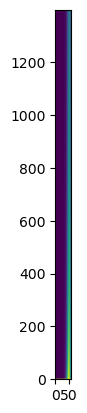

s2n_min:  0.12413453265133319
1400
checking idx_dc:  1


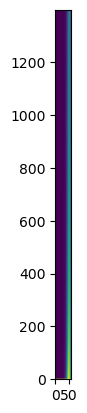

s2n_min:  0.12005277318301744
1400
checking idx_dc:  2


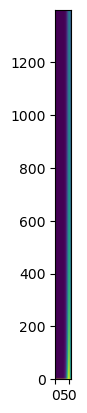

s2n_min:  0.11379811546944427
1400
checking idx_dc:  3


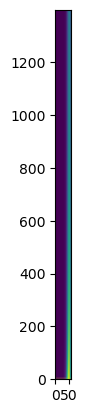

s2n_min:  0.10842912316969007
1400
checking idx_dc:  4


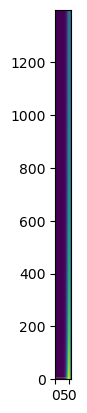

s2n_min:  0.10375474844657136
1400
checking idx_dc:  5


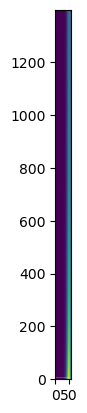

s2n_min:  0.0996370700876022
1400
checking idx_dc:  6


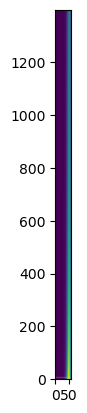

s2n_min:  0.09597369318713839
1400
checking idx_dc:  7


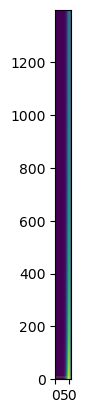

s2n_min:  0.09268678797324052
1400
checking idx_dc:  8


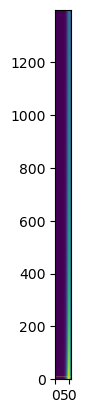

s2n_min:  0.08971599753245765
1400
checking idx_dc:  9


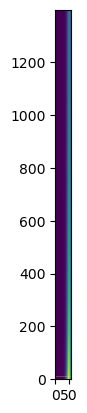

s2n_min:  0.08701369766249553
1400
checking idx_dc:  10


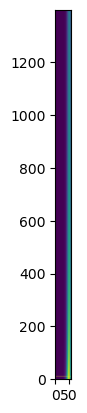

s2n_min:  0.0845417392595512
1400
checking idx_dc:  11


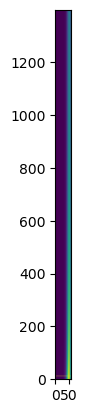

s2n_min:  0.08226915467856089
1400
checking idx_dc:  12


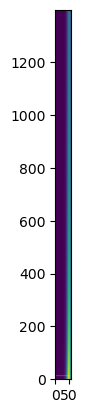

s2n_min:  0.08017050812653537
1400
checking idx_dc:  13


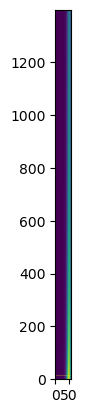

s2n_min:  0.07822468673179152
1400
checking idx_dc:  14


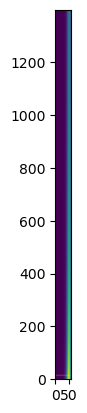

s2n_min:  0.0764139995956108
1400
checking idx_dc:  15


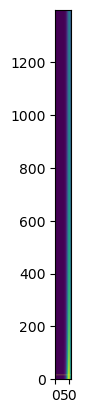

s2n_min:  0.07472349619809605
1400
checking idx_dc:  16


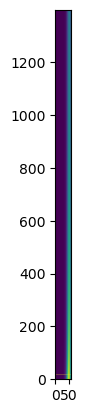

s2n_min:  0.07314044371282342
1400
checking idx_dc:  17


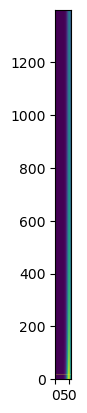

s2n_min:  0.07165392122341663
1400
checking idx_dc:  18


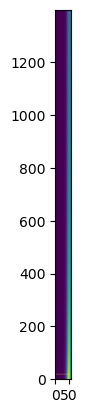

s2n_min:  0.07025450114793783
1400
checking idx_dc:  19


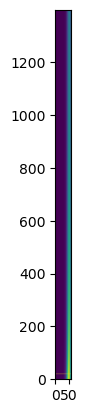

s2n_min:  0.0689339965531287
1400
checking idx_dc:  20


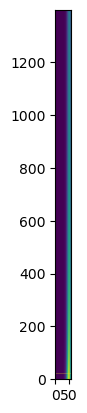

s2n_min:  0.06768525883581603
1400
checking idx_dc:  21


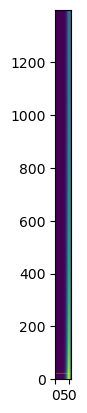

s2n_min:  0.0665020143209399
1400
checking idx_dc:  22


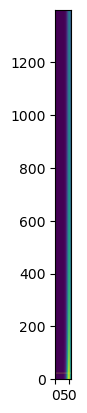

s2n_min:  0.06537873122796714
1400
checking idx_dc:  23


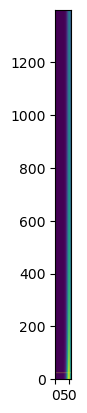

s2n_min:  0.06431051055326041
1400
checking idx_dc:  24


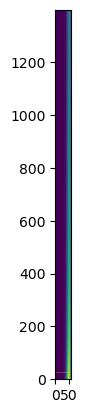

s2n_min:  0.0632929959478427
1400
checking idx_dc:  25


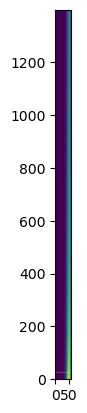

s2n_min:  0.0623222988023258
1400
checking idx_dc:  26


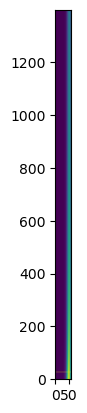

s2n_min:  0.061394935596564754
1400
checking idx_dc:  27


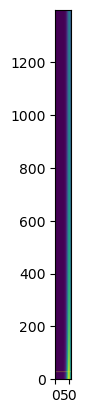

s2n_min:  0.06050777520955492
1400
checking idx_dc:  28


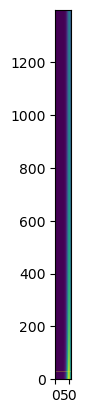

s2n_min:  0.059657994370684815
1400
checking idx_dc:  29


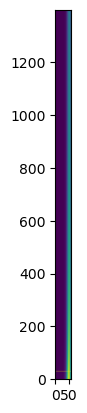

s2n_min:  0.05884303980625259
1400
checking idx_dc:  30


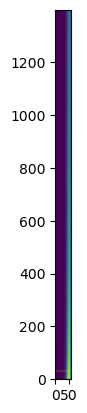

s2n_min:  0.05806059592365503
1400
checking idx_dc:  31


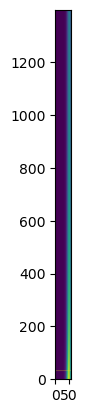

s2n_min:  0.057308557100615796
1400
checking idx_dc:  32


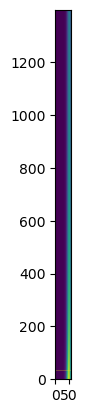

s2n_min:  0.05658500382348276
1400
checking idx_dc:  33


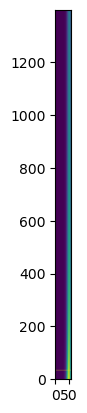

s2n_min:  0.055888182058293545
1400
checking idx_dc:  34


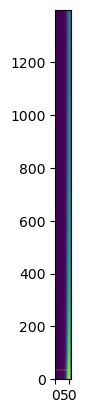

s2n_min:  0.055216485349435795
1400
checking idx_dc:  35


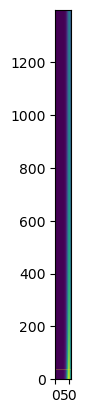

s2n_min:  0.05456843922967889
1400
checking idx_dc:  36


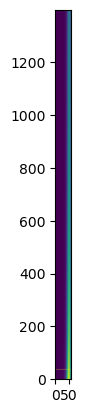

s2n_min:  0.05394268759696009
1400
checking idx_dc:  37


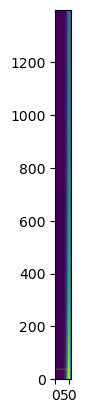

s2n_min:  0.05333798077126611
1400
checking idx_dc:  38


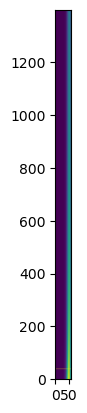

s2n_min:  0.05275316499210366
1400
checking idx_dc:  39


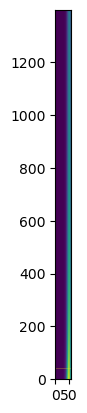

s2n_min:  0.05218717315560352
1400
checking idx_dc:  40


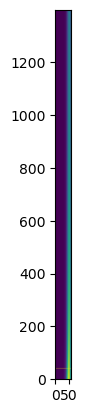

s2n_min:  0.05163901662196868
1400
checking idx_dc:  41


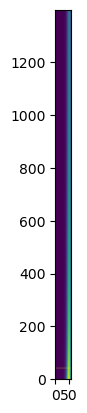

s2n_min:  0.05110777795010426
1400
checking idx_dc:  42


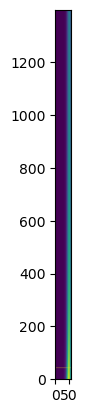

s2n_min:  0.05059260443791632
1400
checking idx_dc:  43


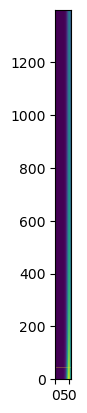

s2n_min:  0.05009270236477847
1400
checking idx_dc:  44


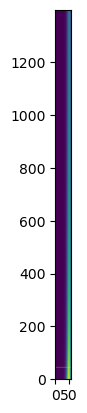

s2n_min:  0.04960733184771049
1400
checking idx_dc:  45


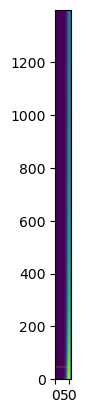

s2n_min:  0.049135802235426185
1400
checking idx_dc:  46


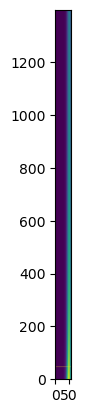

s2n_min:  0.04867746797502073
1400
checking idx_dc:  47


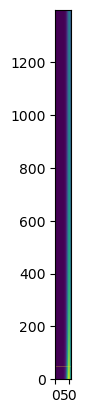

s2n_min:  0.048231724895028694
1400
checking idx_dc:  48


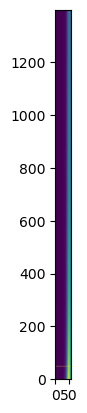

s2n_min:  0.047798006856174136
1400
checking idx_dc:  49


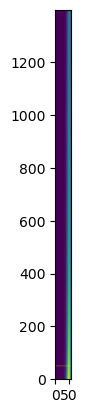

s2n_min:  0.04737578272758529
1400
checking idx_dc:  50


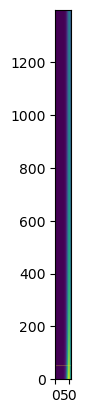

s2n_min:  0.04696455365174461
1400
checking idx_dc:  51


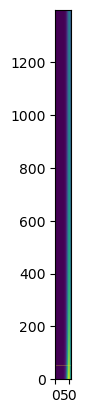

s2n_min:  0.04656385056614635
1400
checking idx_dc:  52


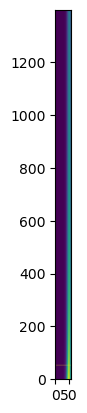

s2n_min:  0.046173231953664025
1400
checking idx_dc:  53


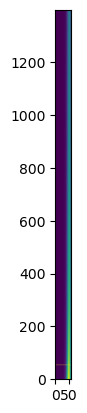

s2n_min:  0.04579228179709562
1400
checking idx_dc:  54


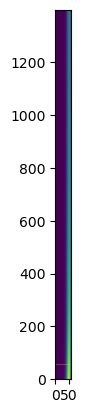

s2n_min:  0.04542060771634125
1400
checking idx_dc:  55


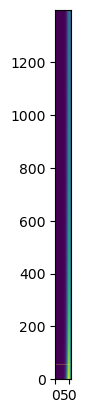

s2n_min:  0.045057839269249236
1400
checking idx_dc:  56


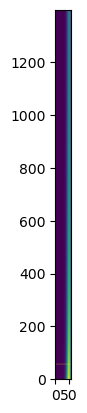

s2n_min:  0.0447036263994033
1400
checking idx_dc:  57


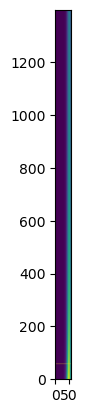

s2n_min:  0.04435763801606529
1400
checking idx_dc:  58


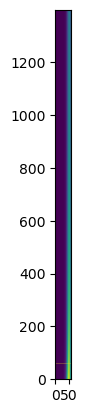

s2n_min:  0.04401956069317873
1400
checking idx_dc:  59


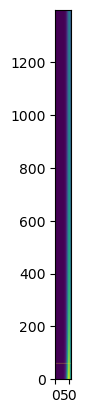

s2n_min:  0.04368909747581264
1400
checking idx_dc:  60


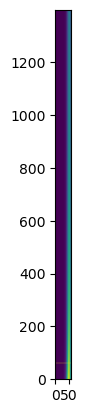

s2n_min:  0.04336596678371494
1400
checking idx_dc:  61


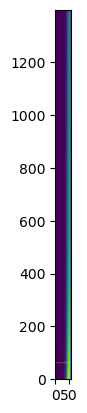

s2n_min:  0.04304990140277377
1400
checking idx_dc:  62


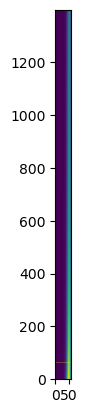

s2n_min:  0.04274064755617695
1400
checking idx_dc:  63


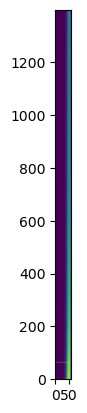

s2n_min:  0.042437964047931764
1400
checking idx_dc:  64


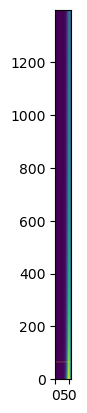

s2n_min:  0.042141621472175955
1400
checking idx_dc:  65


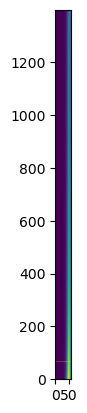

s2n_min:  0.04185140148238949
1400
checking idx_dc:  66


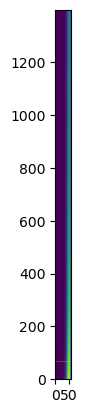

s2n_min:  0.04156709611521705
1400
checking idx_dc:  67


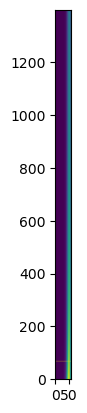

s2n_min:  0.041288507164142535
1400
checking idx_dc:  68


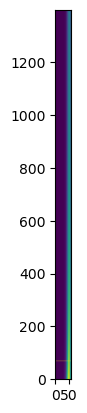

s2n_min:  0.04101544559872975
1400
checking idx_dc:  69


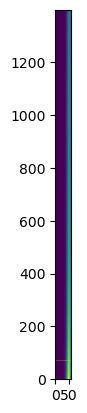

s2n_min:  0.04074773102556237
1400
checking idx_dc:  70


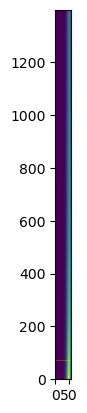

s2n_min:  0.040485191187390426
1400
checking idx_dc:  71


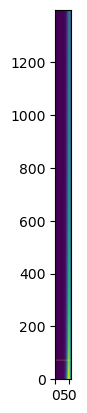

s2n_min:  0.04022766149732377
1400
checking idx_dc:  72


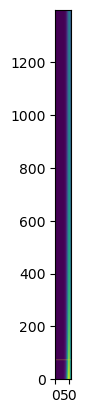

s2n_min:  0.03997498460521047
1400
checking idx_dc:  73


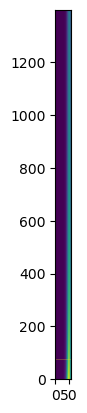

s2n_min:  0.03972700999360475
1400
checking idx_dc:  74


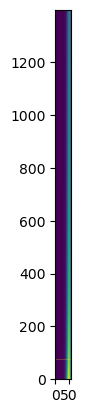

s2n_min:  0.039483593600967336
1400
checking idx_dc:  75


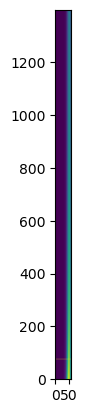

s2n_min:  0.03924459746995529
1400
checking idx_dc:  76


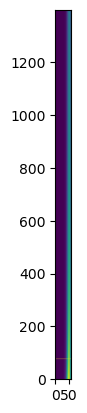

s2n_min:  0.0390098894188505
1400
checking idx_dc:  77


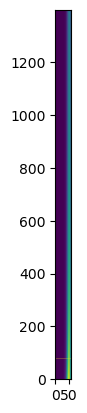

s2n_min:  0.03877934273434918
1400
checking idx_dc:  78


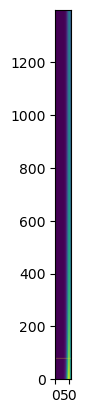

s2n_min:  0.038552835884090135
1400
checking idx_dc:  79


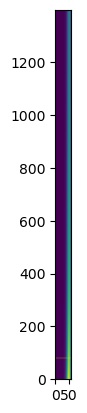

s2n_min:  0.03833025224744047
1400
checking idx_dc:  80


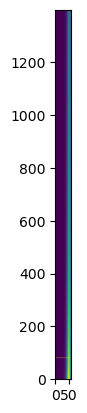

s2n_min:  0.03811147986318385
1400
checking idx_dc:  81


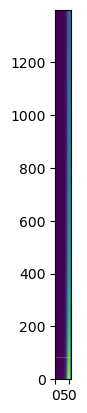

s2n_min:  0.03789641119287133
1400
checking idx_dc:  82


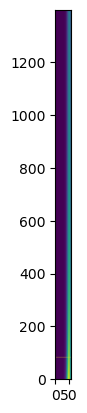

s2n_min:  0.03768494289869861
1400
checking idx_dc:  83


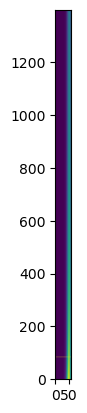

s2n_min:  0.037476975634867404
1400
checking idx_dc:  84


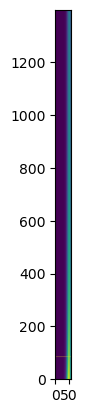

s2n_min:  0.037272413851474166
1400
checking idx_dc:  85


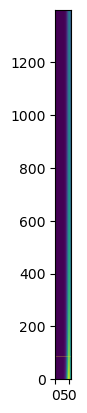

s2n_min:  0.03707116561004676
1400
checking idx_dc:  86


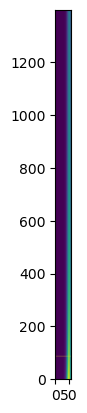

s2n_min:  0.0368731424099203
1400
checking idx_dc:  87


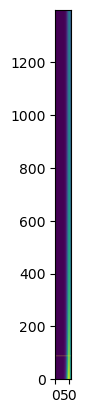

s2n_min:  0.03667825902470729
1400
checking idx_dc:  88


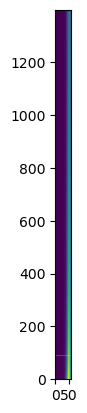

s2n_min:  0.03648643334817577
1400
checking idx_dc:  89


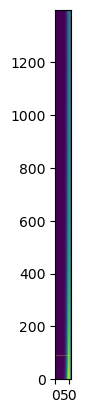

s2n_min:  0.03629758624890246
1400
checking idx_dc:  90


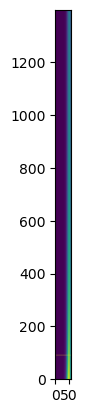

s2n_min:  0.03611164143311648
1400
checking idx_dc:  91


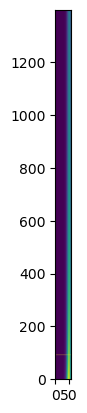

s2n_min:  0.03592852531519368
1400
checking idx_dc:  92


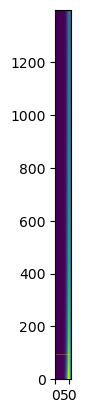

s2n_min:  0.035748166895302344
1400
checking idx_dc:  93


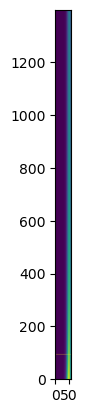

s2n_min:  0.0355704976437382
1400
checking idx_dc:  94


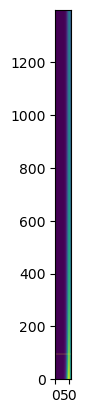

s2n_min:  0.03539545139152068
1400
checking idx_dc:  95


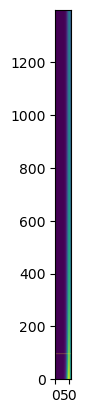

s2n_min:  0.03522296422685391
1400
checking idx_dc:  96


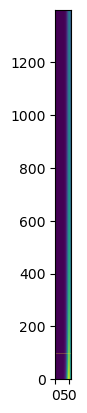

s2n_min:  0.0350529743970844
1400
checking idx_dc:  97


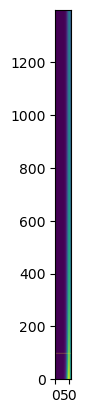

s2n_min:  0.03488542221581386
1400
checking idx_dc:  98


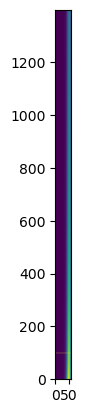

s2n_min:  0.0347202499748498
1400
checking idx_dc:  99


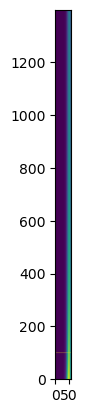

s2n_min:  0.03455740186069904
1400
checking idx_dc:  100


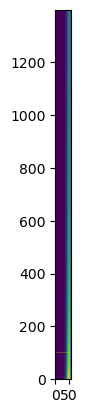

s2n_min:  0.03439682387532959
1400
checking idx_dc:  101


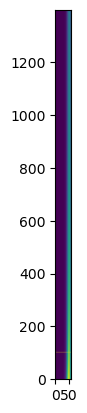

s2n_min:  0.03423846376094543
1400
checking idx_dc:  102


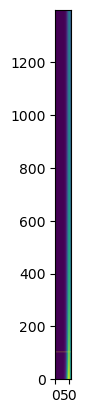

s2n_min:  0.034082270928536315
1400
checking idx_dc:  103


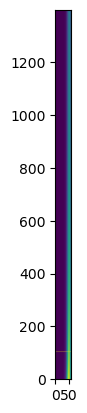

s2n_min:  0.03392819638998058
1400
checking idx_dc:  104


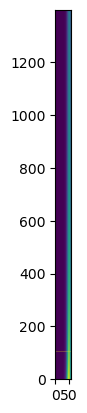

s2n_min:  0.033776192693494224
1400
checking idx_dc:  105


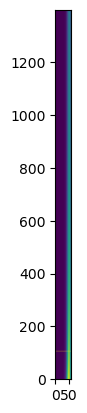

s2n_min:  0.03362621386223279
1400
checking idx_dc:  106


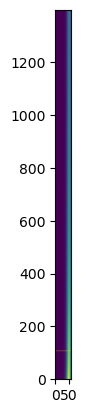

s2n_min:  0.033478215335866
1400
checking idx_dc:  107


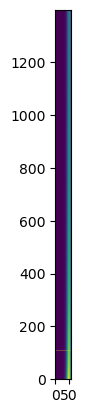

s2n_min:  0.03333215391495633
1400
checking idx_dc:  108


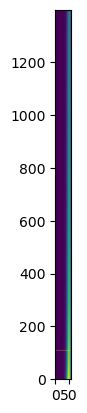

s2n_min:  0.03318798770798377
1400
checking idx_dc:  109


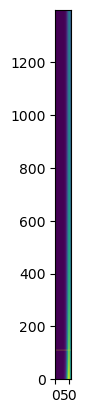

s2n_min:  0.03304567608086962
1400
checking idx_dc:  110


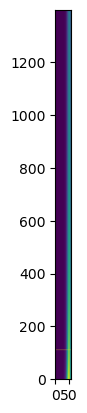

s2n_min:  0.032905179608860746
1400
checking idx_dc:  111


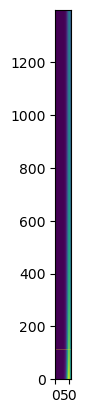

s2n_min:  0.03276646003064526
1400
checking idx_dc:  112


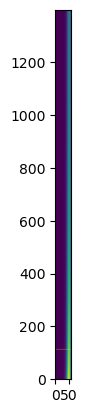

s2n_min:  0.032629480204578266
1400
checking idx_dc:  113


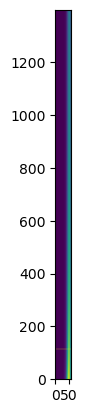

s2n_min:  0.03249420406690378
1400
checking idx_dc:  114


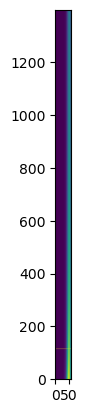

s2n_min:  0.03236059659186642
1400
checking idx_dc:  115


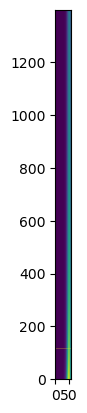

s2n_min:  0.03222862375361245
1400
checking idx_dc:  116


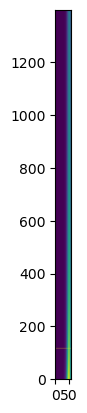

s2n_min:  0.032098252489786074
1400
checking idx_dc:  117


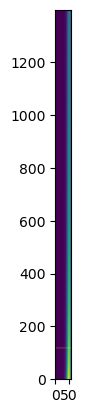

s2n_min:  0.03196945066673279
1400
checking idx_dc:  118


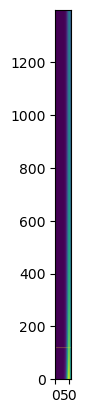

s2n_min:  0.03184218704622627
1400
checking idx_dc:  119


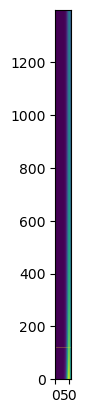

s2n_min:  0.03171643125364086
1400
checking idx_dc:  120


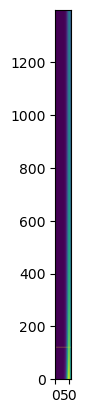

s2n_min:  0.03159215374749592
1400
checking idx_dc:  121


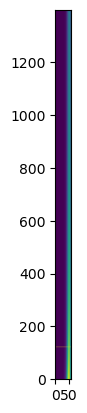

s2n_min:  0.03146932579030262
1400
checking idx_dc:  122


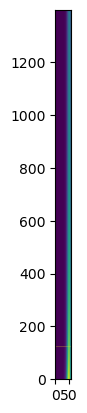

s2n_min:  0.031347919420648046
1400
checking idx_dc:  123


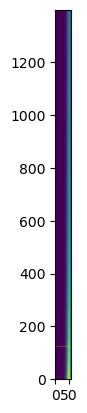

s2n_min:  0.03122790742645479
1400
checking idx_dc:  124


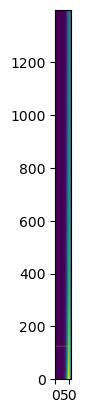

s2n_min:  0.031109263319358208
1400
checking idx_dc:  125


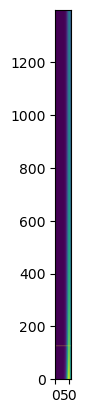

s2n_min:  0.030991961310146372
1400
checking idx_dc:  126


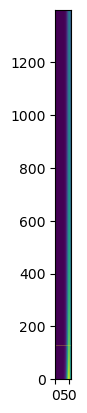

s2n_min:  0.030875976285211135
1400
checking idx_dc:  127


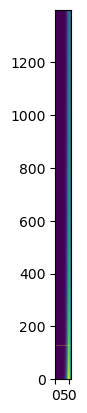

s2n_min:  0.030761283783961424
1400
checking idx_dc:  128


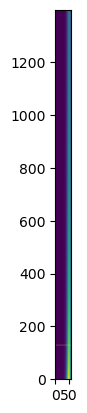

s2n_min:  0.030647859977152636
1400
checking idx_dc:  129


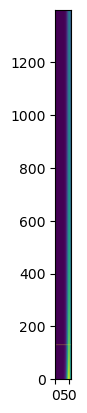

s2n_min:  0.030535681646088563
1400
checking idx_dc:  130


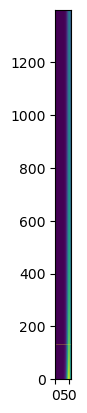

s2n_min:  0.03042472616265464
1400
checking idx_dc:  131


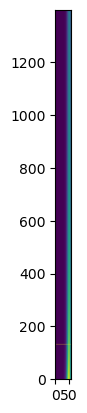

s2n_min:  0.030314971470143493
1400
checking idx_dc:  132


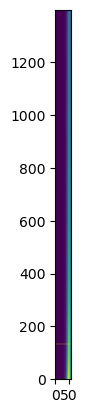

s2n_min:  0.030206396064835953
1400
checking idx_dc:  133


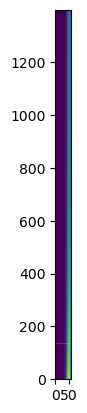

s2n_min:  0.030098978978302507
1400
checking idx_dc:  134


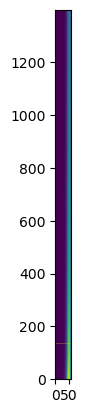

s2n_min:  0.029992699760392268
1400
checking idx_dc:  135


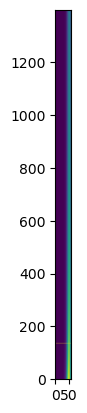

s2n_min:  0.029887538462877988
1400
checking idx_dc:  136


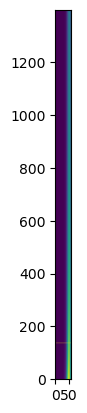

s2n_min:  0.029783475623727473
1400
checking idx_dc:  137


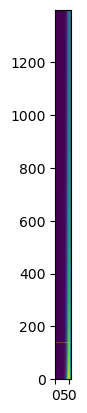

s2n_min:  0.029680492251973296
1400
checking idx_dc:  138


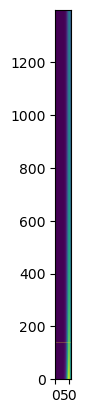

s2n_min:  0.029578569813153946
1400
checking idx_dc:  139


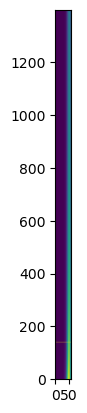

s2n_min:  0.02947769021530129
1400
checking idx_dc:  140


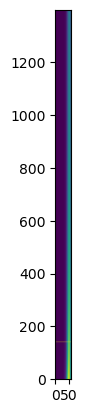

s2n_min:  0.029377835795450103
1400
checking idx_dc:  141


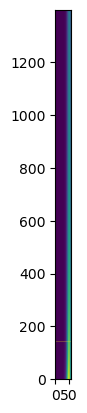

s2n_min:  0.029278989306646894
1400
checking idx_dc:  142


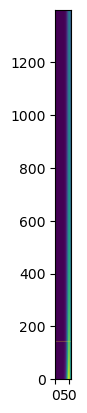

s2n_min:  0.029181133905436408
1400
checking idx_dc:  143


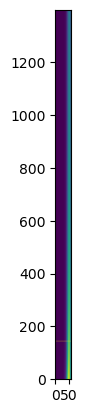

s2n_min:  0.029084253139805043
1400
checking idx_dc:  144


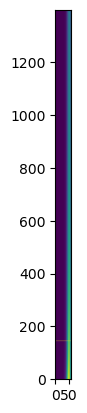

s2n_min:  0.028988330937561757
1400
checking idx_dc:  145


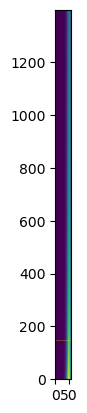

s2n_min:  0.02889335159513765
1400
checking idx_dc:  146


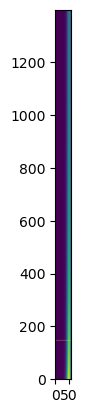

s2n_min:  0.028799299766786673
1400
checking idx_dc:  147


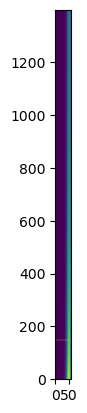

s2n_min:  0.028706160454170498
1400
checking idx_dc:  148


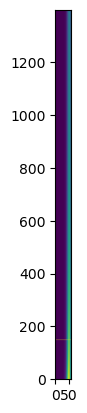

s2n_min:  0.028613918996311497
1400
checking idx_dc:  149


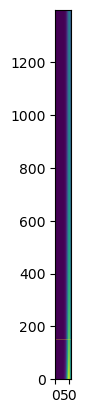

s2n_min:  0.02852256105989866
1400
checking idx_dc:  150


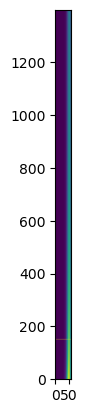

s2n_min:  0.028432072629931703
1400
checking idx_dc:  151


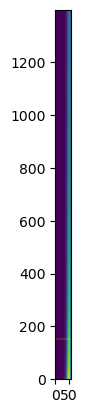

s2n_min:  0.02834244000068974
1400
checking idx_dc:  152


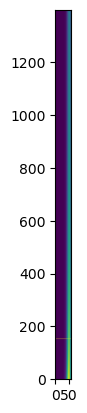

s2n_min:  0.028253649767011106
1400
checking idx_dc:  153


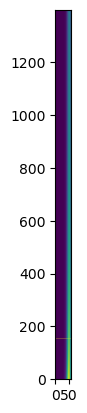

s2n_min:  0.028165688815871805
1400
checking idx_dc:  154


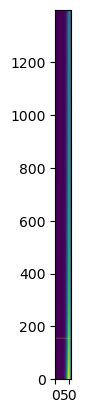

s2n_min:  0.028078544318250645
1400
checking idx_dc:  155


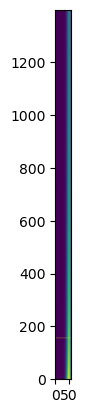

s2n_min:  0.027992203721269475
1400
checking idx_dc:  156


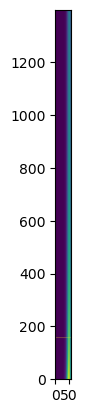

s2n_min:  0.027906654740597663
1400
checking idx_dc:  157


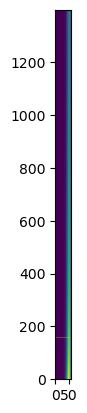

s2n_min:  0.02782188535311041
1400
checking idx_dc:  158


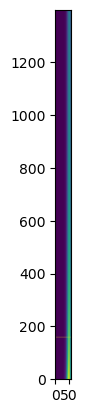

s2n_min:  0.027737883789790828
1400
checking idx_dc:  159


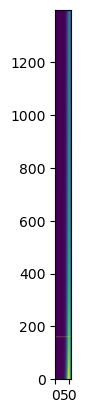

s2n_min:  0.027654638528866408
1400
checking idx_dc:  160


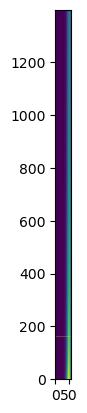

s2n_min:  0.027572138289170663
1400
checking idx_dc:  161


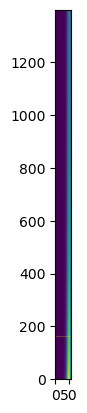

s2n_min:  0.02749037202372138
1400
checking idx_dc:  162


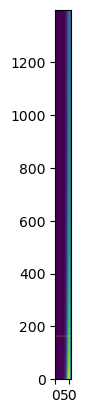

s2n_min:  0.027409328913507083
1400
checking idx_dc:  163


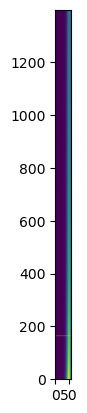

s2n_min:  0.0273289983614738
1400
checking idx_dc:  164


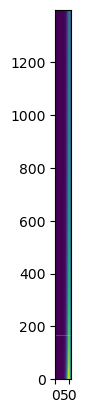

s2n_min:  0.0272493699867046
1400
checking idx_dc:  165


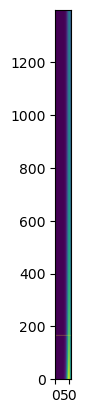

s2n_min:  0.027170433618784583
1400
checking idx_dc:  166


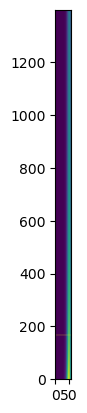

s2n_min:  0.02709217929234439
1400
checking idx_dc:  167


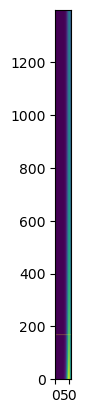

s2n_min:  0.02701459724177559
1400
checking idx_dc:  168


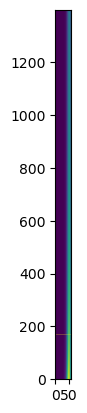

s2n_min:  0.026937677896111595
1400
checking idx_dc:  169


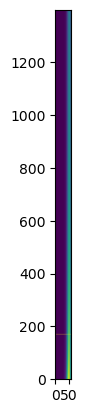

s2n_min:  0.026861411874068014
1400
checking idx_dc:  170


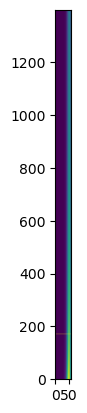

s2n_min:  0.026785789979236564
1400
checking idx_dc:  171


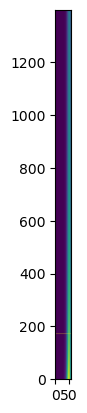

s2n_min:  0.026710803195427006
1400
checking idx_dc:  172


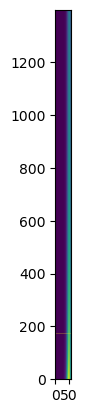

s2n_min:  0.026636442682151734
1400
checking idx_dc:  173


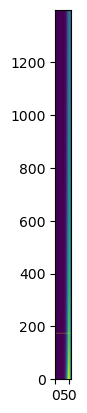

s2n_min:  0.02656269977024784
1400
checking idx_dc:  174


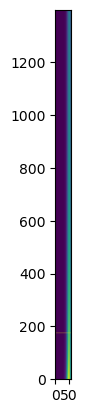

s2n_min:  0.026489565957631807
1400
checking idx_dc:  175


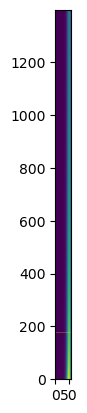

s2n_min:  0.026417032905182065
1400
checking idx_dc:  176


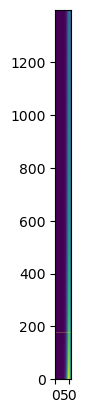

s2n_min:  0.026345092432744844
1400
checking idx_dc:  177


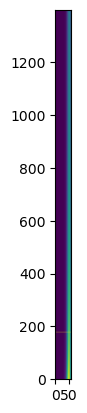

s2n_min:  0.026273736515259105
1400
checking idx_dc:  178


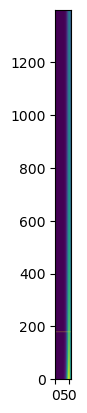

s2n_min:  0.026202957278996228
1400
checking idx_dc:  179


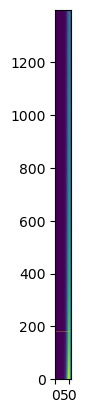

s2n_min:  0.026132746997910593
1400
checking idx_dc:  180


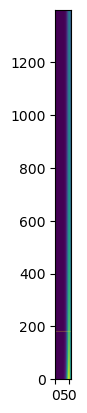

s2n_min:  0.026063098090097103
1400
checking idx_dc:  181


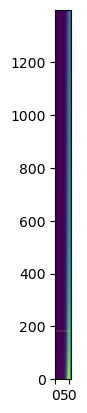

s2n_min:  0.025994003114352033
1400
checking idx_dc:  182


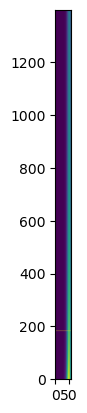

s2n_min:  0.025925454766833677
1400
checking idx_dc:  183


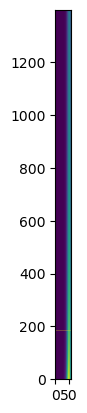

s2n_min:  0.025857445877819272
1400
checking idx_dc:  184


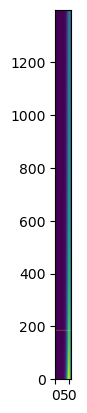

s2n_min:  0.025789969408555102
1400
checking idx_dc:  185


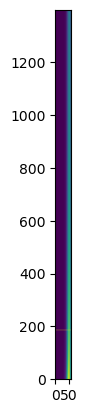

s2n_min:  0.025723018448196508
1400
checking idx_dc:  186


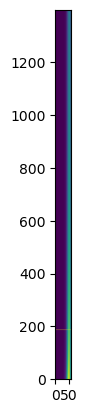

s2n_min:  0.02565658621083481
1400
checking idx_dc:  187


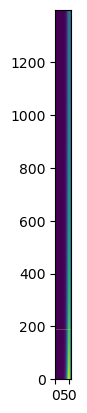

s2n_min:  0.02559066603260832
1400
checking idx_dc:  188


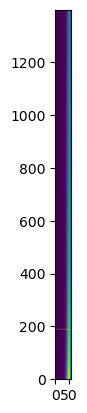

s2n_min:  0.025525251368894518
1400
checking idx_dc:  189


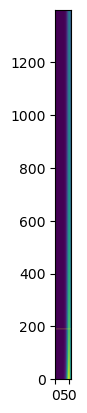

s2n_min:  0.02546033579158081
1400
checking idx_dc:  190


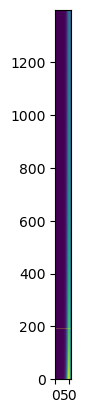

s2n_min:  0.025395912986411275
1400
checking idx_dc:  191


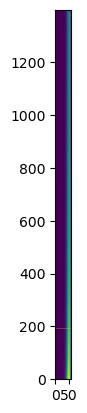

s2n_min:  0.02533197675040684
1400
checking idx_dc:  192


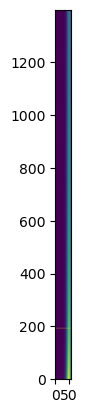

s2n_min:  0.025268520989356582
1400
checking idx_dc:  193


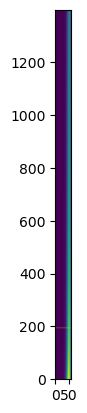

s2n_min:  0.02520553971537778
1400
checking idx_dc:  194


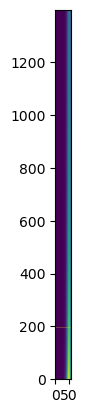

s2n_min:  0.025143027044542566
1400
checking idx_dc:  195


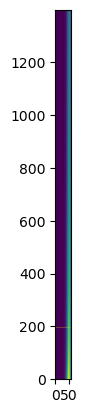

s2n_min:  0.025080977194568962
1400
checking idx_dc:  196


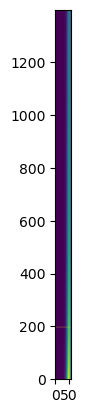

s2n_min:  0.025019384482574347
1400
checking idx_dc:  197


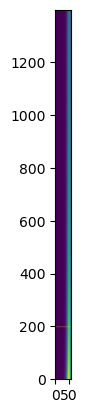

s2n_min:  0.02495824332288927
1400
checking idx_dc:  198


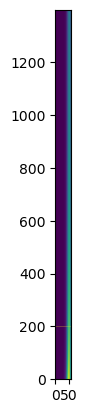

s2n_min:  0.024897548224929737
1400
checking idx_dc:  199


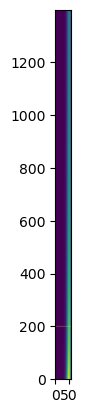

s2n_min:  0.024837293791126185
1400
checking idx_dc:  200


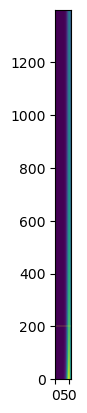

s2n_min:  0.024777474714907294
1400
checking idx_dc:  201


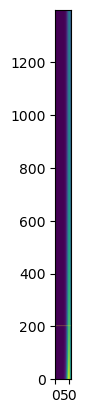

s2n_min:  0.02471808577873695
1400
checking idx_dc:  202


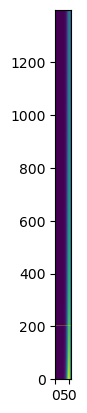

s2n_min:  0.024659121852202752
1400
checking idx_dc:  203


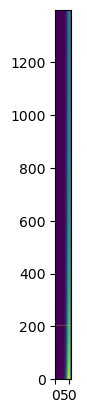

s2n_min:  0.024600577890154397
1400
checking idx_dc:  204


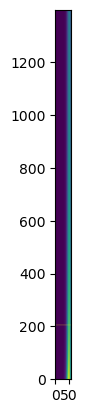

s2n_min:  0.024542448930890484
1400
checking idx_dc:  205


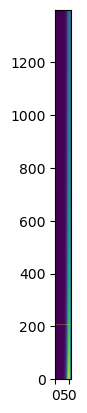

s2n_min:  0.02448473009439221
1400
checking idx_dc:  206


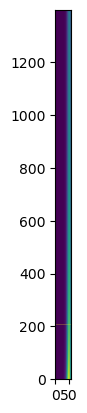

s2n_min:  0.02442741658060255
1400
checking idx_dc:  207


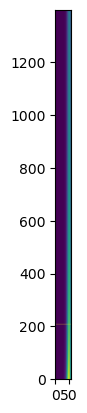

s2n_min:  0.024370503667749555
1400
checking idx_dc:  208


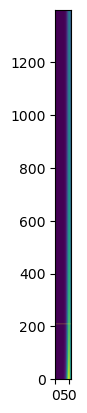

s2n_min:  0.02431398671071238
1400
checking idx_dc:  209


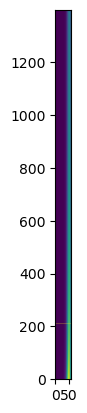

s2n_min:  0.024257861139428846
1400
checking idx_dc:  210


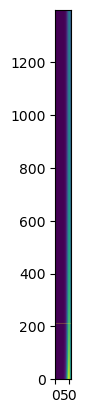

s2n_min:  0.024202122457343243
1400
checking idx_dc:  211


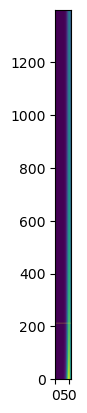

s2n_min:  0.024146766239893147
1400
checking idx_dc:  212


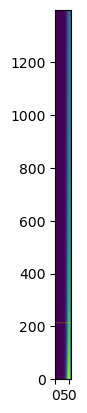

s2n_min:  0.024091788133034205
1400
checking idx_dc:  213


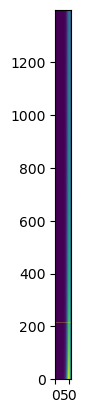

s2n_min:  0.024037183851801643
1400
checking idx_dc:  214


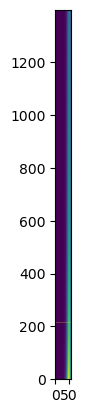

s2n_min:  0.023982949178907476
1400
checking idx_dc:  215


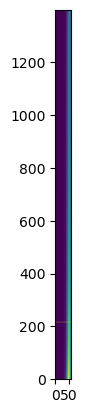

s2n_min:  0.023929079963372422
1400
checking idx_dc:  216


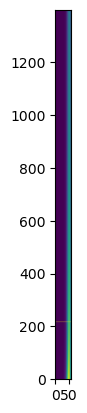

s2n_min:  0.023875572119191436
1400
checking idx_dc:  217


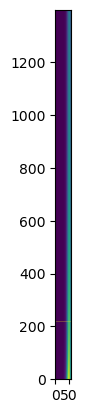

s2n_min:  0.02382242162403191
1400
checking idx_dc:  218


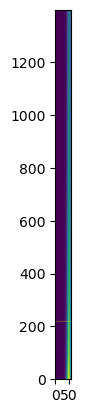

s2n_min:  0.023769624517963658
1400
checking idx_dc:  219


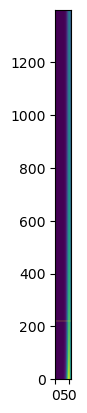

s2n_min:  0.023717176902219653
1400
checking idx_dc:  220


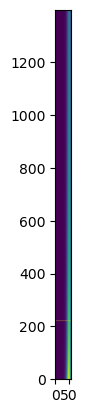

s2n_min:  0.02366507493798679
1400
checking idx_dc:  221


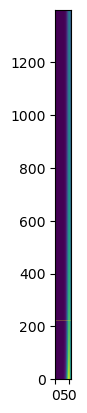

s2n_min:  0.02361331484522568
1400
checking idx_dc:  222


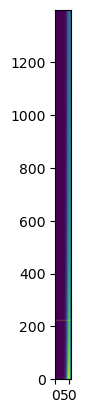

s2n_min:  0.023561892901518756
1400
checking idx_dc:  223


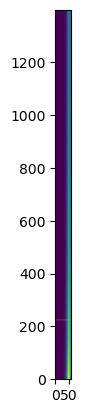

s2n_min:  0.023510805440945835
1400
checking idx_dc:  224


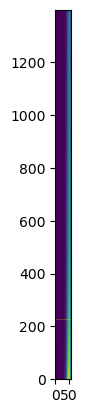

s2n_min:  0.02346004885298636
1400
checking idx_dc:  225


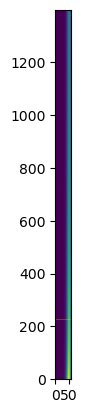

s2n_min:  0.02340961958144766
1400
checking idx_dc:  226


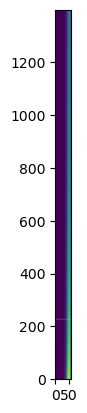

s2n_min:  0.02335951412341838
1400
checking idx_dc:  227


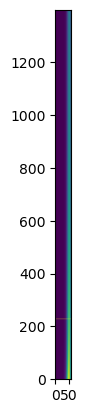

s2n_min:  0.023309729028246476
1400
checking idx_dc:  228


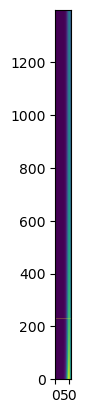

s2n_min:  0.02326026089654109
1400
checking idx_dc:  229


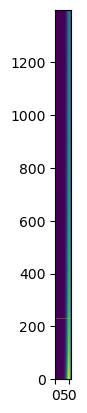

s2n_min:  0.023211106379197554
1400
checking idx_dc:  230


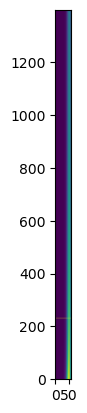

s2n_min:  0.023162262176445063
1400
checking idx_dc:  231


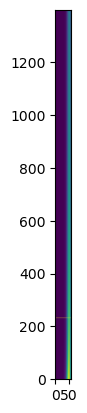

s2n_min:  0.023113725036916208
1400
checking idx_dc:  232


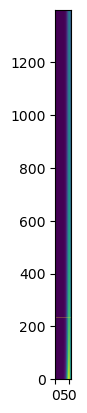

s2n_min:  0.023065491756737937
1400
checking idx_dc:  233


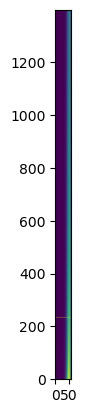

s2n_min:  0.023017559178643253
1400
checking idx_dc:  234


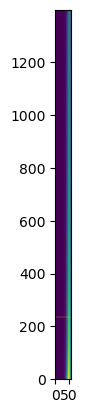

s2n_min:  0.02296992419110314
1400
checking idx_dc:  235


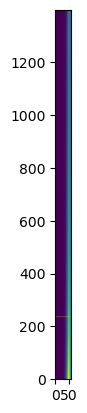

s2n_min:  0.022922583727478196
1400
checking idx_dc:  236


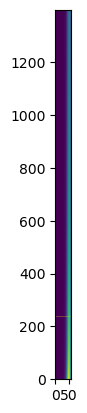

s2n_min:  0.022875534765189384
1400
checking idx_dc:  237


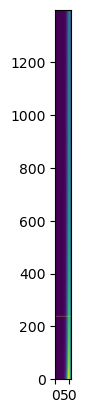

s2n_min:  0.022828774324907455
1400
checking idx_dc:  238


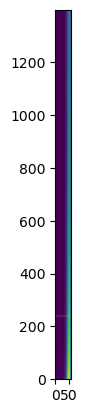

s2n_min:  0.022782299469760514
1400
checking idx_dc:  239


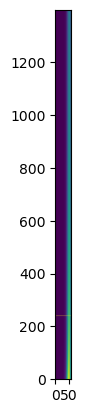

s2n_min:  0.022736107304559248
1400
checking idx_dc:  240


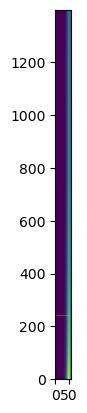

s2n_min:  0.0226901949750394
1400
checking idx_dc:  241


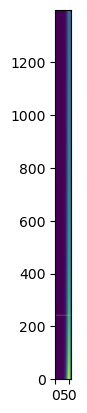

s2n_min:  0.022644559667120957
1400
checking idx_dc:  242


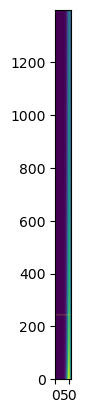

s2n_min:  0.02259919860618367
1400
checking idx_dc:  243


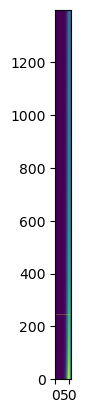

s2n_min:  0.022554109056358535
1400
checking idx_dc:  244


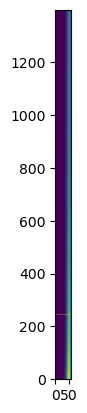

s2n_min:  0.022509288319834665
1400
checking idx_dc:  245


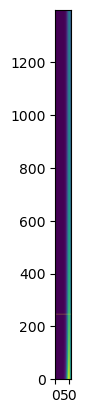

s2n_min:  0.022464733736181325
1400
checking idx_dc:  246


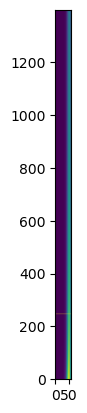

s2n_min:  0.02242044268168465
1400
checking idx_dc:  247


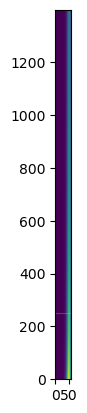

s2n_min:  0.022376412568698677
1400
checking idx_dc:  248


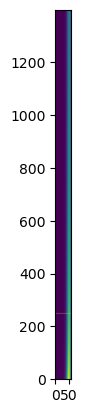

s2n_min:  0.02233264084501038
1400
checking idx_dc:  249


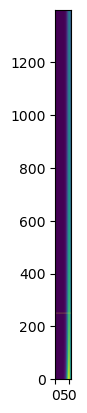

s2n_min:  0.022289124993218237
1400
checking idx_dc:  250


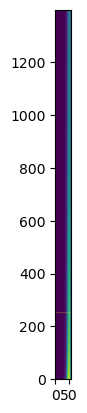

s2n_min:  0.022245862530124182
1400
checking idx_dc:  251


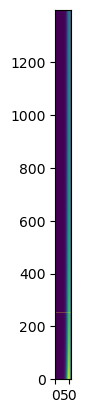

s2n_min:  0.022202851006138374
1400
checking idx_dc:  252


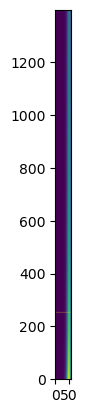

s2n_min:  0.022160088004696647
1400
checking idx_dc:  253


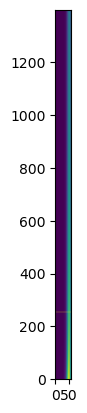

s2n_min:  0.022117571141690235
1400
checking idx_dc:  254


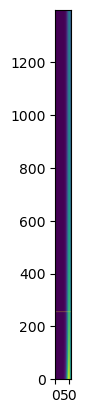

s2n_min:  0.02207529806490748
1400
checking idx_dc:  255


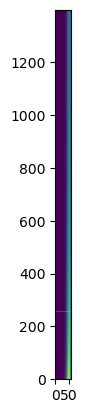

s2n_min:  0.022033266453487237
1400
checking idx_dc:  256


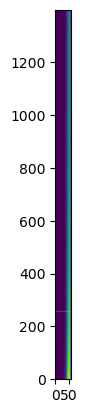

s2n_min:  0.021991474017383685
1400
checking idx_dc:  257


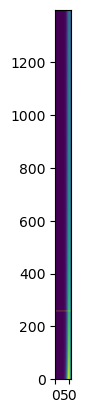

s2n_min:  0.021949918496842274
1400
checking idx_dc:  258


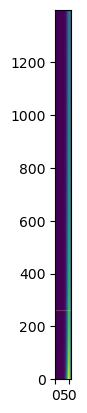

s2n_min:  0.021908597661886516
1400
checking idx_dc:  259


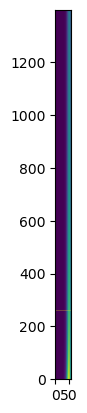

s2n_min:  0.021867509311815317
1400
checking idx_dc:  260


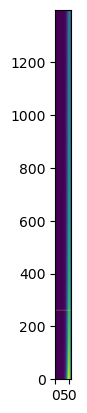

s2n_min:  0.021826651274710732
1400
checking idx_dc:  261


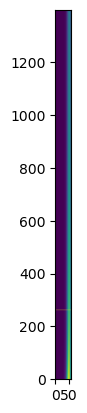

s2n_min:  0.02178602140695575
1400
checking idx_dc:  262


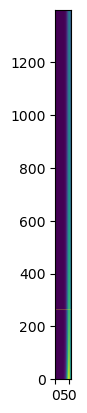

s2n_min:  0.021745617592761866
1400
checking idx_dc:  263


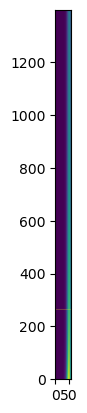

s2n_min:  0.021705437743706372
1400
checking idx_dc:  264


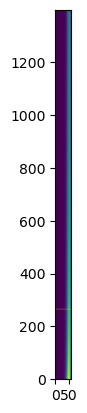

s2n_min:  0.0216654797982789
1400
checking idx_dc:  265


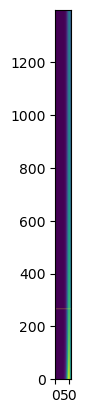

s2n_min:  0.021625741721437188
1400
checking idx_dc:  266


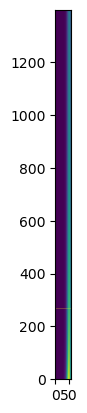

s2n_min:  0.021586221504171763
1400
checking idx_dc:  267


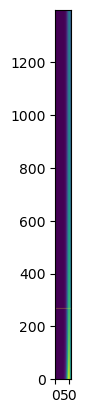

s2n_min:  0.021546917163079316
1400
checking idx_dc:  268


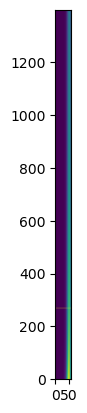

s2n_min:  0.021507826739944617
1400
checking idx_dc:  269


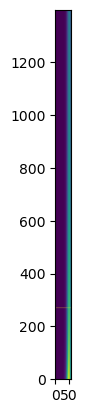

s2n_min:  0.021468948301330733
1400
checking idx_dc:  270


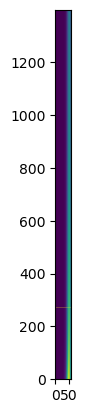

s2n_min:  0.021430279938177362
1400
checking idx_dc:  271


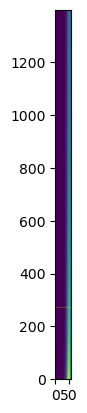

s2n_min:  0.021391819765407123
1400
checking idx_dc:  272


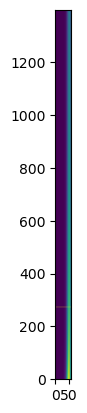

s2n_min:  0.021353565921539527
1400
checking idx_dc:  273


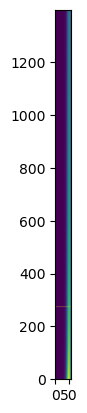

s2n_min:  0.02131551656831261
1400
checking idx_dc:  274


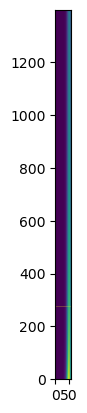

s2n_min:  0.021277669890311848
1400
checking idx_dc:  275


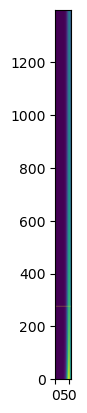

s2n_min:  0.021240024094606392
1400
checking idx_dc:  276


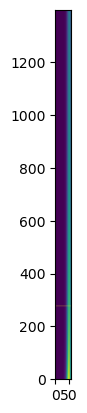

s2n_min:  0.021202577410392293
1400
checking idx_dc:  277


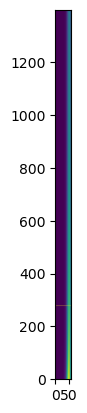

s2n_min:  0.02116532808864263
1400
checking idx_dc:  278


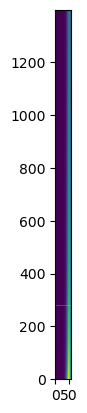

s2n_min:  0.021128274401764423
1400
checking idx_dc:  279


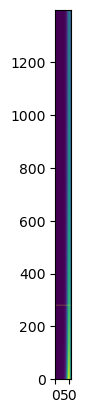

s2n_min:  0.02109141464326206
1400
checking idx_dc:  280


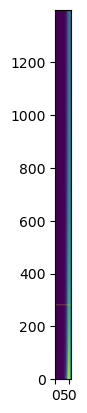

s2n_min:  0.021054747127407226
1400
checking idx_dc:  281


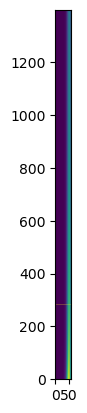

s2n_min:  0.02101827018891506
1400
checking idx_dc:  282


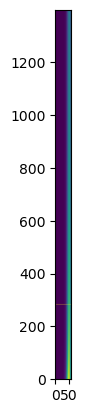

s2n_min:  0.020981982182626518
1400
checking idx_dc:  283


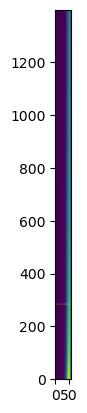

s2n_min:  0.02094588148319673
1400
checking idx_dc:  284


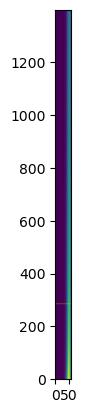

s2n_min:  0.020909966484789187
1400
checking idx_dc:  285


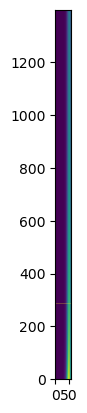

s2n_min:  0.020874235600775774
1400
checking idx_dc:  286


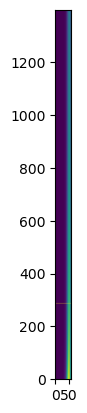

s2n_min:  0.02083868726344233
1400
checking idx_dc:  287


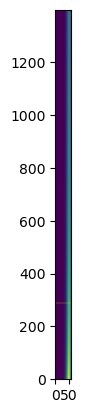

s2n_min:  0.02080331992369973
1400
checking idx_dc:  288


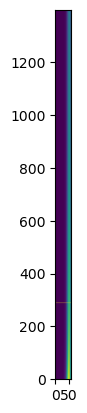

s2n_min:  0.020768132050800407
1400
checking idx_dc:  289


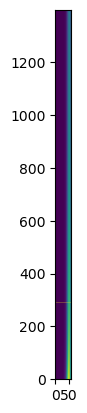

s2n_min:  0.020733122132060026
1400
checking idx_dc:  290


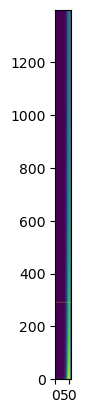

s2n_min:  0.020698288672584372
1400
checking idx_dc:  291


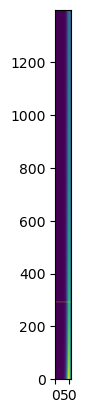

s2n_min:  0.02066363019500125
1400
checking idx_dc:  292


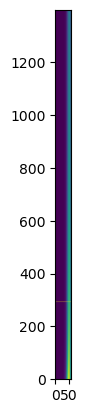

s2n_min:  0.020629145239197316
1400
checking idx_dc:  293


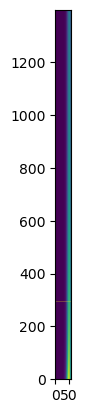

s2n_min:  0.020594832362059688
1400
checking idx_dc:  294


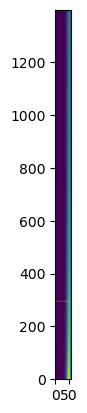

s2n_min:  0.02056069013722232
1400
checking idx_dc:  295


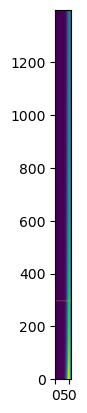

s2n_min:  0.020526717154816947
1400
checking idx_dc:  296


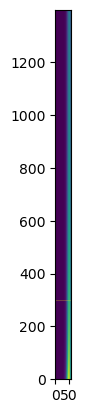

s2n_min:  0.020492912021228556
1400
checking idx_dc:  297


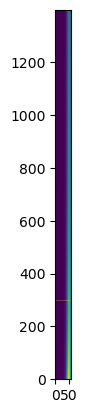

s2n_min:  0.02045927335885528
1400
checking idx_dc:  298


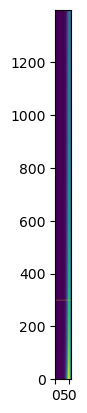

s2n_min:  0.020425799805872592
1400
checking idx_dc:  299


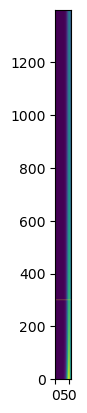

s2n_min:  0.02039249001600175
1400
checking idx_dc:  300


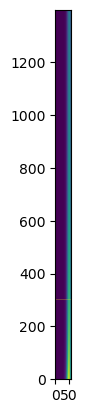

s2n_min:  0.020359342658282376
1400
checking idx_dc:  301


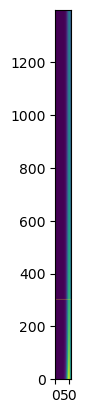

s2n_min:  0.020326356416849066
1400
checking idx_dc:  302


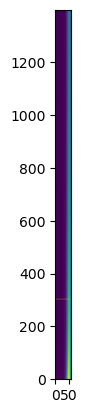

s2n_min:  0.020293529990712024
1400
checking idx_dc:  303


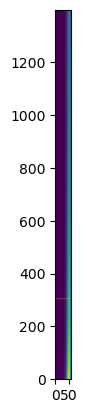

s2n_min:  0.02026086209354152
1400
checking idx_dc:  304


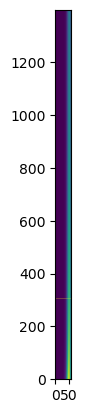

s2n_min:  0.02022835145345617
1400
checking idx_dc:  305


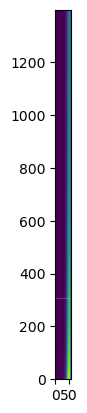

s2n_min:  0.02019599681281498
1400
checking idx_dc:  306


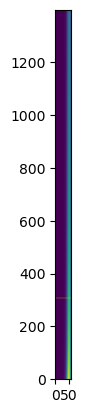

s2n_min:  0.02016379692801297
1400
checking idx_dc:  307


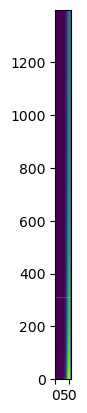

s2n_min:  0.02013175056928043
1400
checking idx_dc:  308


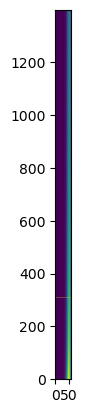

s2n_min:  0.020099856520485647
1400
checking idx_dc:  309


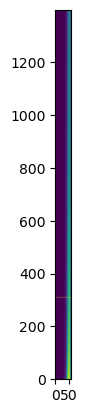

s2n_min:  0.020068113578941057
1400
checking idx_dc:  310


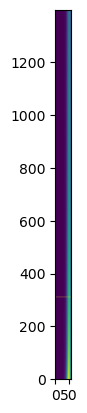

s2n_min:  0.02003652055521276
1400
checking idx_dc:  311


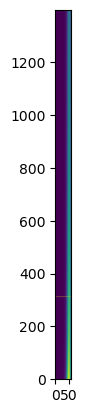

s2n_min:  0.02000507627293333
1400
checking idx_dc:  312


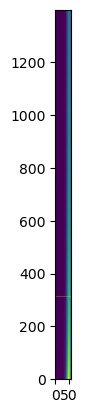

s2n_min:  0.019973779568617834
1400
checking idx_dc:  313


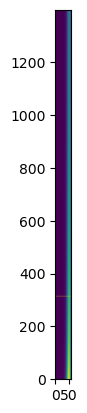

s2n_min:  0.01994262929148301
1400
checking idx_dc:  314


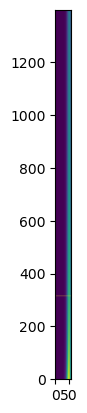

s2n_min:  0.019911624303269555
1400
checking idx_dc:  315


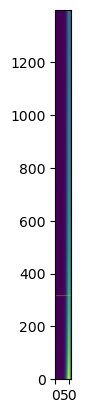

s2n_min:  0.019880763478067408
1400
checking idx_dc:  316


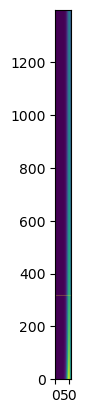

s2n_min:  0.019850045702144027
1400
checking idx_dc:  317


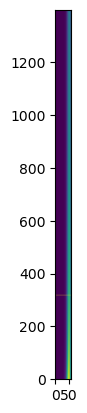

s2n_min:  0.01981946987377559
1400
checking idx_dc:  318


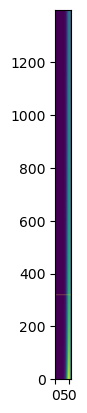

s2n_min:  0.019789034903081
1400
checking idx_dc:  319


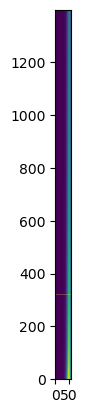

s2n_min:  0.019758739711858733
1400
checking idx_dc:  320


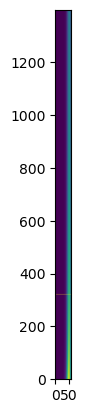

s2n_min:  0.0197285832334264
1400
checking idx_dc:  321


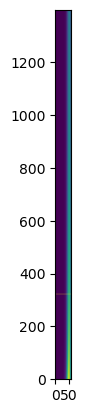

s2n_min:  0.019698564412463006
1400
checking idx_dc:  322


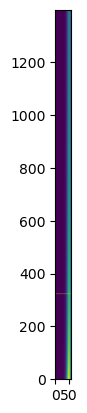

s2n_min:  0.019668682204853818
1400
checking idx_dc:  323


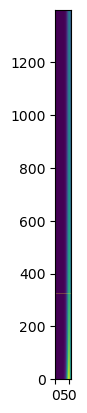

s2n_min:  0.019638935577537854
1400
checking idx_dc:  324


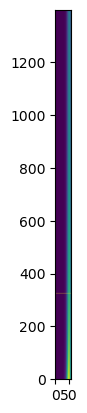

s2n_min:  0.01960932350835786
1400
checking idx_dc:  325


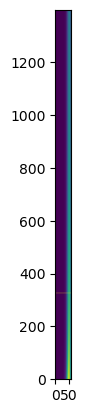

s2n_min:  0.01957984498591279
1400
checking idx_dc:  326


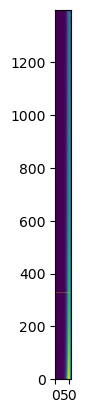

s2n_min:  0.019550499009412733
1400
checking idx_dc:  327


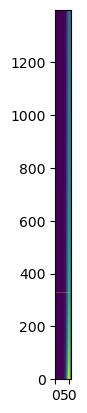

s2n_min:  0.019521284588536185
1400
checking idx_dc:  328


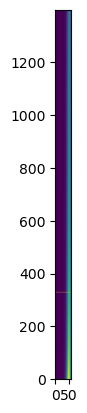

s2n_min:  0.019492200743289678
1400
checking idx_dc:  329


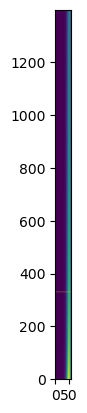

s2n_min:  0.01946324650386973
1400
checking idx_dc:  330


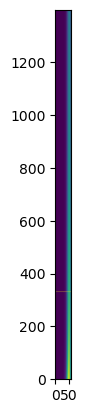

s2n_min:  0.019434420910527
1400
checking idx_dc:  331


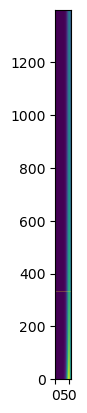

s2n_min:  0.01940572301343267
1400
checking idx_dc:  332


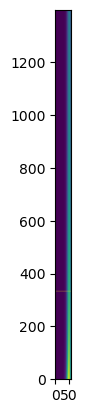

s2n_min:  0.01937715187254701
1400
checking idx_dc:  333


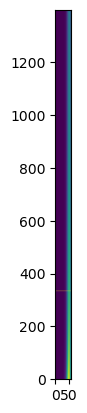

s2n_min:  0.01934870655749002
1400
checking idx_dc:  334


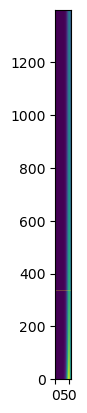

s2n_min:  0.019320386147414204
1400
checking idx_dc:  335


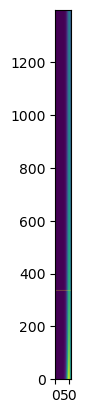

s2n_min:  0.01929218973087933
1400
checking idx_dc:  336


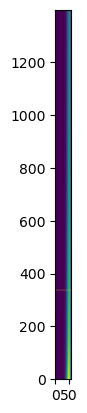

s2n_min:  0.019264116405729278
1400
checking idx_dc:  337


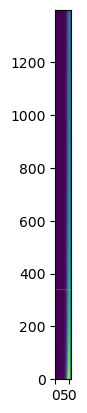

s2n_min:  0.01923616527897075
1400
checking idx_dc:  338


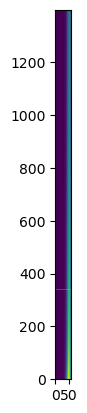

s2n_min:  0.019208335466654
1400
checking idx_dc:  339


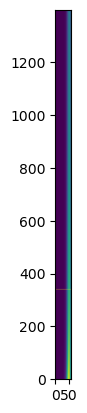

s2n_min:  0.019180626093755412
1400
checking idx_dc:  340


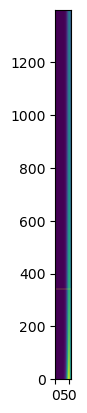

s2n_min:  0.019153036294061936
1400
checking idx_dc:  341


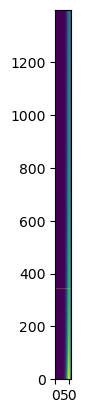

s2n_min:  0.019125565210057354
1400
checking idx_dc:  342


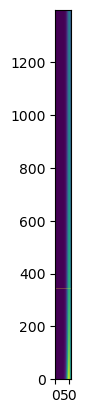

s2n_min:  0.01909821199281035
1400
checking idx_dc:  343


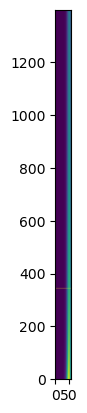

s2n_min:  0.019070975801864315
1400
checking idx_dc:  344


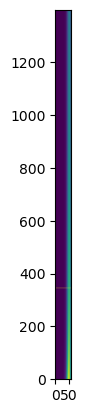

s2n_min:  0.019043855805128882
1400
checking idx_dc:  345


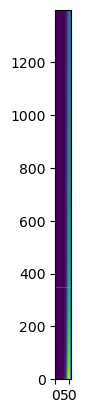

s2n_min:  0.019016851178773154
1400
checking idx_dc:  346


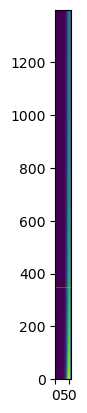

s2n_min:  0.018989961107120597
1400
checking idx_dc:  347


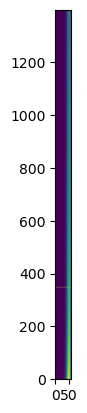

s2n_min:  0.01896318478254555
1400
checking idx_dc:  348


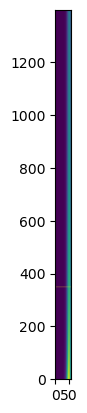

s2n_min:  0.018936521405371363
1400
checking idx_dc:  349


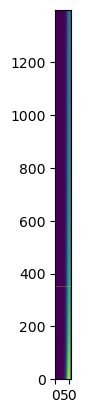

s2n_min:  0.01890997018377007
1400
checking idx_dc:  350


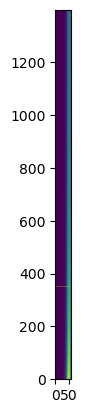

s2n_min:  0.018883530333663624
1400
checking idx_dc:  351


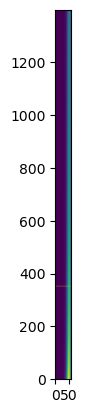

s2n_min:  0.01885720107862666
1400
checking idx_dc:  352


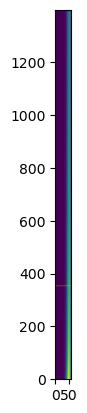

s2n_min:  0.018830981649790714
1400
checking idx_dc:  353


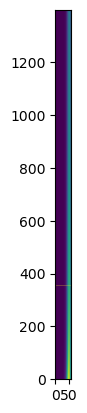

s2n_min:  0.01880487128574993
1400
checking idx_dc:  354


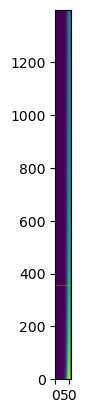

s2n_min:  0.018778869232468198
1400
checking idx_dc:  355


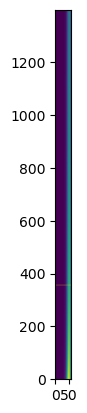

s2n_min:  0.018752974743187666
1400
checking idx_dc:  356


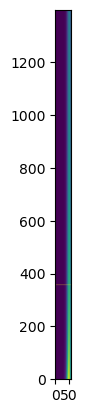

s2n_min:  0.018727187078338692
1400
checking idx_dc:  357


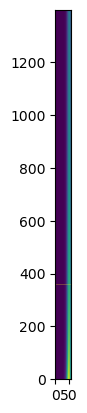

s2n_min:  0.018701505505451115
1400
checking idx_dc:  358


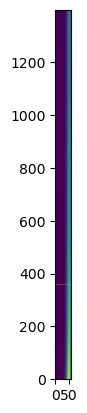

s2n_min:  0.018675929299066866
1400
checking idx_dc:  359


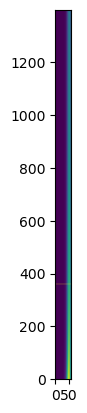

s2n_min:  0.01865045774065391
1400
checking idx_dc:  360


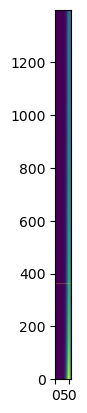

s2n_min:  0.01862509011852144
1400
checking idx_dc:  361


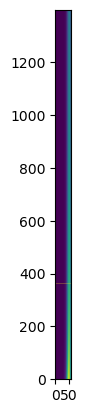

s2n_min:  0.01859982572773638
1400
checking idx_dc:  362


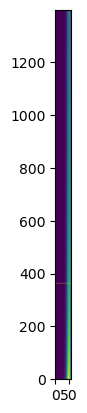

s2n_min:  0.018574663870041093
1400
checking idx_dc:  363


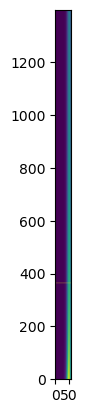

s2n_min:  0.018549603853772335
1400
checking idx_dc:  364


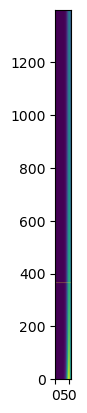

s2n_min:  0.01852464499378139
1400
checking idx_dc:  365


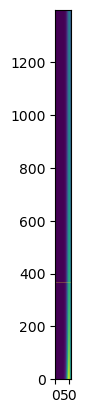

s2n_min:  0.0184997866113554
1400
checking idx_dc:  366


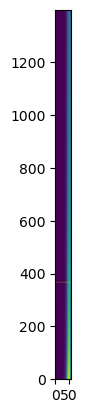

s2n_min:  0.018475028034139834
1400
checking idx_dc:  367


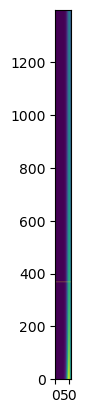

s2n_min:  0.018450368596062132
1400
checking idx_dc:  368


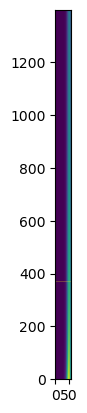

s2n_min:  0.01842580763725641
1400
checking idx_dc:  369


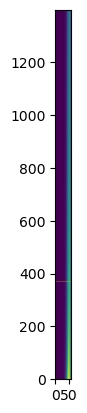

s2n_min:  0.018401344503989333
1400
checking idx_dc:  370


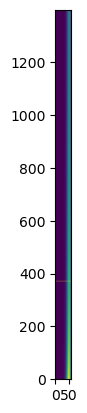

s2n_min:  0.018376978548586987
1400
checking idx_dc:  371


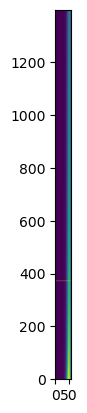

s2n_min:  0.018352709129362908
1400
checking idx_dc:  372


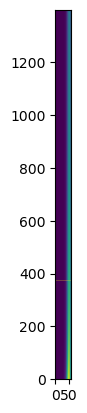

s2n_min:  0.01832853561054706
1400
checking idx_dc:  373


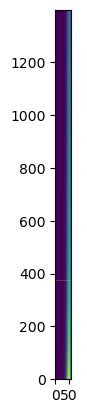

s2n_min:  0.018304457362215917
1400
checking idx_dc:  374


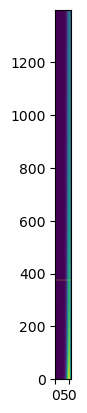

s2n_min:  0.018280473760223497
1400
checking idx_dc:  375


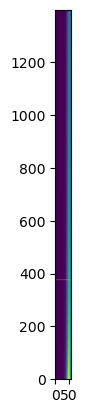

s2n_min:  0.018256584186133414
1400
checking idx_dc:  376


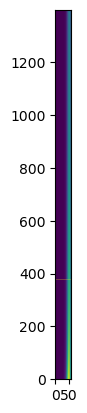

s2n_min:  0.018232788027151902
1400
checking idx_dc:  377


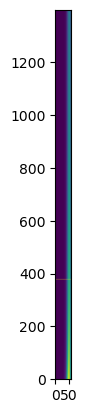

s2n_min:  0.0182090846760618
1400
checking idx_dc:  378


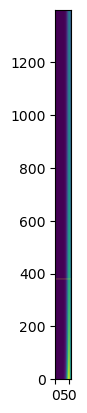

s2n_min:  0.018185473531157466
1400
checking idx_dc:  379


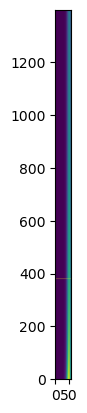

s2n_min:  0.01816195399618062
1400
checking idx_dc:  380


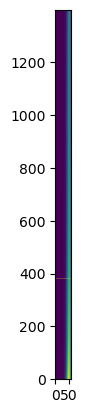

s2n_min:  0.018138525480257104
1400
checking idx_dc:  381


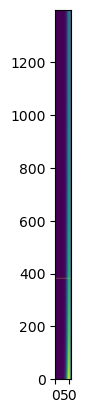

s2n_min:  0.01811518739783454
1400
checking idx_dc:  382


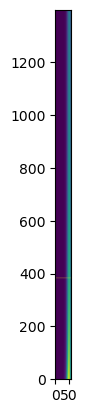

s2n_min:  0.01809193916862086
1400
checking idx_dc:  383


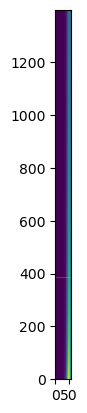

s2n_min:  0.018068780217523707
1400
checking idx_dc:  384


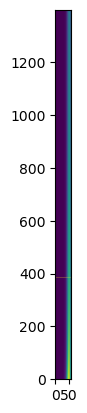

s2n_min:  0.018045709974590658
1400
checking idx_dc:  385


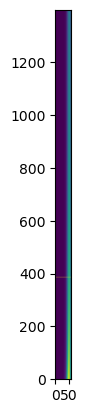

s2n_min:  0.01802272787495036
1400
checking idx_dc:  386


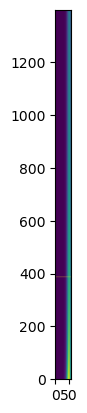

s2n_min:  0.017999833358754384
1400
checking idx_dc:  387


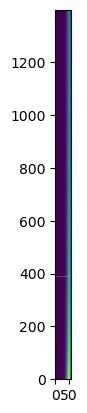

s2n_min:  0.01797702587111999
1400
checking idx_dc:  388


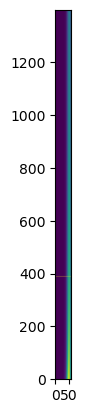

s2n_min:  0.01795430486207361
1400
checking idx_dc:  389


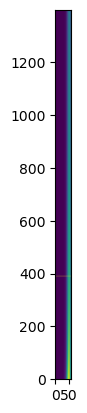

s2n_min:  0.01793166978649517
1400
checking idx_dc:  390


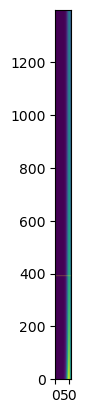

s2n_min:  0.01790912010406314
1400
checking idx_dc:  391


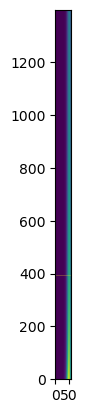

s2n_min:  0.017886655279200372
1400
checking idx_dc:  392


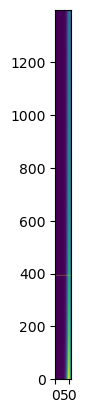

s2n_min:  0.017864274781020675
1400
checking idx_dc:  393


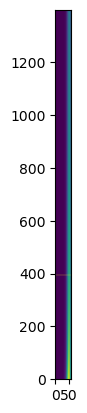

s2n_min:  0.01784197808327611
1400
checking idx_dc:  394


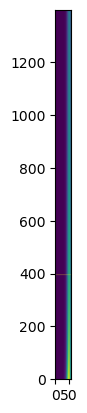

s2n_min:  0.01781976466430503
1400
checking idx_dc:  395


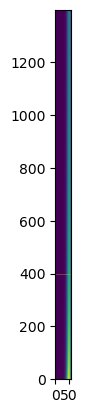

s2n_min:  0.01779763400698081
1400
checking idx_dc:  396


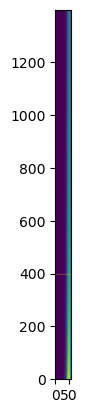

s2n_min:  0.01777558559866129
1400
checking idx_dc:  397


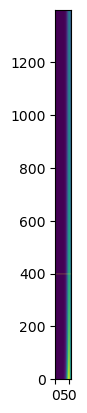

s2n_min:  0.01775361893113888
1400
checking idx_dc:  398


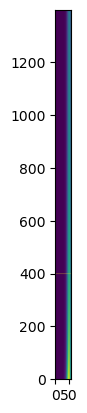

s2n_min:  0.017731733500591398
1400
checking idx_dc:  399


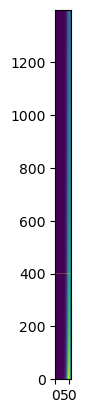

s2n_min:  0.01770992880753349
1400
checking idx_dc:  400


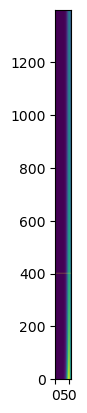

s2n_min:  0.017688204356768794
1400
checking idx_dc:  401


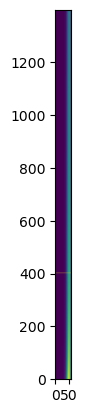

s2n_min:  0.017666559657342668
1400
checking idx_dc:  402


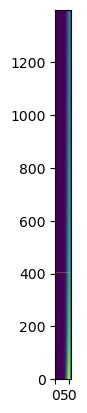

s2n_min:  0.017644994222495606
1400
checking idx_dc:  403


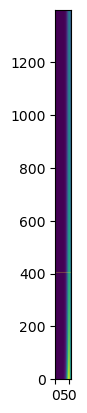

s2n_min:  0.01762350756961727
1400
checking idx_dc:  404


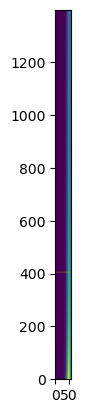

s2n_min:  0.017602099220201117
1400
checking idx_dc:  405


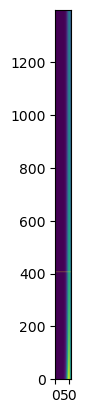

s2n_min:  0.017580768699799635
1400
checking idx_dc:  406


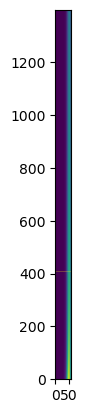

s2n_min:  0.01755951553798019
1400
checking idx_dc:  407


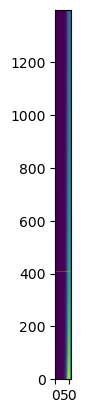

s2n_min:  0.01753833926828146
1400
checking idx_dc:  408


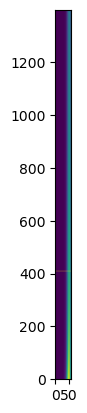

s2n_min:  0.017517239428170413
1400
checking idx_dc:  409


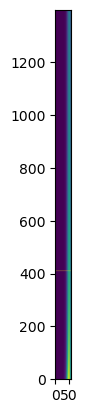

s2n_min:  0.017496215558999887
1400
checking idx_dc:  410


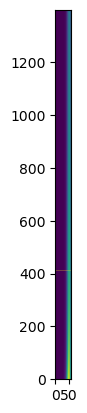

s2n_min:  0.017475267205966715
1400
checking idx_dc:  411


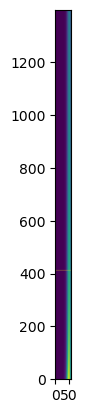

s2n_min:  0.0174543939180704
1400
checking idx_dc:  412


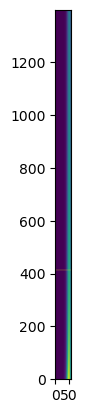

s2n_min:  0.017433595248072344
1400
checking idx_dc:  413


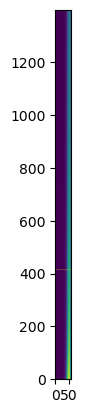

s2n_min:  0.017412870752455584
1400
checking idx_dc:  414


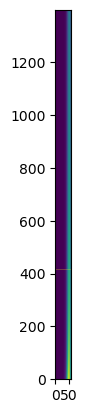

s2n_min:  0.017392219991385075
1400
checking idx_dc:  415


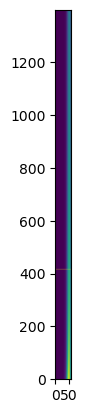

s2n_min:  0.017371642528668498
1400
checking idx_dc:  416


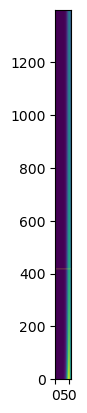

s2n_min:  0.01735113793171753
1400
checking idx_dc:  417


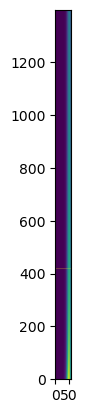

s2n_min:  0.01733070577150968
1400
checking idx_dc:  418


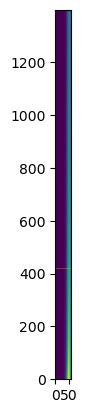

s2n_min:  0.01731034562255058
1400
checking idx_dc:  419


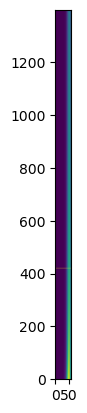

s2n_min:  0.017290057062836747
1400
checking idx_dc:  420


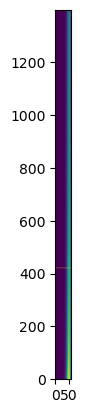

s2n_min:  0.017269839673818885
1400
checking idx_dc:  421


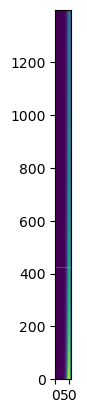

s2n_min:  0.017249693040365575
1400
checking idx_dc:  422


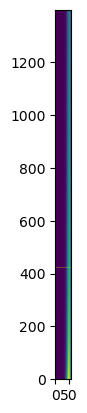

s2n_min:  0.01722961675072751
1400
checking idx_dc:  423


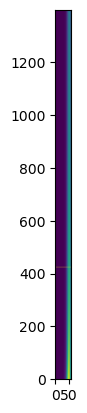

s2n_min:  0.017209610396502126
1400
checking idx_dc:  424


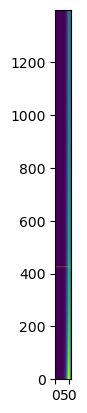

s2n_min:  0.01718967357259872
1400
checking idx_dc:  425


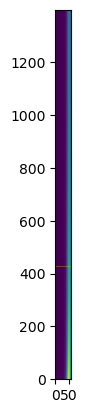

s2n_min:  0.017169805877204004
1400
checking idx_dc:  426


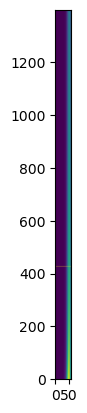

s2n_min:  0.017150006911748065
1400
checking idx_dc:  427


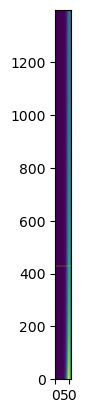

s2n_min:  0.017130276280870823
1400
checking idx_dc:  428


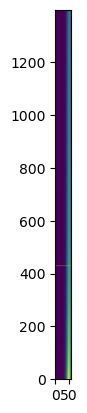

s2n_min:  0.017110613592388836
1400
checking idx_dc:  429


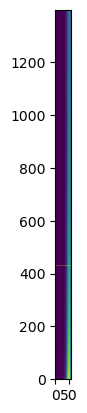

s2n_min:  0.017091018457262578
1400
checking idx_dc:  430


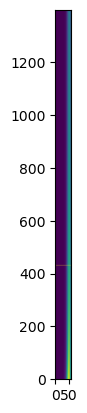

s2n_min:  0.01707149048956411
1400
checking idx_dc:  431


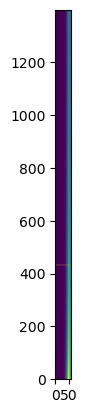

s2n_min:  0.017052029306445136
1400
checking idx_dc:  432


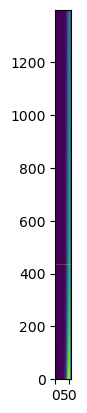

s2n_min:  0.017032634528105505
1400
checking idx_dc:  433


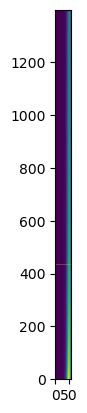

s2n_min:  0.017013305777762062
1400
checking idx_dc:  434


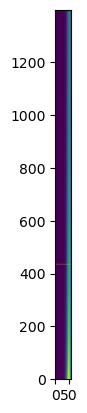

s2n_min:  0.01699404268161791
1400
checking idx_dc:  435


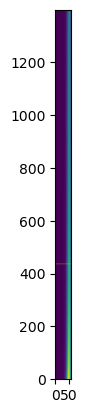

s2n_min:  0.016974844868832044
1400
checking idx_dc:  436


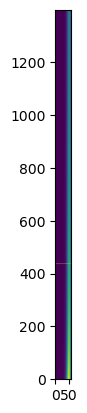

s2n_min:  0.016955711971489373
1400
checking idx_dc:  437


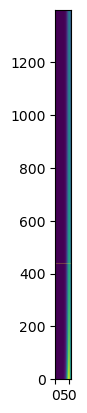

s2n_min:  0.016936643624571097
1400
checking idx_dc:  438


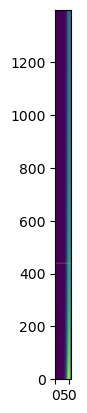

s2n_min:  0.016917639465925473
1400
checking idx_dc:  439


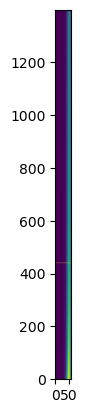

s2n_min:  0.01689869913623891
1400
checking idx_dc:  440


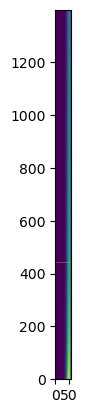

s2n_min:  0.016879822279007434
1400
checking idx_dc:  441


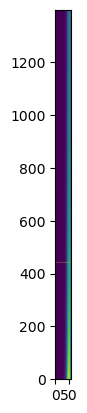

s2n_min:  0.016861008540508527
1400
checking idx_dc:  442


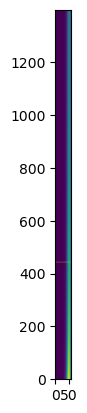

s2n_min:  0.01684225756977327
1400
checking idx_dc:  443


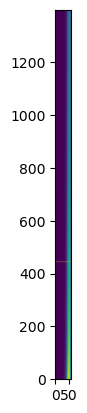

s2n_min:  0.016823569018558842
1400
checking idx_dc:  444


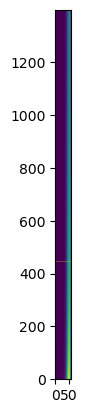

s2n_min:  0.01680494254132136
1400
checking idx_dc:  445


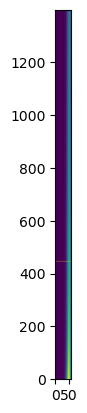

s2n_min:  0.016786377795189055
1400
checking idx_dc:  446


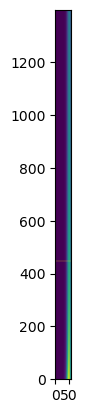

s2n_min:  0.016767874439935743
1400
checking idx_dc:  447


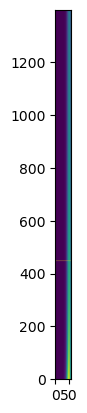

s2n_min:  0.01674943213795466
1400
checking idx_dc:  448


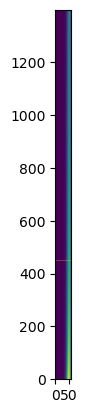

s2n_min:  0.016731050554232563
1400
checking idx_dc:  449


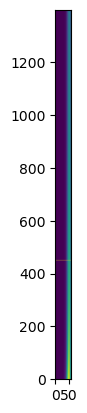

s2n_min:  0.016712729356324195
1400
checking idx_dc:  450


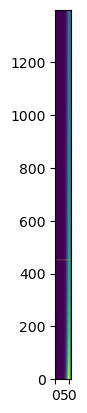

s2n_min:  0.016694468214327032
1400
checking idx_dc:  451


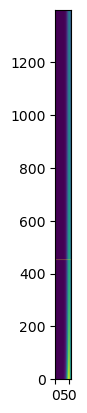

s2n_min:  0.016676266800856297
1400
checking idx_dc:  452


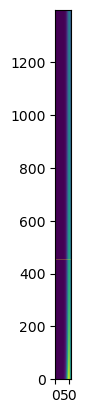

s2n_min:  0.01665812479102035
1400
checking idx_dc:  453


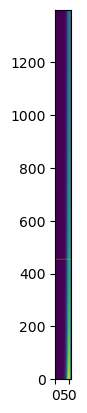

s2n_min:  0.016640041862396312
1400
checking idx_dc:  454


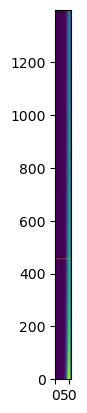

s2n_min:  0.016622017695006
1400
checking idx_dc:  455


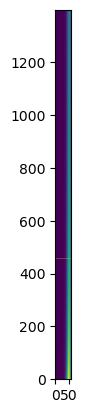

s2n_min:  0.016604051971292152
1400
checking idx_dc:  456


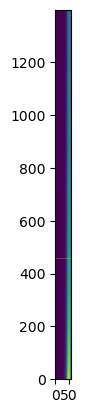

s2n_min:  0.016586144376094913
1400
checking idx_dc:  457


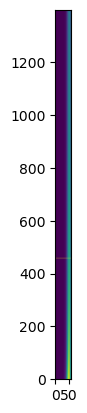

s2n_min:  0.01656829459662863
1400
checking idx_dc:  458


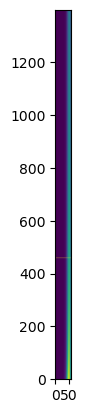

s2n_min:  0.016550502322458895
1400
checking idx_dc:  459


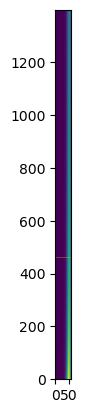

s2n_min:  0.016532767245479876
1400
checking idx_dc:  460


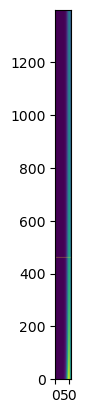

s2n_min:  0.016515089059891918
1400
checking idx_dc:  461


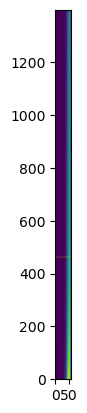

s2n_min:  0.016497467462179366
1400
checking idx_dc:  462


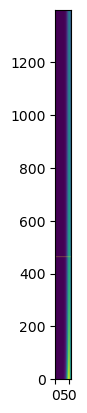

s2n_min:  0.016479902151088705
1400
checking idx_dc:  463


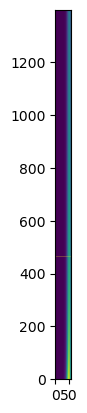

s2n_min:  0.01646239282760692
1400
checking idx_dc:  464


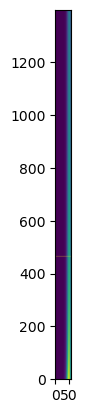

s2n_min:  0.016444939194940122
1400
checking idx_dc:  465


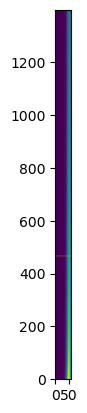

s2n_min:  0.016427540958492408
1400
checking idx_dc:  466


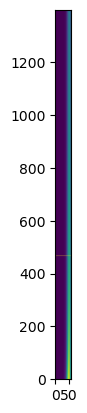

s2n_min:  0.016410197825844994
1400
checking idx_dc:  467


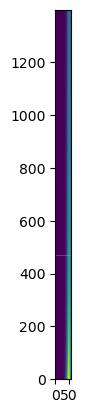

s2n_min:  0.016392909506735547
1400
checking idx_dc:  468


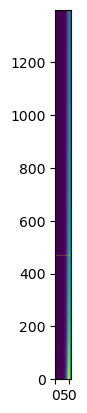

s2n_min:  0.016375675713037805
1400
checking idx_dc:  469


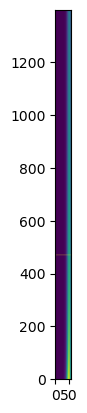

s2n_min:  0.0163584961587414
1400
checking idx_dc:  470


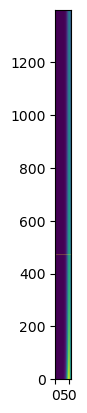

s2n_min:  0.016341370559931918
1400
checking idx_dc:  471


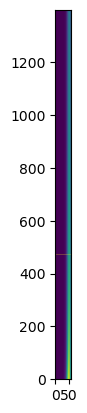

s2n_min:  0.01632429863477119
1400
checking idx_dc:  472


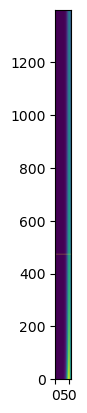

s2n_min:  0.01630728010347783
1400
checking idx_dc:  473


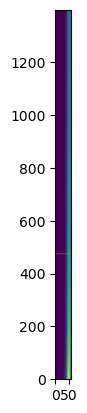

s2n_min:  0.016290314688307952
1400
checking idx_dc:  474


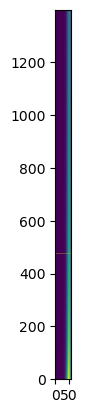

s2n_min:  0.016273402113536152
1400
checking idx_dc:  475


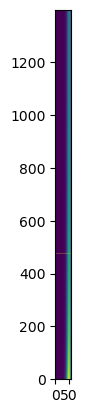

s2n_min:  0.016256542105436672
1400
checking idx_dc:  476


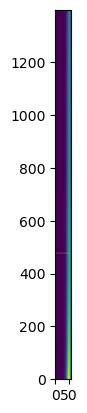

s2n_min:  0.0162397343922648
1400
checking idx_dc:  477


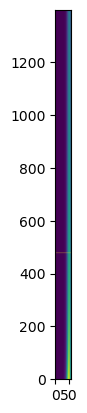

s2n_min:  0.016222978704238472
1400
checking idx_dc:  478


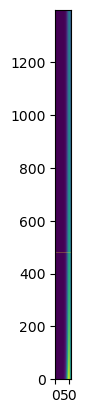

s2n_min:  0.016206274773520095
1400
checking idx_dc:  479


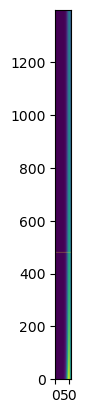

s2n_min:  0.01618962233419854
1400
checking idx_dc:  480


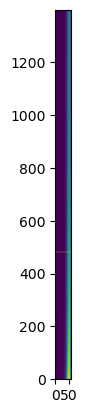

s2n_min:  0.016173021122271397
1400
checking idx_dc:  481


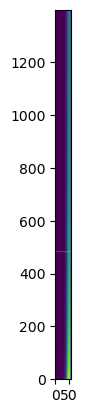

s2n_min:  0.016156470875627365
1400
checking idx_dc:  482


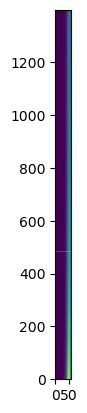

s2n_min:  0.016139971334028884
1400
checking idx_dc:  483


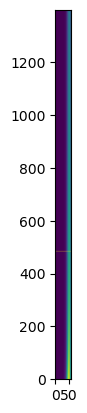

s2n_min:  0.016123522239094957
1400
checking idx_dc:  484


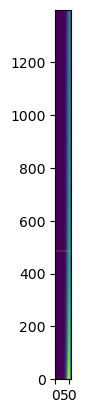

s2n_min:  0.016107123334284133
1400
checking idx_dc:  485


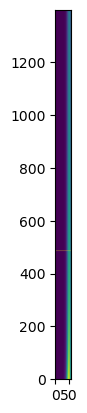

s2n_min:  0.016090774364877727
1400
checking idx_dc:  486


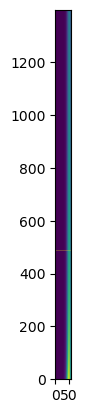

s2n_min:  0.016074475077963186
1400
checking idx_dc:  487


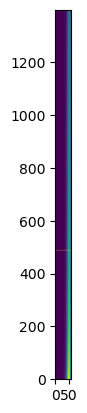

s2n_min:  0.01605822522241766
1400
checking idx_dc:  488


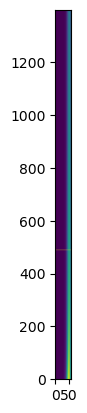

s2n_min:  0.016042024548891757
1400
checking idx_dc:  489


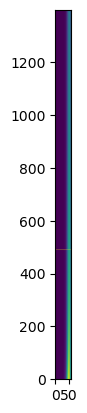

s2n_min:  0.01602587280979346
1400
checking idx_dc:  490


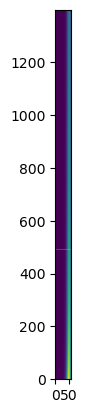

s2n_min:  0.016009769759272267
1400
checking idx_dc:  491


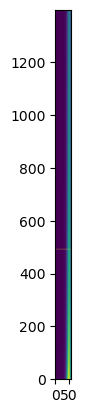

s2n_min:  0.015993715153203424
1400
checking idx_dc:  492


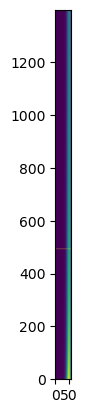

s2n_min:  0.015977708749172415
1400
checking idx_dc:  493


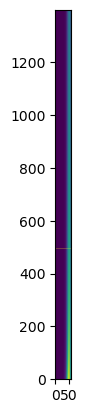

s2n_min:  0.015961750306459587
1400
checking idx_dc:  494


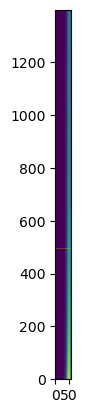

s2n_min:  0.01594583958602493
1400
checking idx_dc:  495


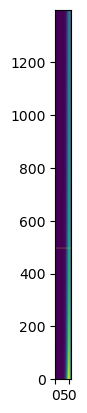

s2n_min:  0.015929976350493053
1400
checking idx_dc:  496


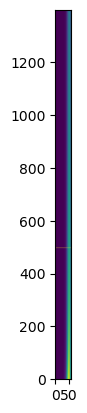

s2n_min:  0.015914160364138303
1400
checking idx_dc:  497


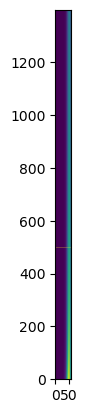

s2n_min:  0.015898391392870043
1400
checking idx_dc:  498


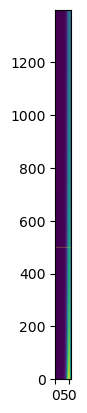

s2n_min:  0.01588266920421813
1400
checking idx_dc:  499


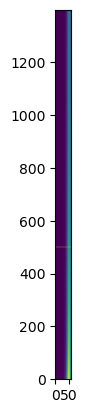

s2n_min:  0.015866993567318476
1400
checking idx_dc:  500


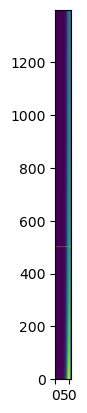

s2n_min:  0.01585136425289886
1400
checking idx_dc:  501


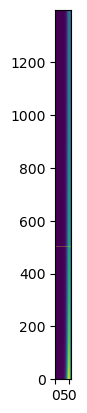

s2n_min:  0.015835781033264804
1400
checking idx_dc:  502


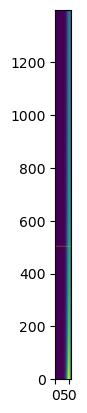

s2n_min:  0.015820243682285653
1400
checking idx_dc:  503


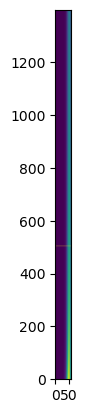

s2n_min:  0.015804751975380803
1400
checking idx_dc:  504


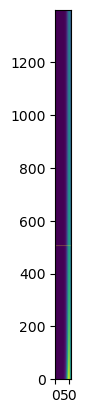

s2n_min:  0.01578930568950605
1400
checking idx_dc:  505


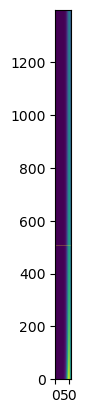

s2n_min:  0.015773904603140126
1400
checking idx_dc:  506


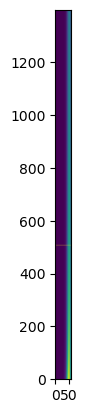

s2n_min:  0.015758548496271334
1400
checking idx_dc:  507


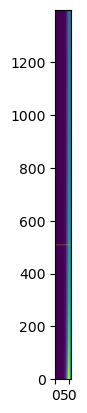

s2n_min:  0.015743237150384344
1400
checking idx_dc:  508


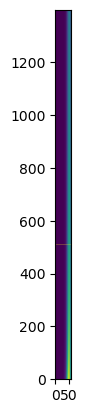

s2n_min:  0.01572797034844716
1400
checking idx_dc:  509


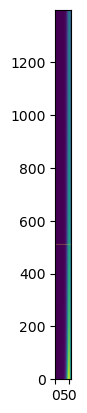

s2n_min:  0.01571274787489817
1400
checking idx_dc:  510


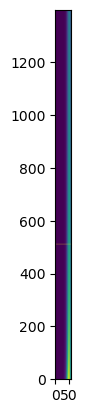

s2n_min:  0.01569756951563339
1400
checking idx_dc:  511


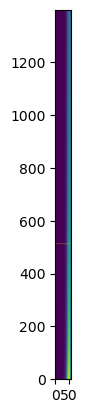

s2n_min:  0.015682435057993785
1400
checking idx_dc:  512


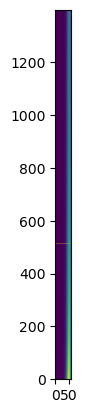

s2n_min:  0.015667344290752783
1400
checking idx_dc:  513


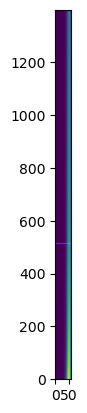

s2n_min:  0.015652297004103873
1400
checking idx_dc:  514


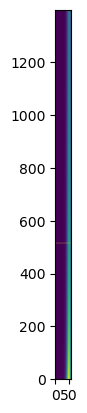

s2n_min:  0.015637292989648367
1400
checking idx_dc:  515


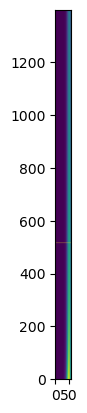

s2n_min:  0.015622332040383281
1400
checking idx_dc:  516


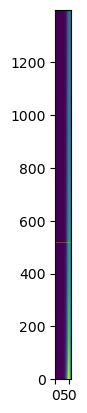

s2n_min:  0.015607413950689314
1400
checking idx_dc:  517


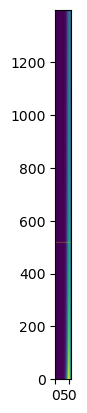

s2n_min:  0.015592538516319011
1400
checking idx_dc:  518


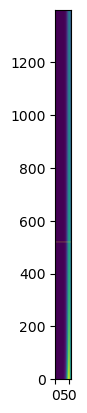

s2n_min:  0.015577705534384995
1400
checking idx_dc:  519


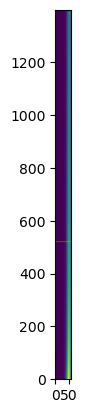

s2n_min:  0.015562914803348359
1400
checking idx_dc:  520


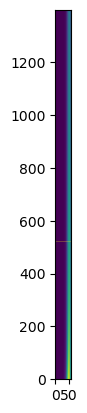

s2n_min:  0.015548166123007159
1400
checking idx_dc:  521


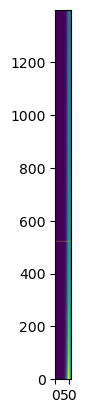

s2n_min:  0.015533459294485024
1400
checking idx_dc:  522


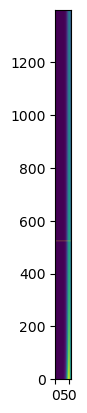

s2n_min:  0.015518794120219913
1400
checking idx_dc:  523


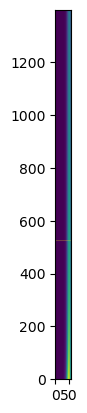

s2n_min:  0.015504170403952947
1400
checking idx_dc:  524


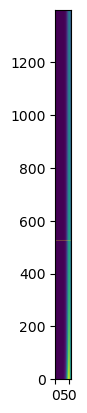

s2n_min:  0.015489587950717391
1400
checking idx_dc:  525


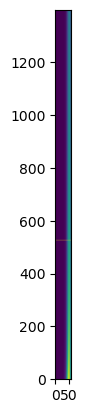

s2n_min:  0.015475046566827735
1400
checking idx_dc:  526


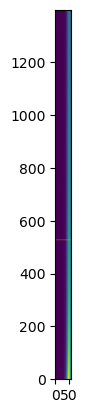

s2n_min:  0.01546054605986888
1400
checking idx_dc:  527


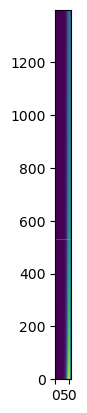

s2n_min:  0.015446086238685455
1400
checking idx_dc:  528


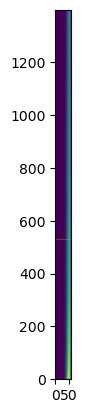

s2n_min:  0.015431666913371235
1400
checking idx_dc:  529


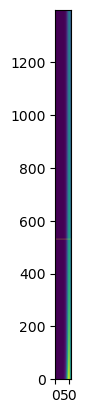

s2n_min:  0.015417287895258647
1400
checking idx_dc:  530


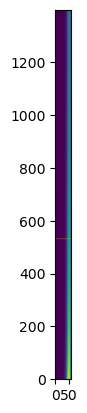

s2n_min:  0.015402948996908427
1400
checking idx_dc:  531


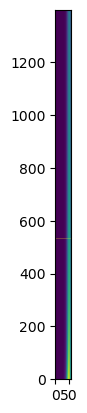

s2n_min:  0.015388650032099339
1400
checking idx_dc:  532


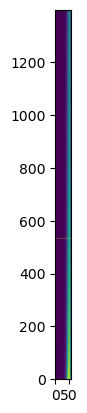

s2n_min:  0.015374390815818028
1400
checking idx_dc:  533


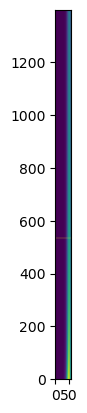

s2n_min:  0.015360171164248954
1400
checking idx_dc:  534


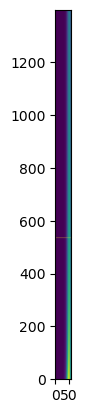

s2n_min:  0.015345990894764449
1400
checking idx_dc:  535


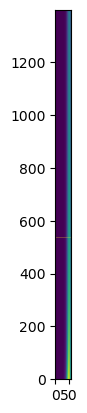

s2n_min:  0.015331849825914875
1400
checking idx_dc:  536


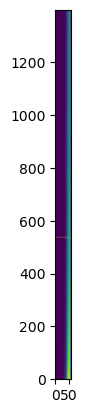

s2n_min:  0.015317747777418842
1400
checking idx_dc:  537


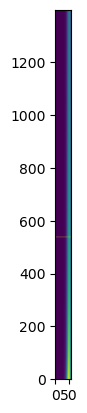

s2n_min:  0.015303684570153585
1400
checking idx_dc:  538


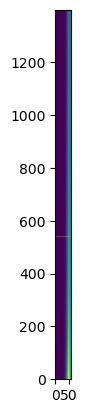

s2n_min:  0.015289660026145398
1400
checking idx_dc:  539


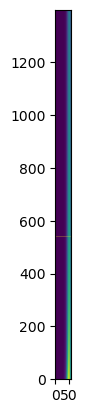

s2n_min:  0.015275673968560163
1400
checking idx_dc:  540


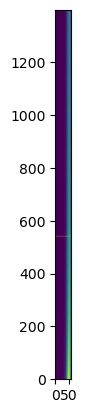

s2n_min:  0.015261726221694007
1400
checking idx_dc:  541


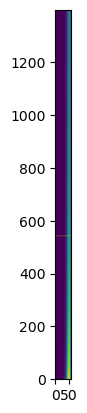

s2n_min:  0.01524781661096401
1400
checking idx_dc:  542


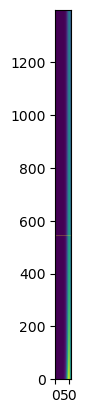

s2n_min:  0.015233944962899034
1400
checking idx_dc:  543


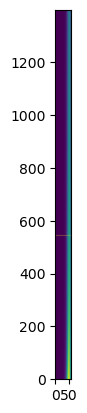

s2n_min:  0.015220111105130649
1400
checking idx_dc:  544


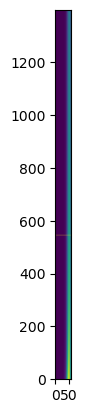

s2n_min:  0.015206314866384118
1400
checking idx_dc:  545


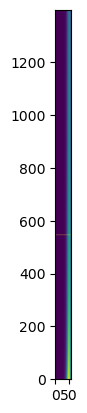

s2n_min:  0.015192556076469504
1400
checking idx_dc:  546


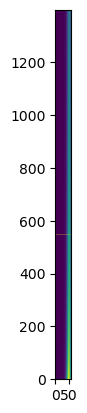

s2n_min:  0.015178834566272845
1400
checking idx_dc:  547


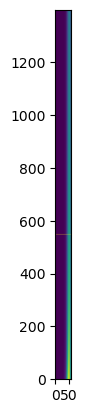

s2n_min:  0.015165150167747424
1400
checking idx_dc:  548


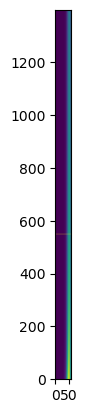

s2n_min:  0.015151502713905128
1400
checking idx_dc:  549


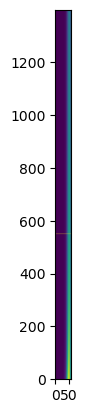

s2n_min:  0.015137892038807896
1400
checking idx_dc:  550


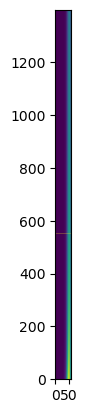

s2n_min:  0.01512431797755923
1400
checking idx_dc:  551


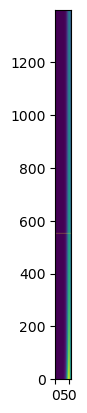

s2n_min:  0.01511078036629581
1400
checking idx_dc:  552


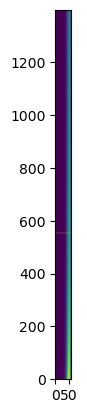

s2n_min:  0.01509727904217919
1400
checking idx_dc:  553


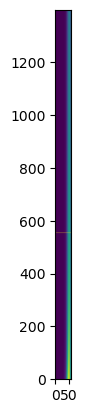

s2n_min:  0.015083813843387577
1400
checking idx_dc:  554


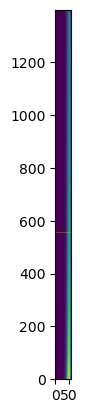

s2n_min:  0.015070384609107658
1400
checking idx_dc:  555


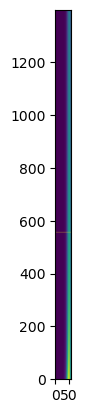

s2n_min:  0.015056991179526575
1400
checking idx_dc:  556


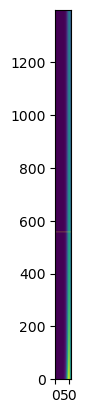

s2n_min:  0.015043633395823895
1400
checking idx_dc:  557


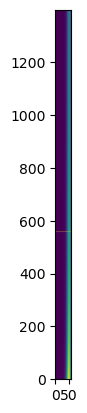

s2n_min:  0.015030311100163729
1400
checking idx_dc:  558


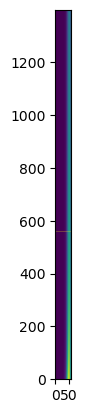

s2n_min:  0.01501702413568689
1400
checking idx_dc:  559


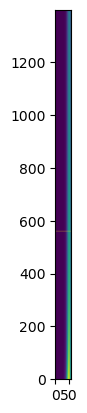

s2n_min:  0.015003772346503125
1400
checking idx_dc:  560


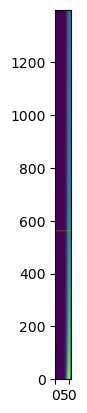

s2n_min:  0.014990555577683461
1400
checking idx_dc:  561


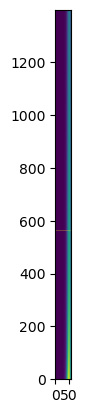

s2n_min:  0.014977373675252566
1400
checking idx_dc:  562


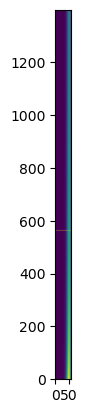

s2n_min:  0.014964226486181231
1400
checking idx_dc:  563


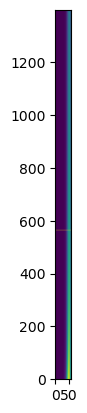

s2n_min:  0.014951113858378913
1400
checking idx_dc:  564


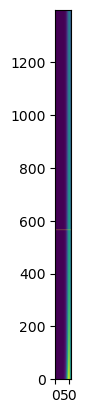

s2n_min:  0.014938035640686327
1400
checking idx_dc:  565


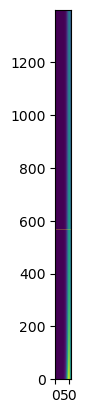

s2n_min:  0.014924991682868155
1400
checking idx_dc:  566


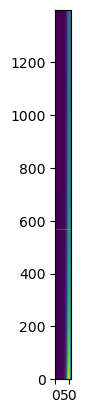

s2n_min:  0.014911981835605765
1400
checking idx_dc:  567


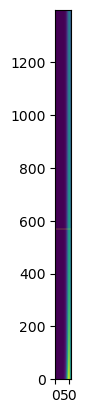

s2n_min:  0.014899005950490056
1400
checking idx_dc:  568


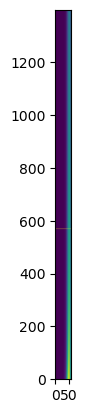

s2n_min:  0.014886063880014342
1400
checking idx_dc:  569


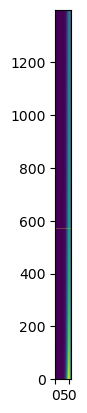

s2n_min:  0.0148731554775673
1400
checking idx_dc:  570


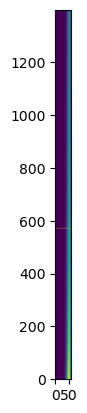

s2n_min:  0.014860280597426013
1400
checking idx_dc:  571


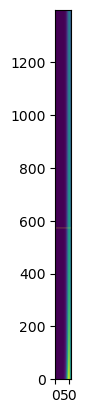

s2n_min:  0.014847439094749037
1400
checking idx_dc:  572


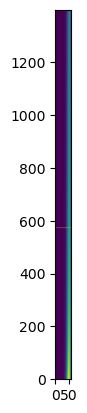

s2n_min:  0.01483463082556957
1400
checking idx_dc:  573


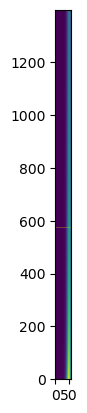

s2n_min:  0.014821855646788682
1400
checking idx_dc:  574


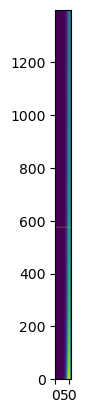

s2n_min:  0.014809113416168581
1400
checking idx_dc:  575


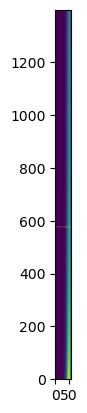

s2n_min:  0.014796403992325976
1400
checking idx_dc:  576


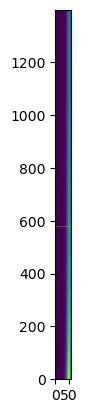

s2n_min:  0.014783727234725482
1400
checking idx_dc:  577


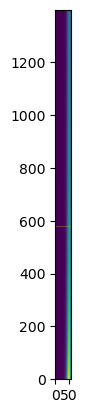

s2n_min:  0.01477108300367309
1400
checking idx_dc:  578


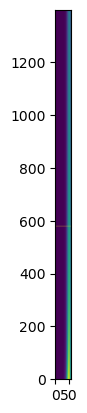

s2n_min:  0.014758471160309714
1400
checking idx_dc:  579


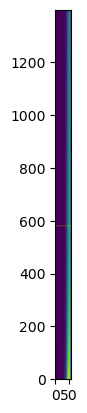

s2n_min:  0.014745891566604769
1400
checking idx_dc:  580


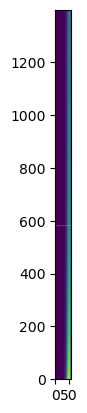

s2n_min:  0.014733344085349848
1400
checking idx_dc:  581


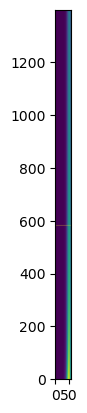

s2n_min:  0.014720828580152405
1400
checking idx_dc:  582


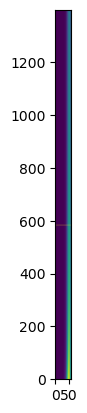

s2n_min:  0.014708344915429562
1400
checking idx_dc:  583


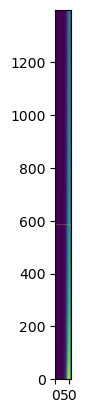

s2n_min:  0.01469589295640192
1400
checking idx_dc:  584


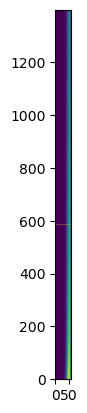

s2n_min:  0.014683472569087447
1400
checking idx_dc:  585


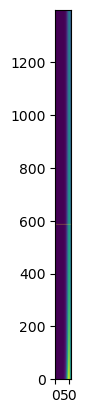

s2n_min:  0.014671083620295436
1400
checking idx_dc:  586


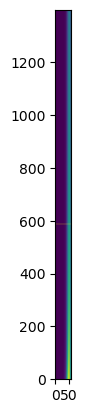

s2n_min:  0.014658725977620494
1400
checking idx_dc:  587


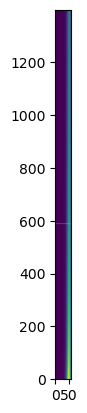

s2n_min:  0.014646399509436598
1400
checking idx_dc:  588


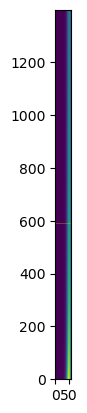

s2n_min:  0.01463410408489122
1400
checking idx_dc:  589


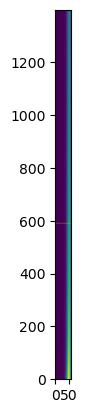

s2n_min:  0.014621839573899476
1400
checking idx_dc:  590


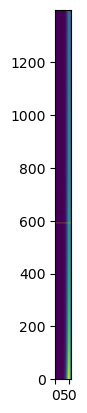

s2n_min:  0.01460960584713836
1400
checking idx_dc:  591


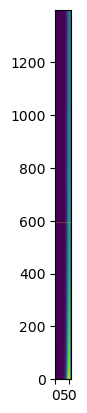

s2n_min:  0.01459740277604101
1400
checking idx_dc:  592


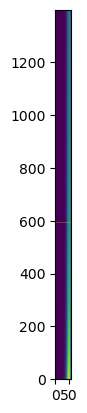

s2n_min:  0.014585230232791025
1400
checking idx_dc:  593


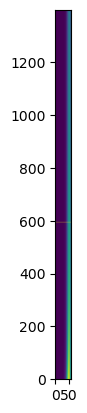

s2n_min:  0.014573088090316863
1400
checking idx_dc:  594


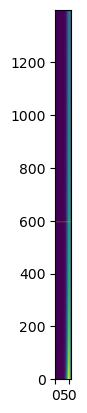

s2n_min:  0.014560976222286243
1400
checking idx_dc:  595


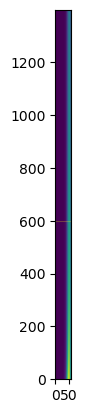

s2n_min:  0.014548894503100655
1400
checking idx_dc:  596


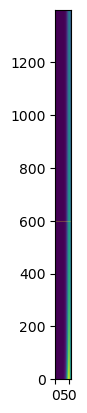

s2n_min:  0.014536842807889859
1400
checking idx_dc:  597


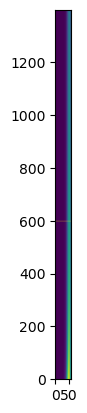

s2n_min:  0.014524821012506482
1400
checking idx_dc:  598


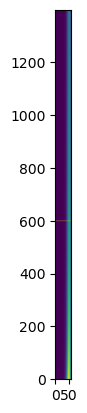

s2n_min:  0.014512828993520648
1400
checking idx_dc:  599


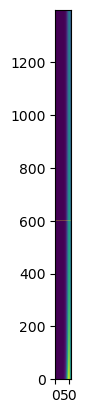

s2n_min:  0.014500866628214648
1400
checking idx_dc:  600


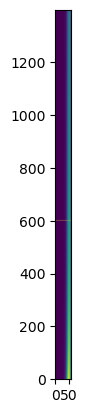

s2n_min:  0.014488933794577667
1400
checking idx_dc:  601


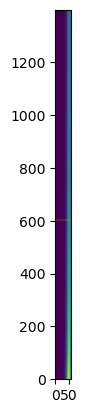

s2n_min:  0.01447703037130056
1400
checking idx_dc:  602


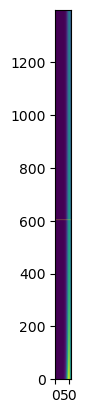

s2n_min:  0.014465156237770668
1400
checking idx_dc:  603


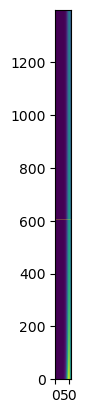

s2n_min:  0.014453311274066695
1400
checking idx_dc:  604


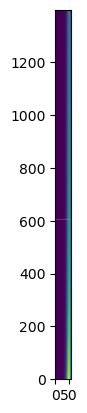

s2n_min:  0.014441495360953602
1400
checking idx_dc:  605


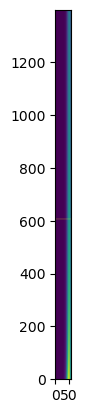

s2n_min:  0.014429708379877594
1400
checking idx_dc:  606


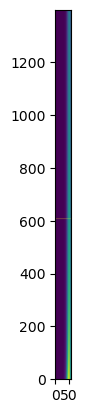

s2n_min:  0.014417950212961094
1400
checking idx_dc:  607


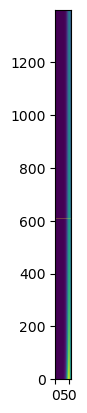

s2n_min:  0.01440622074299781
1400
checking idx_dc:  608


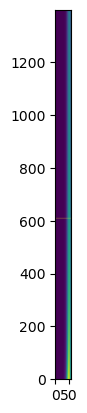

s2n_min:  0.014394519853447828
1400
checking idx_dc:  609


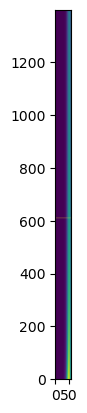

s2n_min:  0.014382847428432741
1400
checking idx_dc:  610


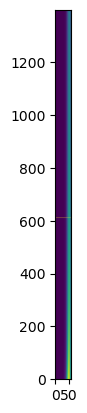

s2n_min:  0.014371203352730833
1400
checking idx_dc:  611


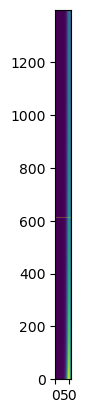

s2n_min:  0.014359587511772302
1400
checking idx_dc:  612


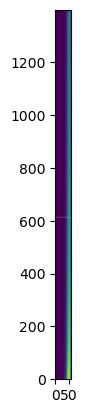

s2n_min:  0.014347999791634524
1400
checking idx_dc:  613


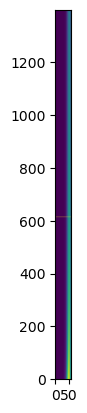

s2n_min:  0.01433644007903736
1400
checking idx_dc:  614


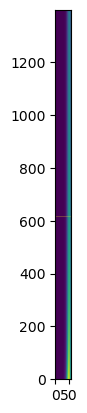

s2n_min:  0.01432490826133851
1400
checking idx_dc:  615


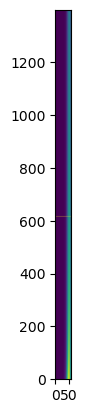

s2n_min:  0.014313404226528902
1400
checking idx_dc:  616


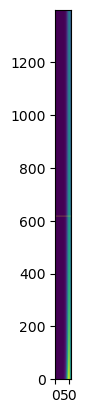

s2n_min:  0.014301927863228106
1400
checking idx_dc:  617


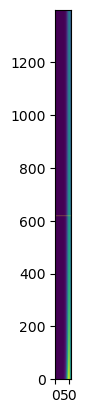

s2n_min:  0.014290479060679833
1400
checking idx_dc:  618


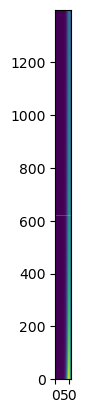

s2n_min:  0.014279057708747421
1400
checking idx_dc:  619


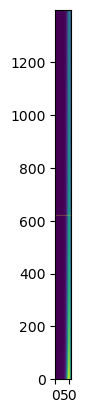

s2n_min:  0.0142676636979094
1400
checking idx_dc:  620


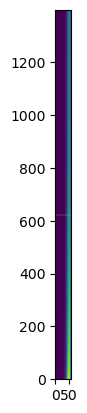

s2n_min:  0.014256296919255078
1400
checking idx_dc:  621


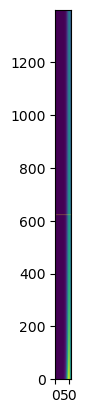

s2n_min:  0.014244957264480159
1400
checking idx_dc:  622


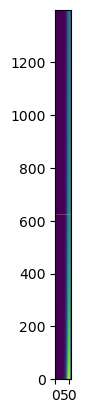

s2n_min:  0.014233644625882424
1400
checking idx_dc:  623


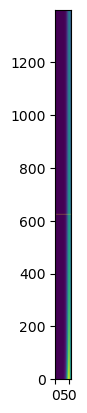

s2n_min:  0.014222358896357425
1400
checking idx_dc:  624


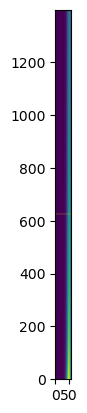

s2n_min:  0.014211099969394222
1400
checking idx_dc:  625


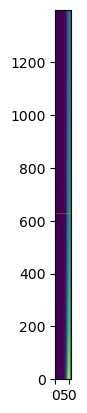

s2n_min:  0.014199867739071179
1400
checking idx_dc:  626


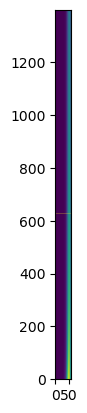

s2n_min:  0.014188662100051756
1400
checking idx_dc:  627


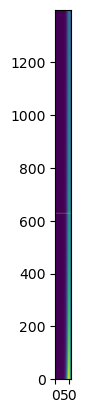

s2n_min:  0.014177482947580377
1400
checking idx_dc:  628


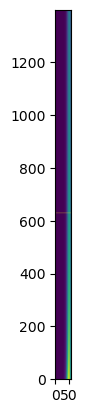

s2n_min:  0.014166330177478308
1400
checking idx_dc:  629


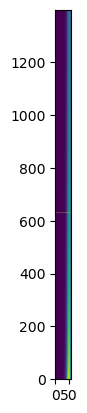

s2n_min:  0.014155203686139584
1400
checking idx_dc:  630


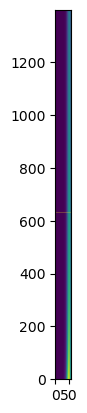

s2n_min:  0.014144103370526963
1400
checking idx_dc:  631


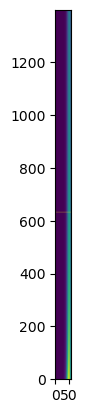

s2n_min:  0.014133029128167923
1400
checking idx_dc:  632


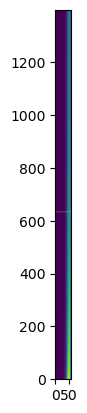

s2n_min:  0.014121980857150681
1400
checking idx_dc:  633


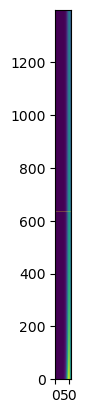

s2n_min:  0.014110958456120265
1400
checking idx_dc:  634


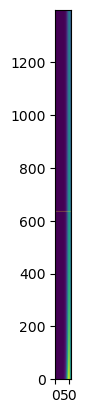

s2n_min:  0.014099961824274598
1400
checking idx_dc:  635


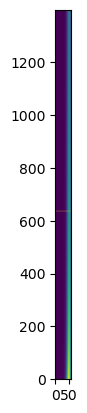

s2n_min:  0.014088990861360633
1400
checking idx_dc:  636


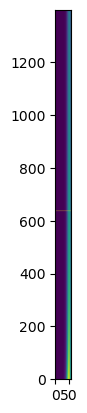

s2n_min:  0.014078045467670513
1400
checking idx_dc:  637


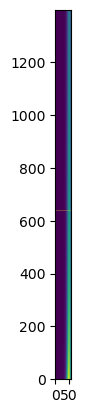

s2n_min:  0.014067125544037764
1400
checking idx_dc:  638


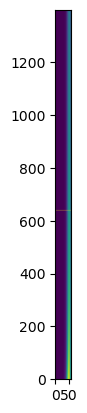

s2n_min:  0.01405623099183352
1400
checking idx_dc:  639


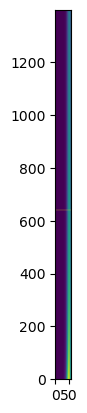

s2n_min:  0.014045361712962784
1400
checking idx_dc:  640


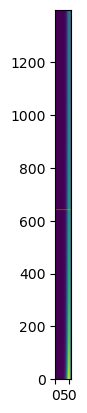

s2n_min:  0.014034517609860717
1400
checking idx_dc:  641


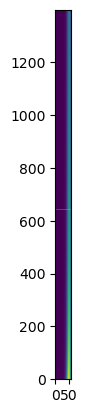

s2n_min:  0.014023698585488962
1400
checking idx_dc:  642


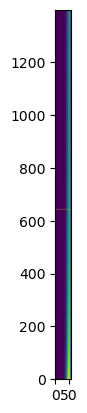

s2n_min:  0.014012904543331995
1400
checking idx_dc:  643


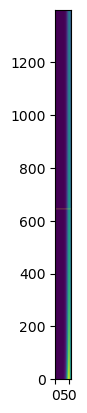

s2n_min:  0.014002135387393507
1400
checking idx_dc:  644


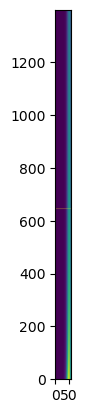

s2n_min:  0.013991391022192821
1400
checking idx_dc:  645


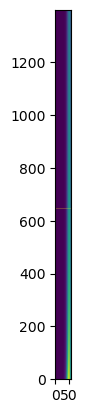

s2n_min:  0.013980671352761336
1400
checking idx_dc:  646


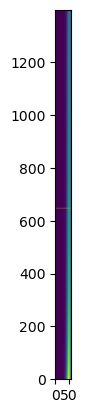

s2n_min:  0.013969976284639002
1400
checking idx_dc:  647


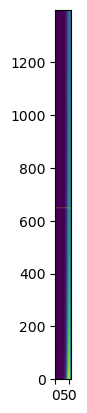

s2n_min:  0.013959305723870821
1400
checking idx_dc:  648


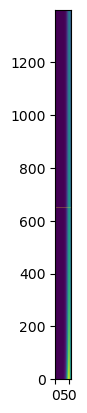

s2n_min:  0.013948659577003385
1400
checking idx_dc:  649


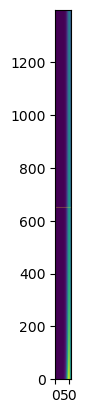

s2n_min:  0.013938037751081432
1400
checking idx_dc:  650


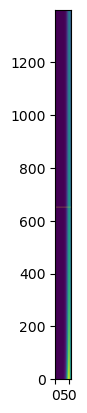

s2n_min:  0.013927440153644447
1400
checking idx_dc:  651


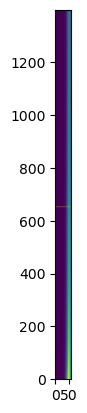

s2n_min:  0.01391686669272327
1400
checking idx_dc:  652


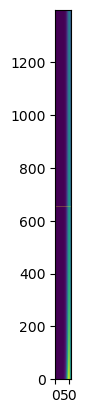

s2n_min:  0.013906317276836753
1400
checking idx_dc:  653


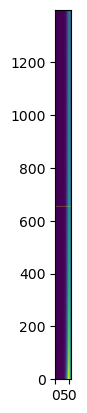

s2n_min:  0.013895791814988429
1400
checking idx_dc:  654


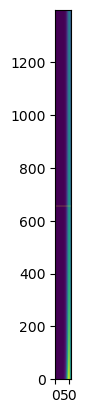

s2n_min:  0.01388529021666322
1400
checking idx_dc:  655


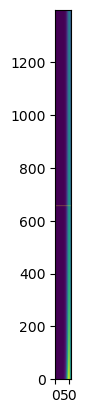

s2n_min:  0.01387481239182417
1400
checking idx_dc:  656


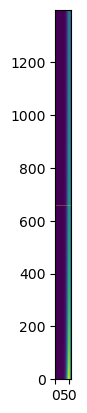

s2n_min:  0.01386435825090919
1400
checking idx_dc:  657


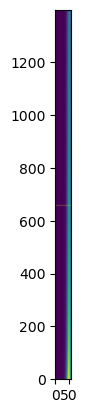

s2n_min:  0.013853927704827861
1400
checking idx_dc:  658


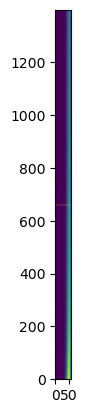

s2n_min:  0.01384352066495823
1400
checking idx_dc:  659


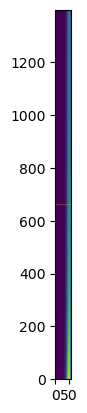

s2n_min:  0.013833137043143658
1400
checking idx_dc:  660


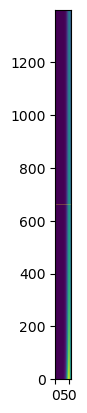

s2n_min:  0.013822776751689672
1400
checking idx_dc:  661


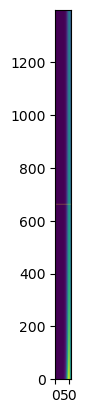

s2n_min:  0.013812439703360867
1400
checking idx_dc:  662


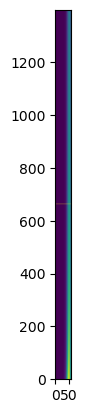

s2n_min:  0.013802125811377818
1400
checking idx_dc:  663


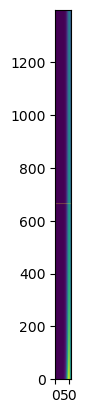

s2n_min:  0.013791834989414005
1400
checking idx_dc:  664


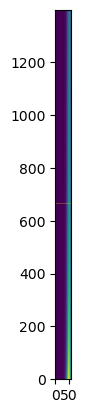

s2n_min:  0.013781567151592802
1400
checking idx_dc:  665


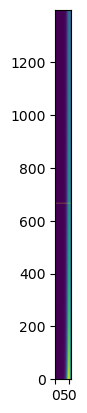

s2n_min:  0.013771322212484458
1400
checking idx_dc:  666


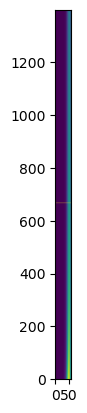

s2n_min:  0.013761100087103096
1400
checking idx_dc:  667


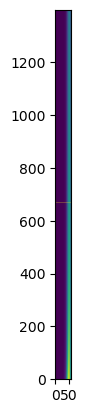

s2n_min:  0.013750900690903779
1400
checking idx_dc:  668


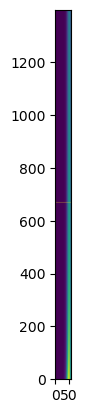

s2n_min:  0.01374072393977955
1400
checking idx_dc:  669


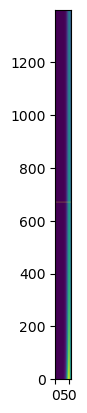

s2n_min:  0.013730569750058536
1400
checking idx_dc:  670


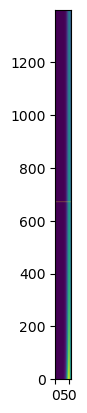

s2n_min:  0.013720438038501048
1400
checking idx_dc:  671


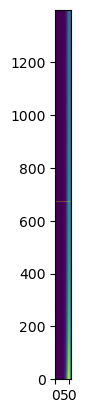

s2n_min:  0.013710328722296715
1400
checking idx_dc:  672


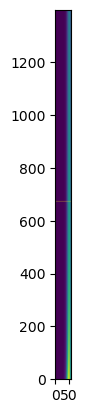

s2n_min:  0.01370024171906165
1400
checking idx_dc:  673


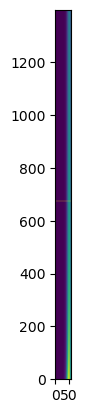

s2n_min:  0.013690176946835624
1400
checking idx_dc:  674


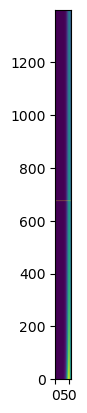

s2n_min:  0.013680134324079263
1400
checking idx_dc:  675


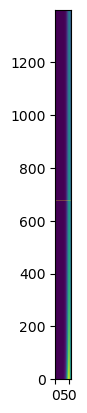

s2n_min:  0.013670113769671293
1400
checking idx_dc:  676


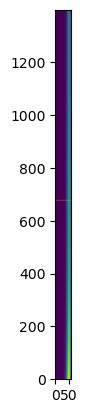

s2n_min:  0.013660115202905759
1400
checking idx_dc:  677


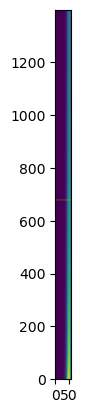

s2n_min:  0.013650138543489329
1400
checking idx_dc:  678


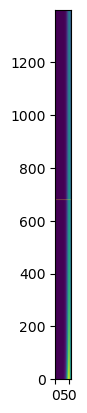

s2n_min:  0.013640183711538549
1400
checking idx_dc:  679


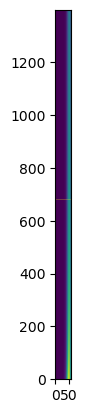

s2n_min:  0.01363025062757719
1400
checking idx_dc:  680


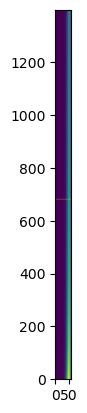

s2n_min:  0.01362033921253356
1400
checking idx_dc:  681


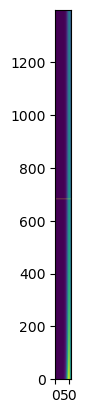

s2n_min:  0.013610449387737875
1400
checking idx_dc:  682


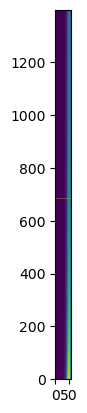

s2n_min:  0.013600581074919627
1400
checking idx_dc:  683


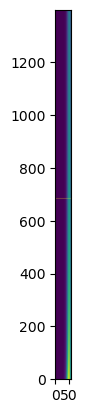

s2n_min:  0.013590734196204981
1400
checking idx_dc:  684


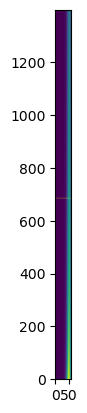

s2n_min:  0.013580908674114206
1400
checking idx_dc:  685


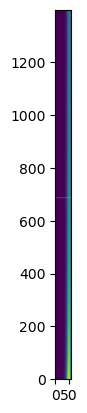

s2n_min:  0.013571104431559103
1400
checking idx_dc:  686


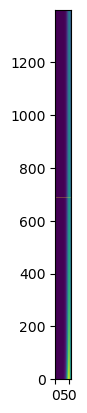

s2n_min:  0.013561321391840468
1400
checking idx_dc:  687


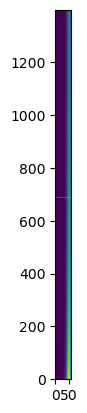

s2n_min:  0.013551559478645574
1400
checking idx_dc:  688


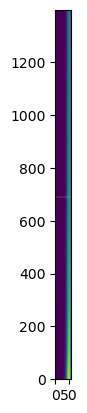

s2n_min:  0.013541818616045668
1400
checking idx_dc:  689


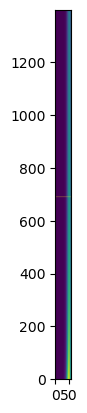

s2n_min:  0.013532098728493494
1400
checking idx_dc:  690


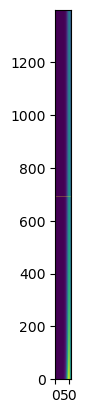

s2n_min:  0.013522399740820827
1400
checking idx_dc:  691


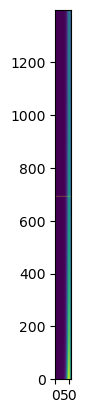

s2n_min:  0.013512721578236037
1400
checking idx_dc:  692


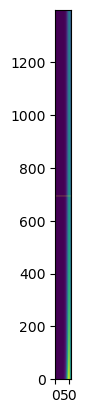

s2n_min:  0.013503064166321663
1400
checking idx_dc:  693


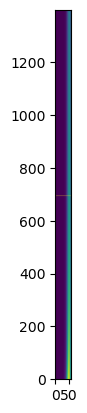

s2n_min:  0.013493427431032011
1400
checking idx_dc:  694


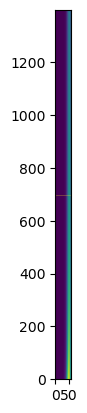

s2n_min:  0.013483811298690767
1400
checking idx_dc:  695


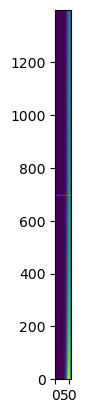

s2n_min:  0.01347421569598864
1400
checking idx_dc:  696


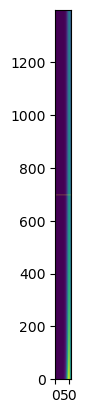

s2n_min:  0.013464640549980998
1400
checking idx_dc:  697


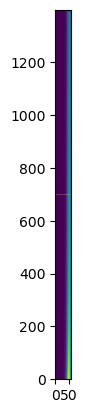

s2n_min:  0.01345508578808556
1400
checking idx_dc:  698


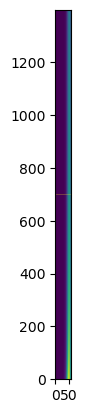

s2n_min:  0.013445551338080067
1400
checking idx_dc:  699


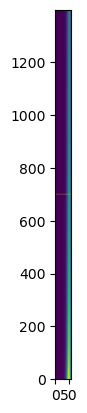

s2n_min:  0.0134360371281
1400
checking idx_dc:  700


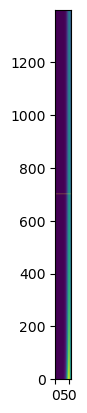

s2n_min:  0.013426543086636301
1400
checking idx_dc:  701


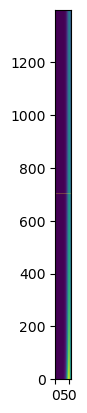

s2n_min:  0.013417069142533116
1400
checking idx_dc:  702


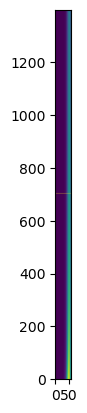

s2n_min:  0.013407615224985554
1400
checking idx_dc:  703


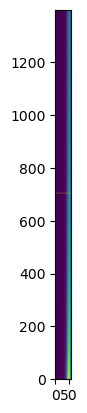

s2n_min:  0.013398181263537468
1400
checking idx_dc:  704


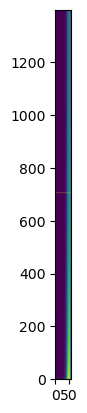

s2n_min:  0.013388767188079244
1400
checking idx_dc:  705


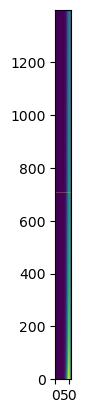

s2n_min:  0.013379372928845622
1400
checking idx_dc:  706


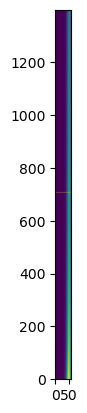

s2n_min:  0.013369998416413509
1400
checking idx_dc:  707


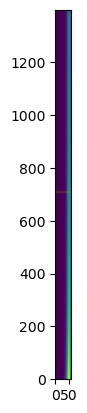

s2n_min:  0.013360643581699848
1400
checking idx_dc:  708


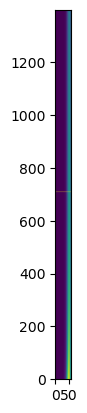

s2n_min:  0.01335130835595945
1400
checking idx_dc:  709


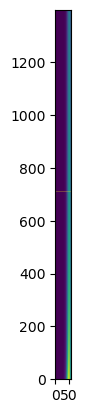

s2n_min:  0.0133419926707829
1400
checking idx_dc:  710


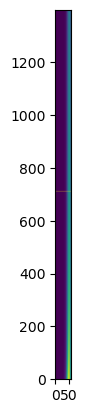

s2n_min:  0.013332696458094432
1400
checking idx_dc:  711


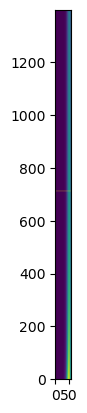

s2n_min:  0.01332341965014985
1400
checking idx_dc:  712


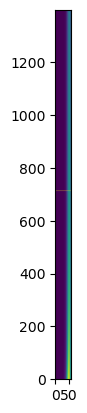

s2n_min:  0.013314162179534454
1400
checking idx_dc:  713


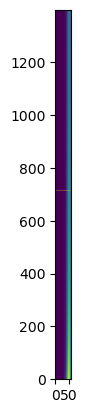

s2n_min:  0.013304923979160973
1400
checking idx_dc:  714


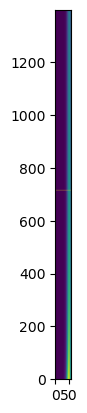

s2n_min:  0.013295704982267535
1400
checking idx_dc:  715


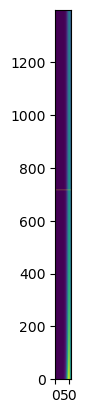

s2n_min:  0.013286505122415639
1400
checking idx_dc:  716


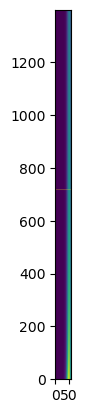

s2n_min:  0.01327732433348813
1400
checking idx_dc:  717


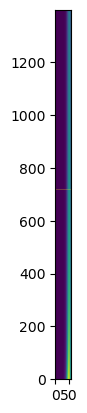

s2n_min:  0.013268162549687225
1400
checking idx_dc:  718


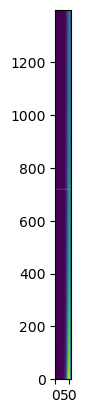

s2n_min:  0.013259019705532513
1400
checking idx_dc:  719


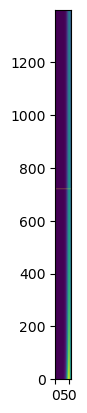

s2n_min:  0.013249895735859002
1400
checking idx_dc:  720


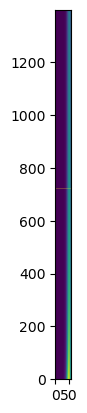

s2n_min:  0.013240790575815163
1400
checking idx_dc:  721


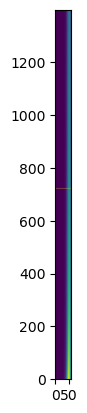

s2n_min:  0.013231704160860999
1400
checking idx_dc:  722


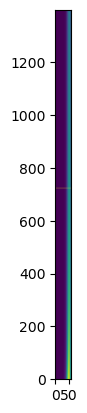

s2n_min:  0.01322263642676611
1400
checking idx_dc:  723


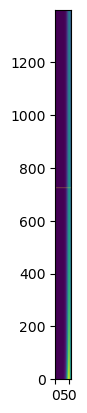

s2n_min:  0.013213587309607805
1400
checking idx_dc:  724


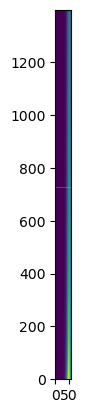

s2n_min:  0.013204556745769192
1400
checking idx_dc:  725


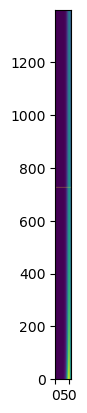

s2n_min:  0.013195544671937317
1400
checking idx_dc:  726


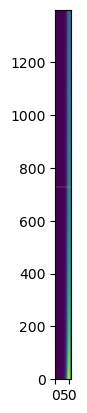

s2n_min:  0.013186551025101278
1400
checking idx_dc:  727


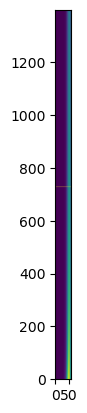

s2n_min:  0.013177575742550402
1400
checking idx_dc:  728


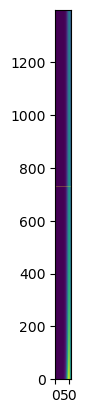

s2n_min:  0.01316861876187238
1400
checking idx_dc:  729


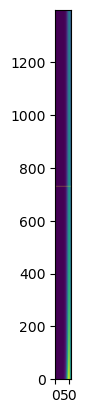

s2n_min:  0.013159680020951461
1400
checking idx_dc:  730


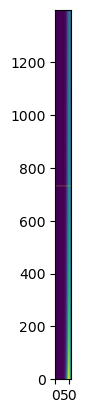

s2n_min:  0.013150759457966645
1400
checking idx_dc:  731


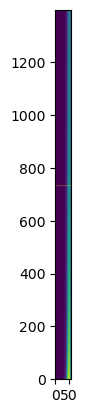

s2n_min:  0.013141857011389873
1400
checking idx_dc:  732


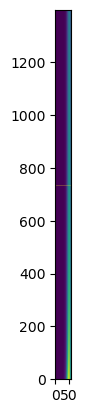

s2n_min:  0.013132972619984262
1400
checking idx_dc:  733


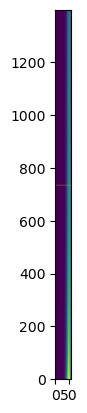

s2n_min:  0.013124106222802316
1400
checking idx_dc:  734


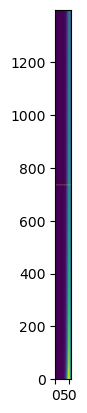

s2n_min:  0.013115257759184191
1400
checking idx_dc:  735


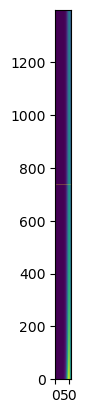

s2n_min:  0.013106427168755938
1400
checking idx_dc:  736


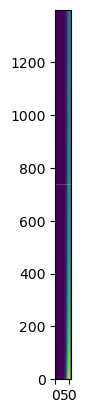

s2n_min:  0.013097614391427776
1400
checking idx_dc:  737


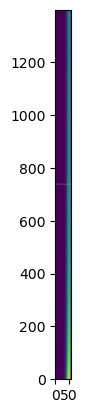

s2n_min:  0.013088819367392377
1400
checking idx_dc:  738


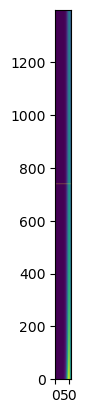

s2n_min:  0.013080042037123155
1400
checking idx_dc:  739


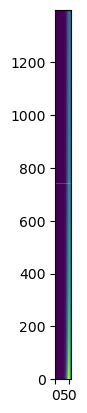

s2n_min:  0.013071282341372583
1400
checking idx_dc:  740


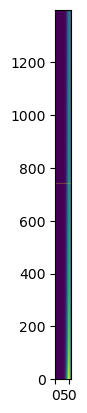

s2n_min:  0.013062540221170512
1400
checking idx_dc:  741


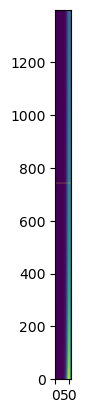

s2n_min:  0.01305381561782249
1400
checking idx_dc:  742


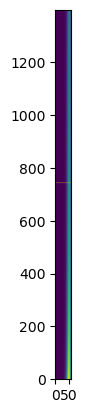

s2n_min:  0.013045108472908126
1400
checking idx_dc:  743


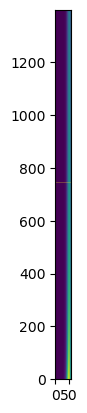

s2n_min:  0.013036418728279438
1400
checking idx_dc:  744


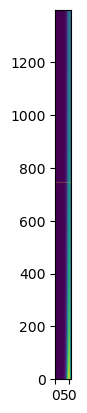

s2n_min:  0.013027746326059212
1400
checking idx_dc:  745


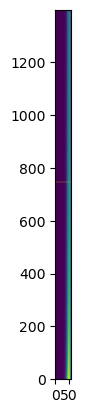

s2n_min:  0.013019091208639413
1400
checking idx_dc:  746


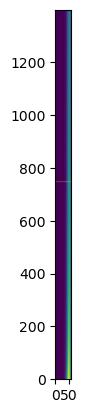

s2n_min:  0.01301045331867954
1400
checking idx_dc:  747


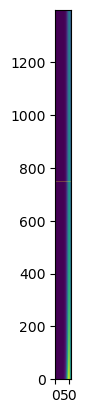

s2n_min:  0.013001832599105053
1400
checking idx_dc:  748


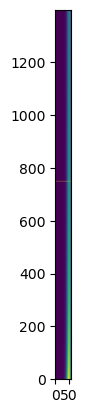

s2n_min:  0.01299322899310579
1400
checking idx_dc:  749


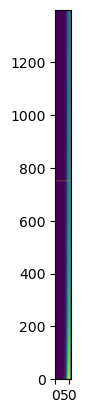

s2n_min:  0.01298464244413438
1400
checking idx_dc:  750


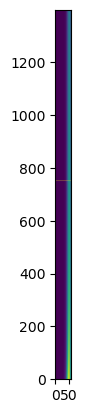

s2n_min:  0.012976072895904708
1400
checking idx_dc:  751


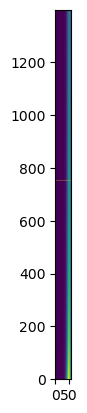

s2n_min:  0.012967520292390325
1400
checking idx_dc:  752


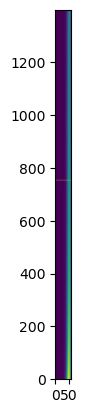

s2n_min:  0.01295898457782296
1400
checking idx_dc:  753


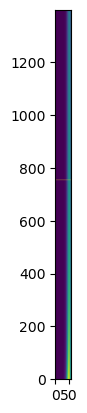

s2n_min:  0.012950465696690937
1400
checking idx_dc:  754


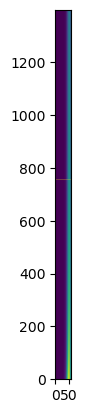

s2n_min:  0.012941963593737707
1400
checking idx_dc:  755


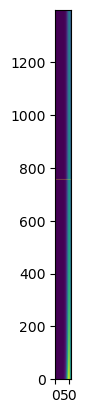

s2n_min:  0.012933478213960327
1400
checking idx_dc:  756


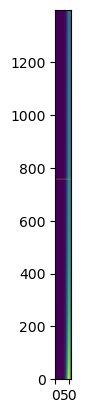

s2n_min:  0.012925009502607939
1400
checking idx_dc:  757


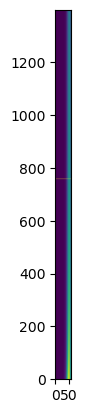

s2n_min:  0.012916557405180334
1400
checking idx_dc:  758


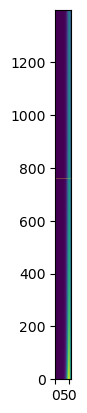

s2n_min:  0.012908121867426436
1400
checking idx_dc:  759


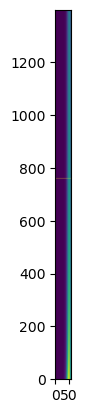

s2n_min:  0.012899702835342869
1400
checking idx_dc:  760


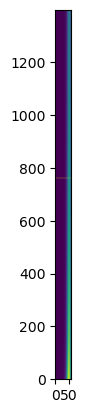

s2n_min:  0.012891300255172487
1400
checking idx_dc:  761


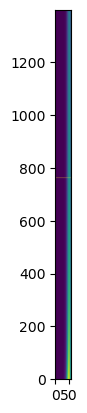

s2n_min:  0.012882914073402939
1400
checking idx_dc:  762


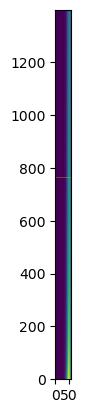

s2n_min:  0.01287454423676524
1400
checking idx_dc:  763


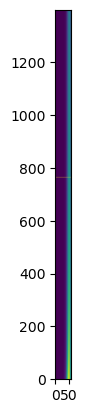

s2n_min:  0.012866190692232344
1400
checking idx_dc:  764


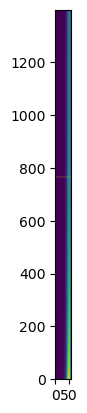

s2n_min:  0.012857853387017736
1400
checking idx_dc:  765


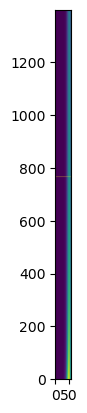

s2n_min:  0.01284953226857404
1400
checking idx_dc:  766


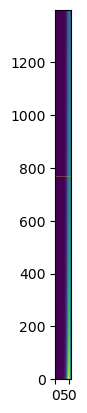

s2n_min:  0.012841227284591604
1400
checking idx_dc:  767


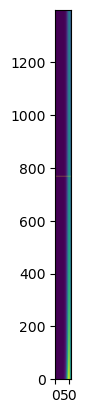

s2n_min:  0.012832938382997145
1400
checking idx_dc:  768


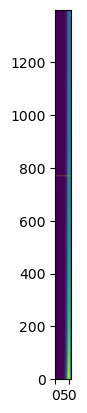

s2n_min:  0.012824665511952361
1400
checking idx_dc:  769


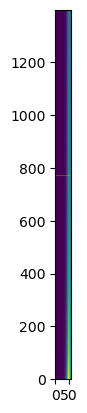

s2n_min:  0.012816408619852586
1400
checking idx_dc:  770


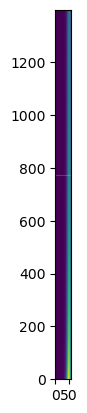

s2n_min:  0.01280816765532541
1400
checking idx_dc:  771


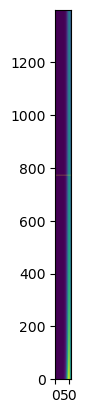

s2n_min:  0.012799942567229366
1400
checking idx_dc:  772


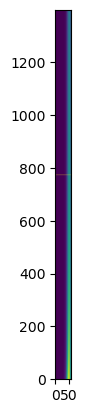

s2n_min:  0.01279173330465258
1400
checking idx_dc:  773


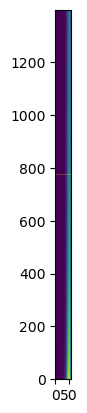

s2n_min:  0.012783539816911453
1400
checking idx_dc:  774


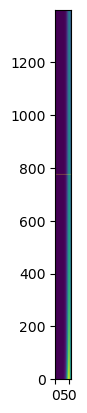

s2n_min:  0.01277536205354935
1400
checking idx_dc:  775


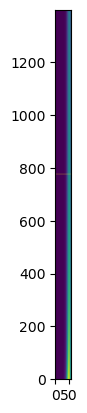

s2n_min:  0.012767199964335282
1400
checking idx_dc:  776


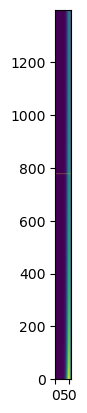

s2n_min:  0.012759053499262622
1400
checking idx_dc:  777


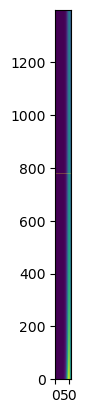

s2n_min:  0.012750922608547825
1400
checking idx_dc:  778


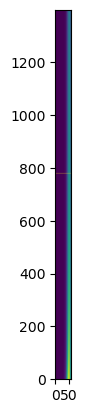

s2n_min:  0.012742807242629122
1400
checking idx_dc:  779


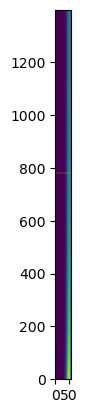

s2n_min:  0.012734707352165288
1400
checking idx_dc:  780


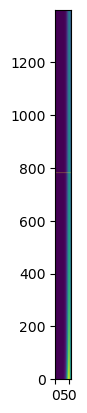

s2n_min:  0.012726622888034354
1400
checking idx_dc:  781


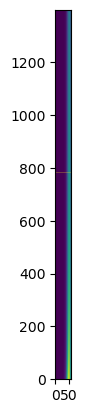

s2n_min:  0.012718553801332366
1400
checking idx_dc:  782


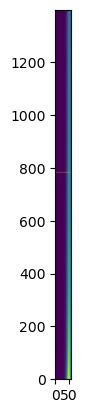

s2n_min:  0.012710500043372139
1400
checking idx_dc:  783


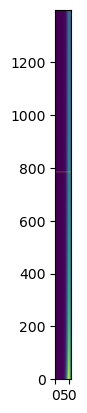

s2n_min:  0.012702461565682032
1400
checking idx_dc:  784


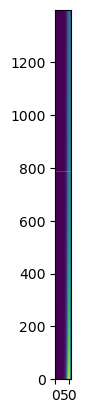

s2n_min:  0.012694438320004716
1400
checking idx_dc:  785


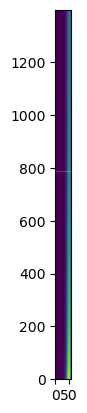

s2n_min:  0.012686430258295956
1400
checking idx_dc:  786


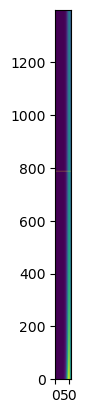

s2n_min:  0.0126784373327234
1400
checking idx_dc:  787


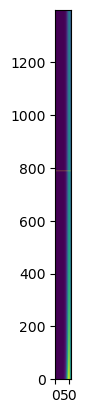

s2n_min:  0.012670459495665396
1400
checking idx_dc:  788


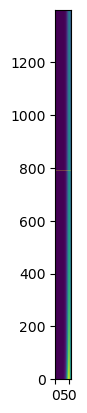

s2n_min:  0.012662496699709775
1400
checking idx_dc:  789


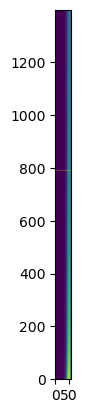

s2n_min:  0.012654548897652692
1400
checking idx_dc:  790


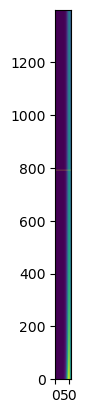

s2n_min:  0.012646616042497432
1400
checking idx_dc:  791


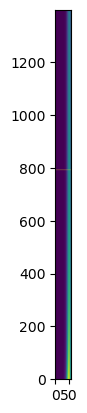

s2n_min:  0.012638698087453246
1400
checking idx_dc:  792


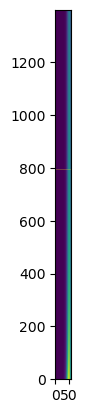

s2n_min:  0.012630794985934215
1400
checking idx_dc:  793


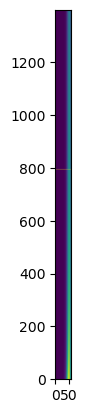

s2n_min:  0.012622906691558054
1400
checking idx_dc:  794


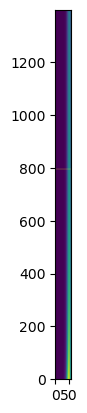

s2n_min:  0.012615033158145012
1400
checking idx_dc:  795


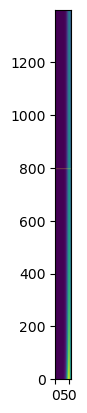

s2n_min:  0.012607174339716717
1400
checking idx_dc:  796


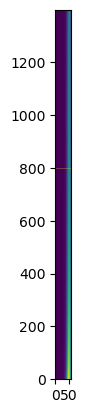

s2n_min:  0.012599330190495042
1400
checking idx_dc:  797


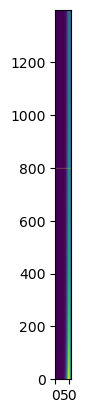

s2n_min:  0.012591500664901006
1400
checking idx_dc:  798


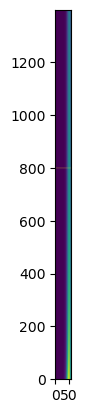

s2n_min:  0.012583685717553637
1400
checking idx_dc:  799


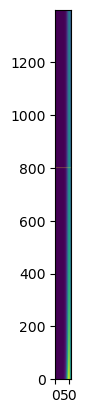

s2n_min:  0.012575885303268886
1400
checking idx_dc:  800


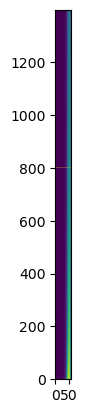

s2n_min:  0.012568099377058524
1400
checking idx_dc:  801


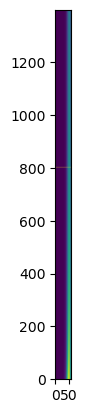

s2n_min:  0.012560327894129045
1400
checking idx_dc:  802


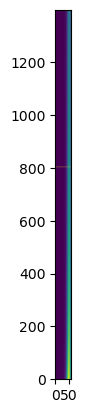

s2n_min:  0.012552570809880597
1400
checking idx_dc:  803


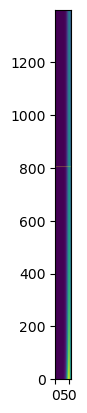

s2n_min:  0.012544828079905894
1400
checking idx_dc:  804


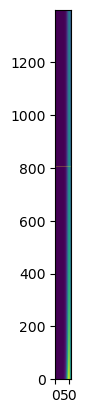

s2n_min:  0.012537099659989158
1400
checking idx_dc:  805


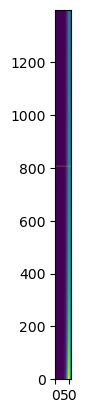

s2n_min:  0.012529385506105058
1400
checking idx_dc:  806


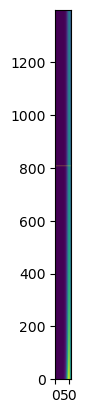

s2n_min:  0.012521685574417641
1400
checking idx_dc:  807


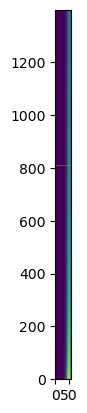

s2n_min:  0.012513999821279315
1400
checking idx_dc:  808


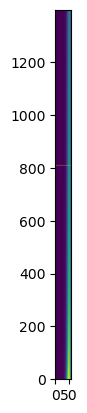

s2n_min:  0.012506328203229776
1400
checking idx_dc:  809


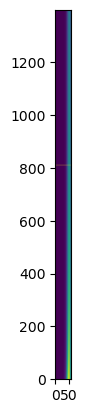

s2n_min:  0.012498670676995005
1400
checking idx_dc:  810


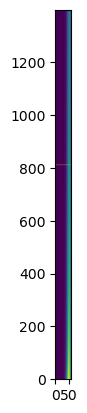

s2n_min:  0.01249102719948623
1400
checking idx_dc:  811


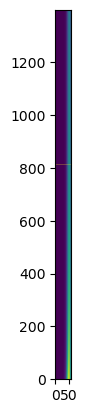

s2n_min:  0.012483397727798896
1400
checking idx_dc:  812


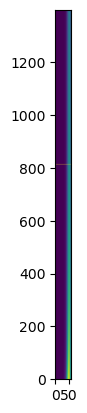

s2n_min:  0.012475782219211681
1400
checking idx_dc:  813


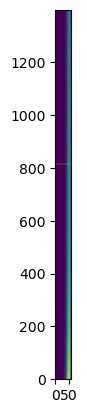

s2n_min:  0.01246818063118547
1400
checking idx_dc:  814


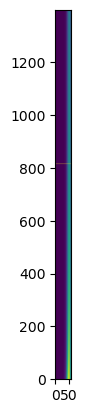

s2n_min:  0.012460592921362361
1400
checking idx_dc:  815


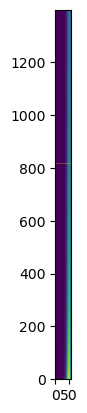

s2n_min:  0.012453019047564679
1400
checking idx_dc:  816


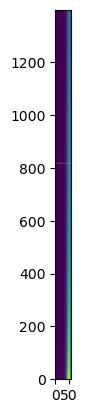

s2n_min:  0.012445458967793983
1400
checking idx_dc:  817


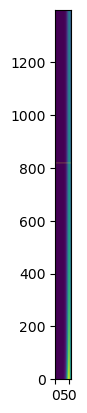

s2n_min:  0.012437912640230099
1400
checking idx_dc:  818


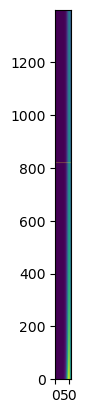

s2n_min:  0.012430380023230136
1400
checking idx_dc:  819


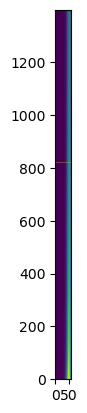

s2n_min:  0.012422861075327536
1400
checking idx_dc:  820


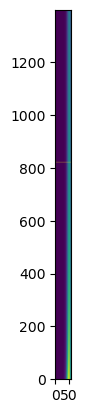

s2n_min:  0.012415355755231094
1400
checking idx_dc:  821


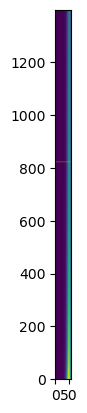

s2n_min:  0.012407864021824032
1400
checking idx_dc:  822


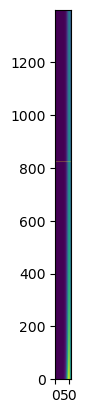

s2n_min:  0.012400385834163028
1400
checking idx_dc:  823


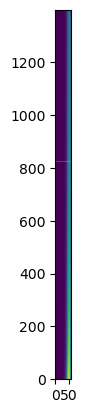

s2n_min:  0.012392921151477288
1400
checking idx_dc:  824


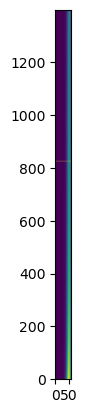

s2n_min:  0.012385469933167623
1400
checking idx_dc:  825


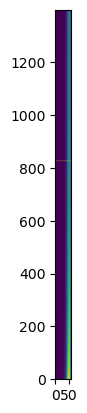

s2n_min:  0.012378032138805492
1400
checking idx_dc:  826


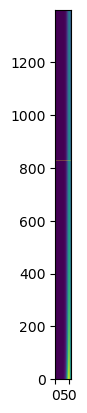

s2n_min:  0.012370607728132112
1400
checking idx_dc:  827


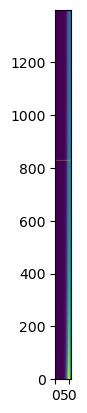

s2n_min:  0.012363196661057528
1400
checking idx_dc:  828


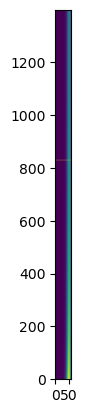

s2n_min:  0.0123557988976597
1400
checking idx_dc:  829


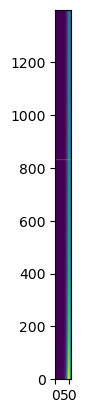

s2n_min:  0.01234841439818361
1400
checking idx_dc:  830


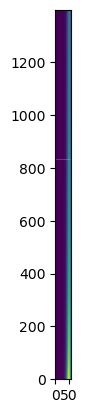

s2n_min:  0.012341043123040359
1400
checking idx_dc:  831


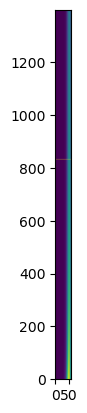

s2n_min:  0.012333685032806269
1400
checking idx_dc:  832


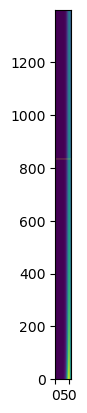

s2n_min:  0.01232634008822202
1400
checking idx_dc:  833


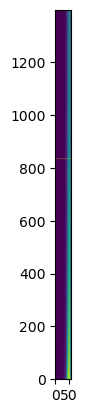

s2n_min:  0.012319008250191742
1400
checking idx_dc:  834


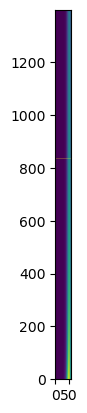

s2n_min:  0.012311689479782159
1400
checking idx_dc:  835


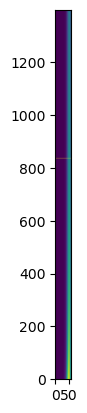

s2n_min:  0.012304383738221718
1400
checking idx_dc:  836


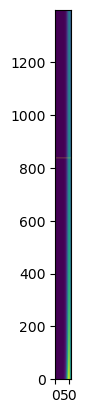

s2n_min:  0.012297090986899717
1400
checking idx_dc:  837


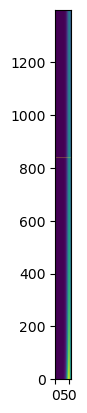

s2n_min:  0.012289811187365463
1400
checking idx_dc:  838


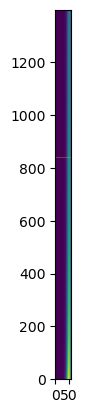

s2n_min:  0.012282544301327405
1400
checking idx_dc:  839


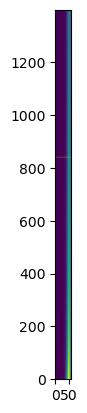

s2n_min:  0.012275290290652306
1400
checking idx_dc:  840


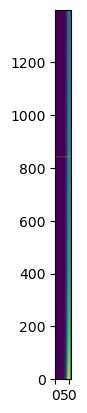

s2n_min:  0.012268049117364378
1400
checking idx_dc:  841


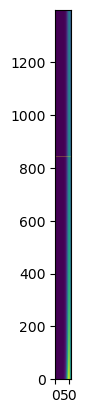

s2n_min:  0.012260820743644476
1400
checking idx_dc:  842


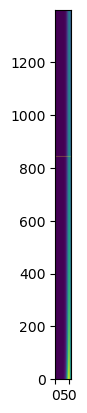

s2n_min:  0.012253605131829244
1400
checking idx_dc:  843


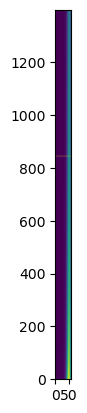

s2n_min:  0.012246402244410301
1400
checking idx_dc:  844


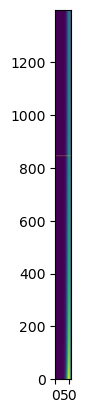

s2n_min:  0.012239212044033426
1400
checking idx_dc:  845


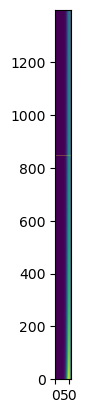

s2n_min:  0.012232034493497737
1400
checking idx_dc:  846


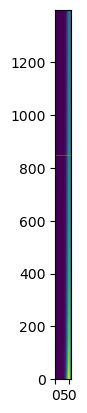

s2n_min:  0.012224869555754884
1400
checking idx_dc:  847


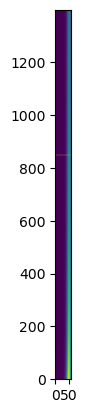

s2n_min:  0.01221771719390825
1400
checking idx_dc:  848


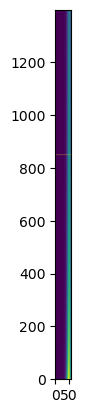

s2n_min:  0.01221057737121215
1400
checking idx_dc:  849


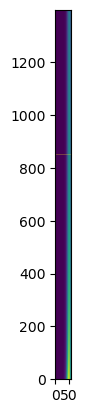

s2n_min:  0.012203450051071037
1400
checking idx_dc:  850


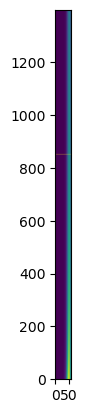

s2n_min:  0.012196335197038713
1400
checking idx_dc:  851


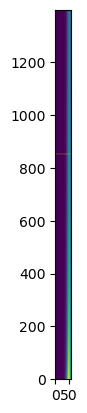

s2n_min:  0.012189232772817556
1400
checking idx_dc:  852


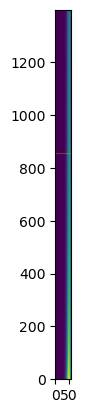

s2n_min:  0.01218214274225773
1400
checking idx_dc:  853


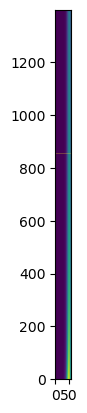

s2n_min:  0.012175065069356415
1400
checking idx_dc:  854


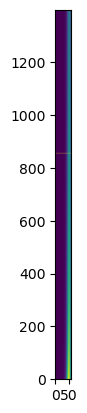

s2n_min:  0.01216799971825705
1400
checking idx_dc:  855


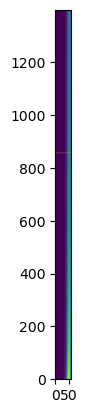

s2n_min:  0.012160946653248553
1400
checking idx_dc:  856


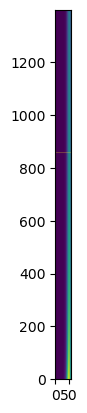

s2n_min:  0.012153905838764573
1400
checking idx_dc:  857


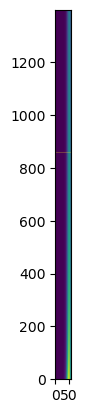

s2n_min:  0.012146877239382738
1400
checking idx_dc:  858


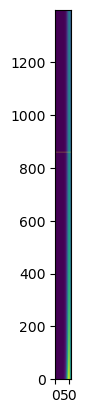

s2n_min:  0.012139860819823902
1400
checking idx_dc:  859


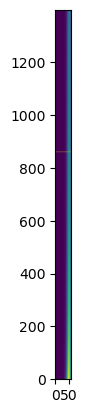

s2n_min:  0.012132856544951404
1400
checking idx_dc:  860


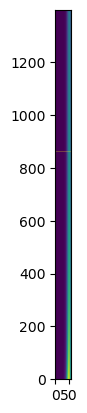

s2n_min:  0.012125864379770323
1400
checking idx_dc:  861


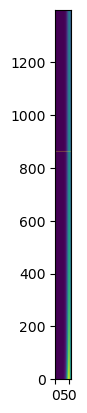

s2n_min:  0.012118884289426757
1400
checking idx_dc:  862


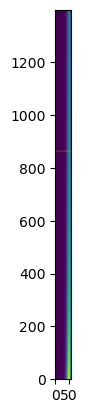

s2n_min:  0.012111916239207075
1400
checking idx_dc:  863


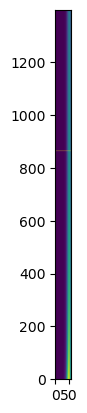

s2n_min:  0.012104960194537209
1400
checking idx_dc:  864


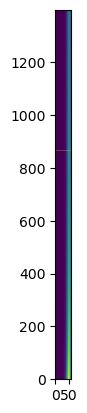

s2n_min:  0.012098016120981927
1400
checking idx_dc:  865


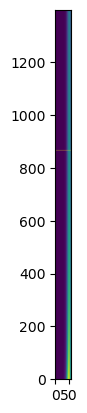

s2n_min:  0.012091083984244105
1400
checking idx_dc:  866


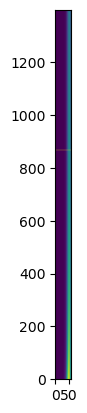

s2n_min:  0.012084163750164044
1400
checking idx_dc:  867


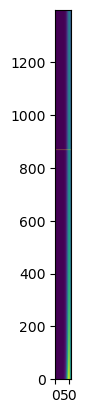

s2n_min:  0.01207725538471873
1400
checking idx_dc:  868


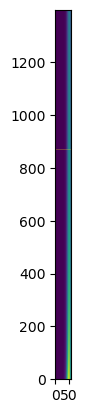

s2n_min:  0.012070358854021156
1400
checking idx_dc:  869


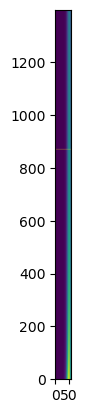

s2n_min:  0.012063474124319615
1400
checking idx_dc:  870


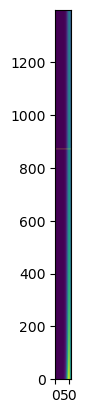

s2n_min:  0.012056601161997001
1400
checking idx_dc:  871


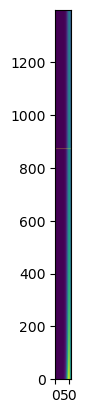

s2n_min:  0.012049739933570131
1400
checking idx_dc:  872


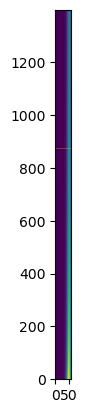

s2n_min:  0.012042890405689047
1400
checking idx_dc:  873


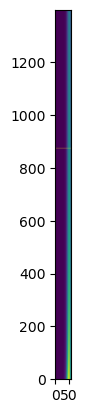

s2n_min:  0.01203605254513635
1400
checking idx_dc:  874


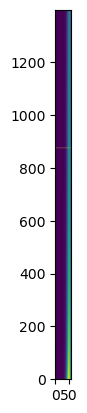

s2n_min:  0.012029226318826509
1400
checking idx_dc:  875


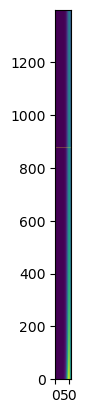

s2n_min:  0.012022411693805198
1400
checking idx_dc:  876


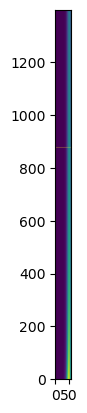

s2n_min:  0.012015608637248624
1400
checking idx_dc:  877


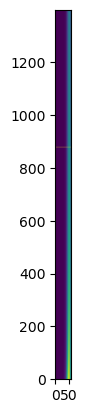

s2n_min:  0.012008817116462862
1400
checking idx_dc:  878


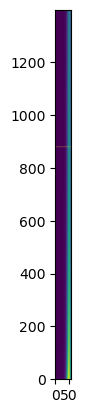

s2n_min:  0.0120020370988832
1400
checking idx_dc:  879


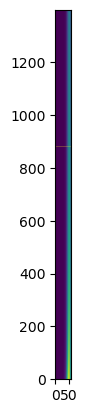

s2n_min:  0.011995268552073482
1400
checking idx_dc:  880


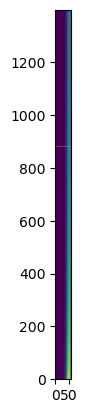

s2n_min:  0.011988511443725446
1400
checking idx_dc:  881


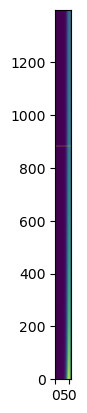

s2n_min:  0.011981765741658093
1400
checking idx_dc:  882


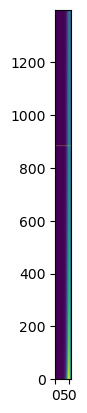

s2n_min:  0.011975031413817032
1400
checking idx_dc:  883


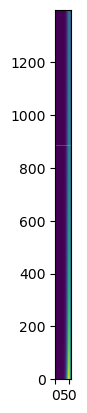

s2n_min:  0.011968308428273835
1400
checking idx_dc:  884


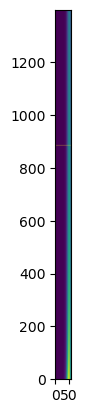

s2n_min:  0.011961596753225431
1400
checking idx_dc:  885


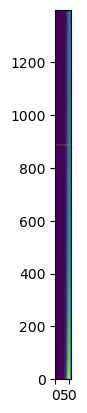

s2n_min:  0.01195489635699343
1400
checking idx_dc:  886


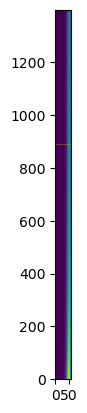

s2n_min:  0.011948207208023523
1400
checking idx_dc:  887


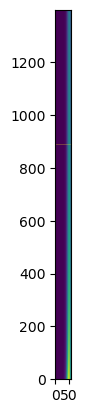

s2n_min:  0.011941529274884864
1400
checking idx_dc:  888


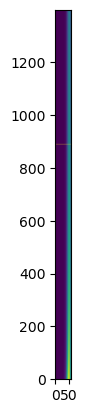

s2n_min:  0.011934862526269425
1400
checking idx_dc:  889


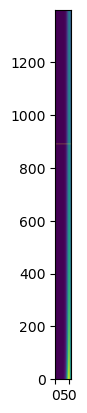

s2n_min:  0.011928206930991397
1400
checking idx_dc:  890


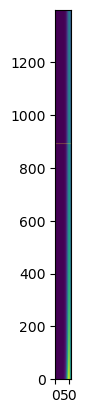

s2n_min:  0.011921562457986578
1400
checking idx_dc:  891


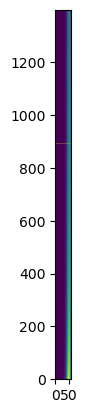

s2n_min:  0.011914929076311748
1400
checking idx_dc:  892


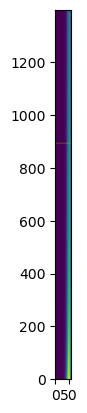

s2n_min:  0.011908306755144085
1400
checking idx_dc:  893


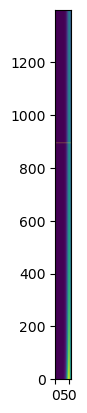

s2n_min:  0.011901695463780546
1400
checking idx_dc:  894


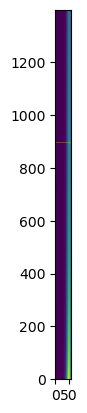

s2n_min:  0.011895095171637287
1400
checking idx_dc:  895


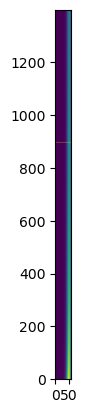

s2n_min:  0.011888505848249043
1400
checking idx_dc:  896


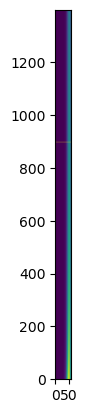

s2n_min:  0.011881927463268563
1400
checking idx_dc:  897


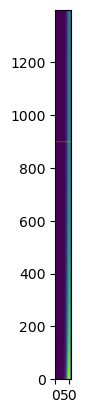

s2n_min:  0.01187535998646601
1400
checking idx_dc:  898


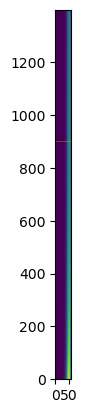

s2n_min:  0.01186880338772838
1400
checking idx_dc:  899


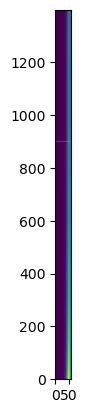

s2n_min:  0.01186225763705892
1400
checking idx_dc:  900


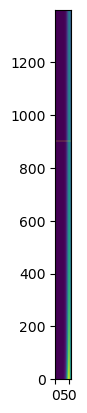

s2n_min:  0.01185572270457656
1400
checking idx_dc:  901


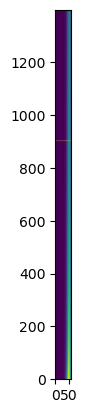

s2n_min:  0.011849198560515325
1400
checking idx_dc:  902


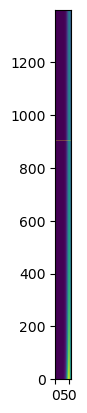

s2n_min:  0.011842685175223782
1400
checking idx_dc:  903


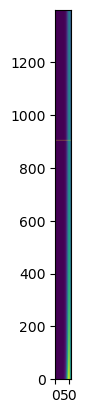

s2n_min:  0.01183618251916446
1400
checking idx_dc:  904


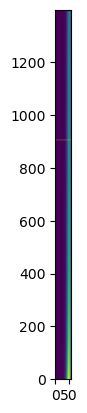

s2n_min:  0.011829690562913305
1400
checking idx_dc:  905


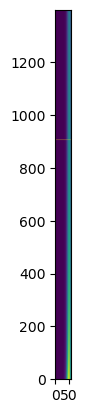

s2n_min:  0.011823209277159092
1400
checking idx_dc:  906


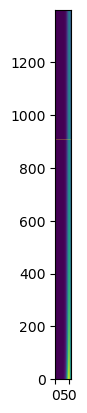

s2n_min:  0.011816738632702902
1400
checking idx_dc:  907


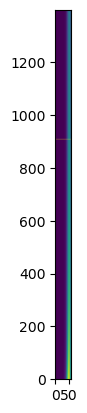

s2n_min:  0.011810278600457549
1400
checking idx_dc:  908


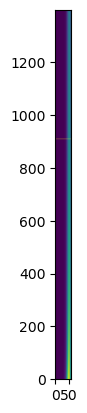

s2n_min:  0.01180382915144703
1400
checking idx_dc:  909


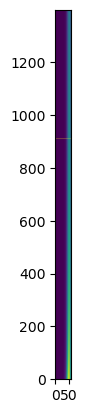

s2n_min:  0.011797390256806003
1400
checking idx_dc:  910


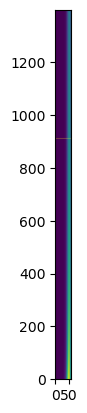

s2n_min:  0.011790961887779205
1400
checking idx_dc:  911


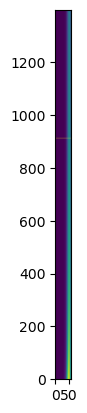

s2n_min:  0.011784544015720946
1400
checking idx_dc:  912


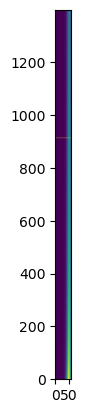

s2n_min:  0.011778136612094562
1400
checking idx_dc:  913


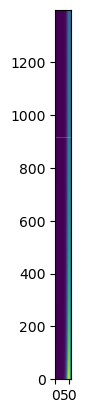

s2n_min:  0.011771739648471875
1400
checking idx_dc:  914


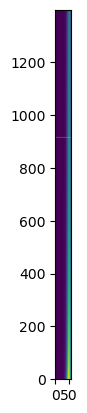

s2n_min:  0.011765353096532679
1400
checking idx_dc:  915


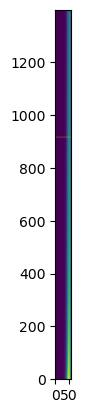

s2n_min:  0.011758976928064189
1400
checking idx_dc:  916


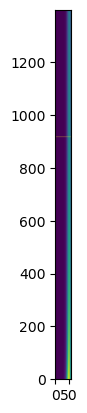

s2n_min:  0.011752611114960548
1400
checking idx_dc:  917


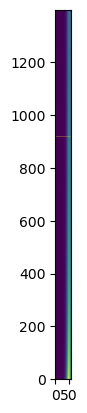

s2n_min:  0.011746255629222283
1400
checking idx_dc:  918


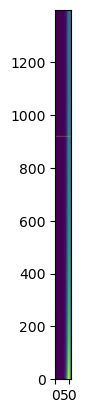

s2n_min:  0.011739910442955796
1400
checking idx_dc:  919


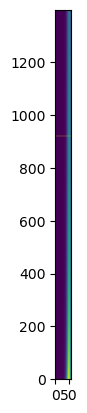

s2n_min:  0.011733575528372855
1400
checking idx_dc:  920


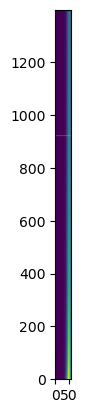

s2n_min:  0.011727250857790068
1400
checking idx_dc:  921


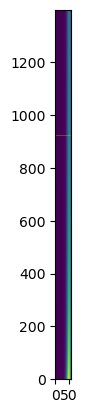

s2n_min:  0.011720936403628392
1400
checking idx_dc:  922


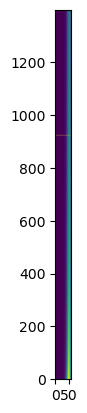

s2n_min:  0.011714632138412623
1400
checking idx_dc:  923


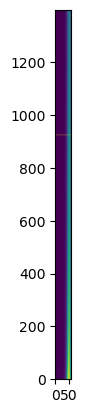

s2n_min:  0.011708338034770881
1400
checking idx_dc:  924


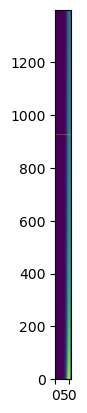

s2n_min:  0.011702054065434127
1400
checking idx_dc:  925


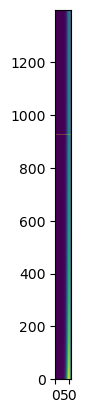

s2n_min:  0.011695780203235666
1400
checking idx_dc:  926


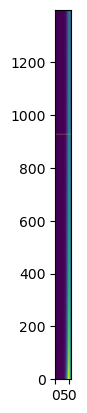

s2n_min:  0.011689516421110636
1400
checking idx_dc:  927


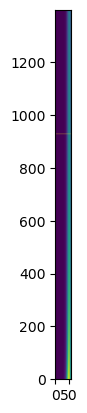

s2n_min:  0.011683262692095546
1400
checking idx_dc:  928


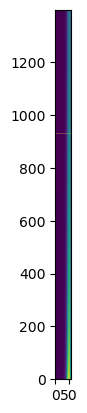

s2n_min:  0.011677018989327754
1400
checking idx_dc:  929


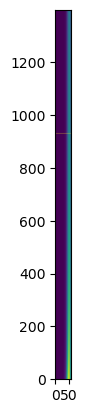

s2n_min:  0.011670785286045022
1400
checking idx_dc:  930


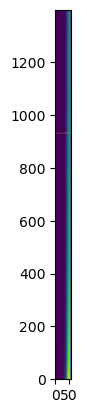

s2n_min:  0.011664561555584997
1400
checking idx_dc:  931


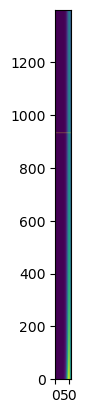

s2n_min:  0.011658347771384754
1400
checking idx_dc:  932


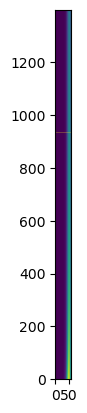

s2n_min:  0.011652143906980317
1400
checking idx_dc:  933


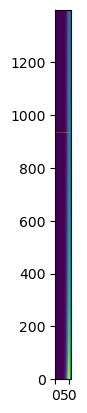

s2n_min:  0.011645949936006178
1400
checking idx_dc:  934


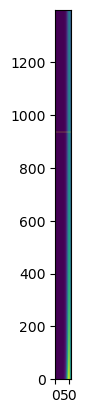

s2n_min:  0.011639765832194839
1400
checking idx_dc:  935


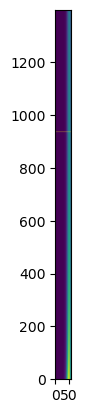

s2n_min:  0.011633591569376324
1400
checking idx_dc:  936


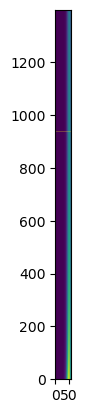

s2n_min:  0.011627427121477739
1400
checking idx_dc:  937


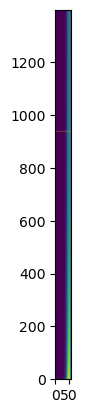

s2n_min:  0.011621272462522788
1400
checking idx_dc:  938


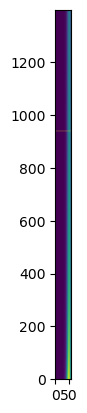

s2n_min:  0.011615127566631325
1400
checking idx_dc:  939


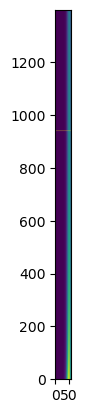

s2n_min:  0.011608992408018895
1400
checking idx_dc:  940


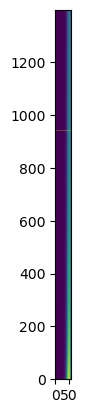

s2n_min:  0.011602866960996277
1400
checking idx_dc:  941


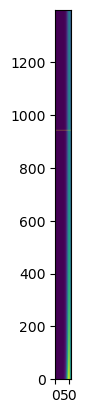

s2n_min:  0.011596751199969035
1400
checking idx_dc:  942


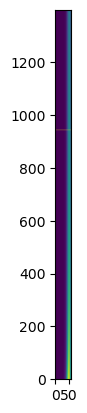

s2n_min:  0.01159064509943707
1400
checking idx_dc:  943


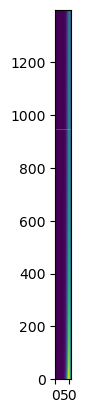

s2n_min:  0.011584548633994166
1400
checking idx_dc:  944


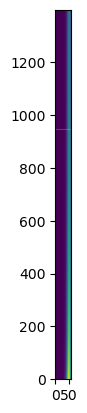

s2n_min:  0.011578461778327555
1400
checking idx_dc:  945


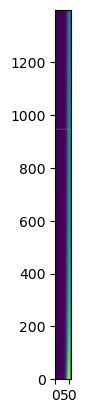

s2n_min:  0.011572384507217464
1400
checking idx_dc:  946


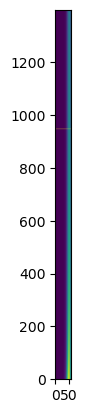

s2n_min:  0.011566316795536699
1400
checking idx_dc:  947


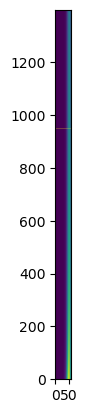

s2n_min:  0.011560258618250179
1400
checking idx_dc:  948


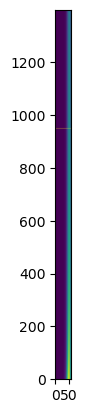

s2n_min:  0.011554209950414522
1400
checking idx_dc:  949


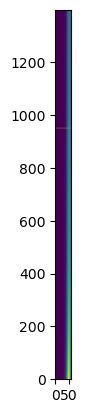

s2n_min:  0.011548170767177613
1400
checking idx_dc:  950


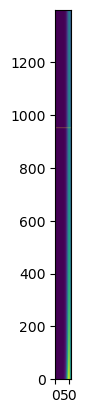

s2n_min:  0.011542141043778162
1400
checking idx_dc:  951


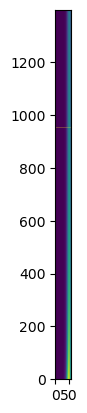

s2n_min:  0.01153612075554529
1400
checking idx_dc:  952


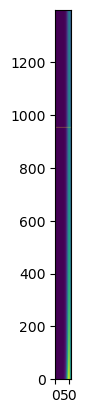

s2n_min:  0.011530109877898102
1400
checking idx_dc:  953


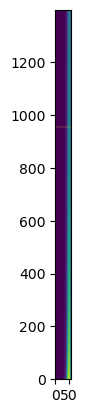

s2n_min:  0.01152410838634526
1400
checking idx_dc:  954


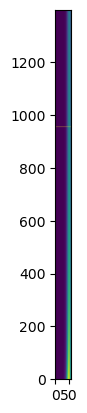

s2n_min:  0.011518116256484578
1400
checking idx_dc:  955


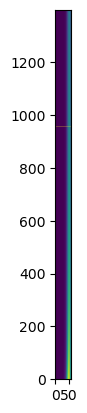

s2n_min:  0.011512133464002585
1400
checking idx_dc:  956


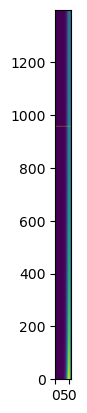

s2n_min:  0.01150615998467413
1400
checking idx_dc:  957


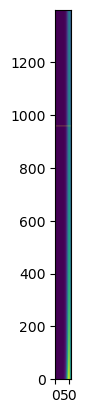

s2n_min:  0.011500195794361952
1400
checking idx_dc:  958


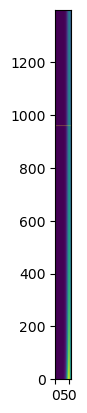

s2n_min:  0.011494240869016289
1400
checking idx_dc:  959


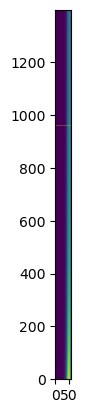

s2n_min:  0.011488295184674459
1400
checking idx_dc:  960


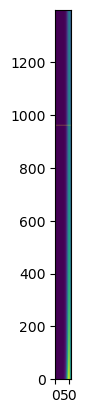

s2n_min:  0.01148235871746045
1400
checking idx_dc:  961


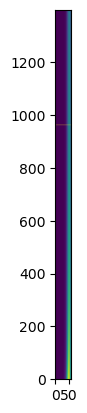

s2n_min:  0.011476431443584534
1400
checking idx_dc:  962


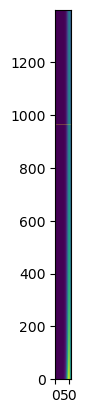

s2n_min:  0.011470513339342854
1400
checking idx_dc:  963


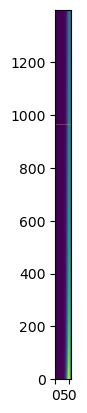

s2n_min:  0.011464604381117028
1400
checking idx_dc:  964


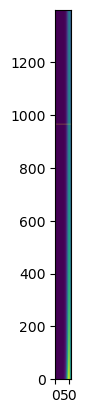

s2n_min:  0.01145870454537376
1400
checking idx_dc:  965


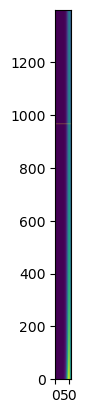

s2n_min:  0.011452813808664431
1400
checking idx_dc:  966


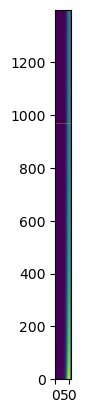

s2n_min:  0.011446932147624725
1400
checking idx_dc:  967


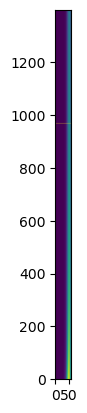

s2n_min:  0.011441059538974226
1400
checking idx_dc:  968


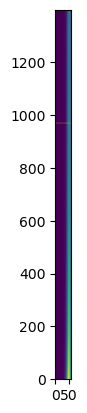

s2n_min:  0.011435195959516045
1400
checking idx_dc:  969


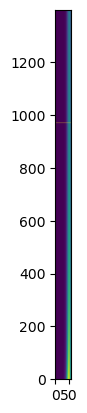

s2n_min:  0.011429341386136422
1400
checking idx_dc:  970


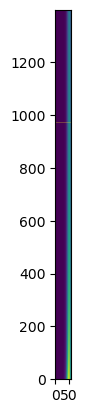

s2n_min:  0.011423495795804345
1400
checking idx_dc:  971


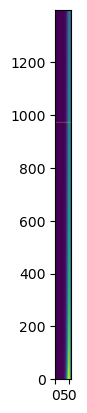

s2n_min:  0.011417659165571182
1400
checking idx_dc:  972


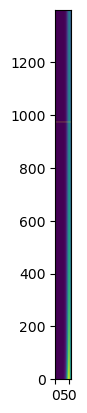

s2n_min:  0.011411831472570284
1400
checking idx_dc:  973


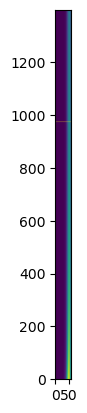

s2n_min:  0.011406012694016626
1400
checking idx_dc:  974


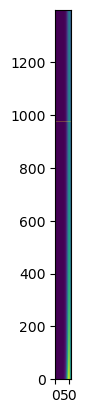

s2n_min:  0.011400202807206425
1400
checking idx_dc:  975


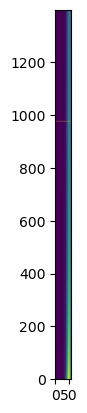

s2n_min:  0.011394401789516758
1400
checking idx_dc:  976


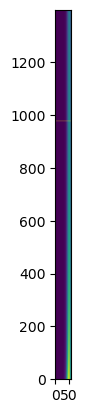

s2n_min:  0.011388609618405215
1400
checking idx_dc:  977


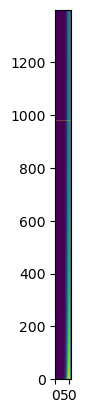

s2n_min:  0.011382826271409508
1400
checking idx_dc:  978


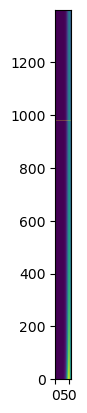

s2n_min:  0.011377051726147124
1400
checking idx_dc:  979


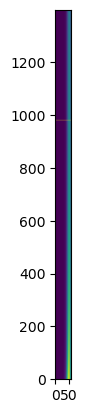

s2n_min:  0.01137128596031495
1400
checking idx_dc:  980


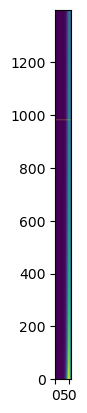

s2n_min:  0.011365528951688906
1400
checking idx_dc:  981


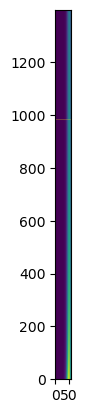

s2n_min:  0.011359780678123604
1400
checking idx_dc:  982


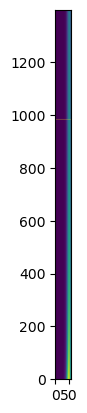

s2n_min:  0.011354041117551972
1400
checking idx_dc:  983


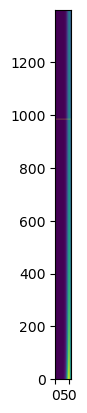

s2n_min:  0.011348310247984909
1400
checking idx_dc:  984


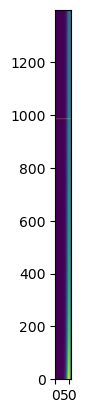

s2n_min:  0.011342588047510926
1400
checking idx_dc:  985


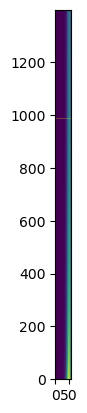

s2n_min:  0.011336874494295794
1400
checking idx_dc:  986


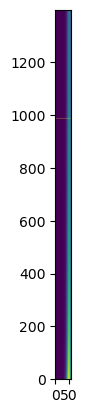

s2n_min:  0.0113311695665822
1400
checking idx_dc:  987


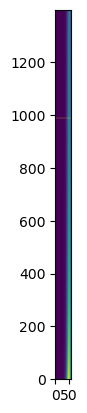

s2n_min:  0.011325473242689389
1400
checking idx_dc:  988


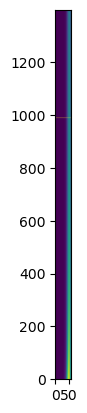

s2n_min:  0.01131978550101283
1400
checking idx_dc:  989


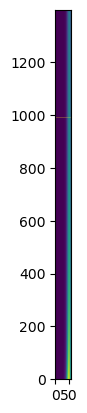

s2n_min:  0.011314106320023864
1400
checking idx_dc:  990


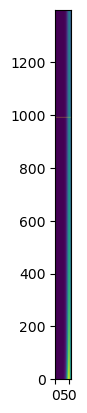

s2n_min:  0.011308435678269358
1400
checking idx_dc:  991


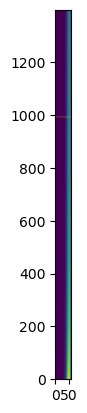

s2n_min:  0.011302773554371377
1400
checking idx_dc:  992


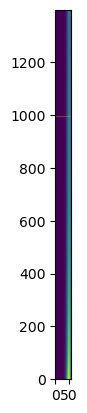

s2n_min:  0.011297119927026833
1400
checking idx_dc:  993


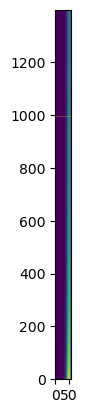

s2n_min:  0.011291474775007157
1400
checking idx_dc:  994


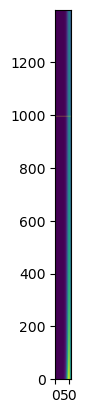

s2n_min:  0.011285838077157963
1400
checking idx_dc:  995


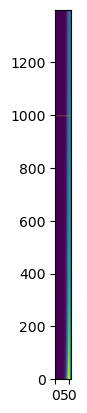

s2n_min:  0.011280209812398705
1400
checking idx_dc:  996


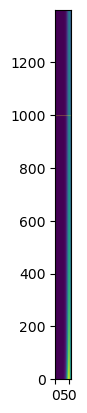

s2n_min:  0.011274589959722364
1400
checking idx_dc:  997


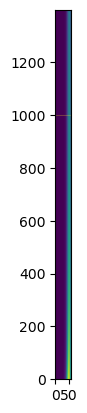

s2n_min:  0.011268978498195102
1400
checking idx_dc:  998


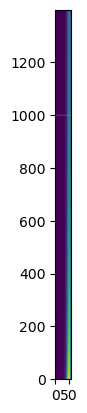

s2n_min:  0.011263375406955942
1400
checking idx_dc:  999


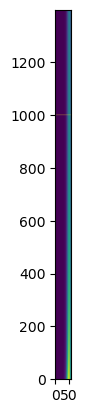

s2n_min:  0.011257780665216445
1400
checking idx_dc:  1000


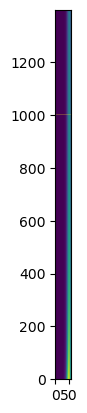

s2n_min:  0.01125219425226038
1400
checking idx_dc:  1001


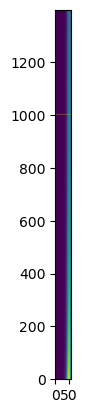

s2n_min:  0.011246616147443399
1400
checking idx_dc:  1002


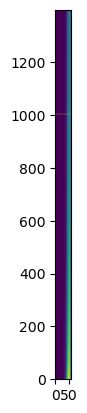

s2n_min:  0.011241046330192735
1400
checking idx_dc:  1003


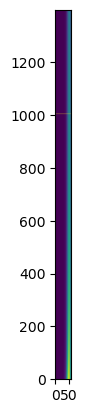

s2n_min:  0.011235484780006856
1400
checking idx_dc:  1004


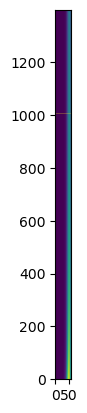

s2n_min:  0.011229931476455172
1400
checking idx_dc:  1005


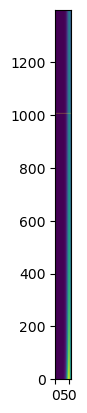

s2n_min:  0.01122438639917771
1400
checking idx_dc:  1006


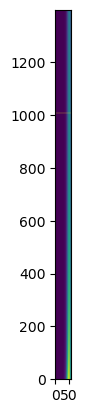

s2n_min:  0.01121884952788479
1400
checking idx_dc:  1007


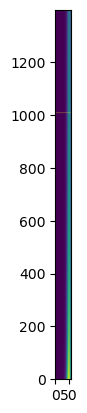

s2n_min:  0.011213320842356737
1400
checking idx_dc:  1008


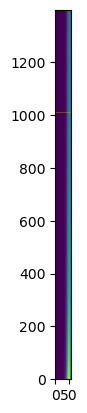

s2n_min:  0.011207800322443546
1400
checking idx_dc:  1009


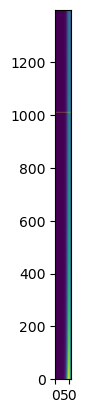

s2n_min:  0.011202287948064596
1400
checking idx_dc:  1010


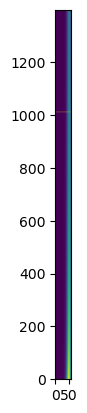

s2n_min:  0.011196783699208325
1400
checking idx_dc:  1011


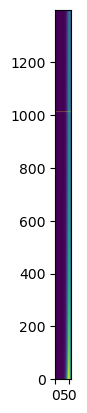

s2n_min:  0.011191287555931934
1400
checking idx_dc:  1012


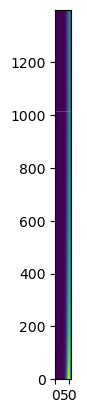

s2n_min:  0.011185799498361085
1400
checking idx_dc:  1013


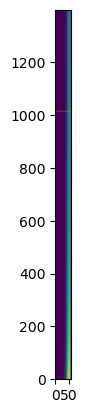

s2n_min:  0.011180319506689587
1400
checking idx_dc:  1014


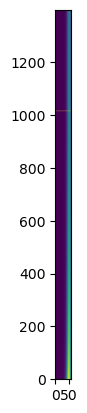

s2n_min:  0.011174847561179117
1400
checking idx_dc:  1015


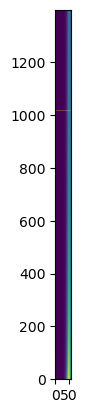

s2n_min:  0.011169383642158899
1400
checking idx_dc:  1016


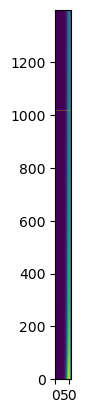

s2n_min:  0.011163927730025424
1400
checking idx_dc:  1017


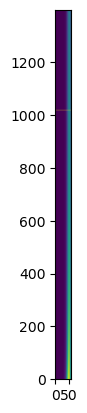

s2n_min:  0.011158479805242144
1400
checking idx_dc:  1018


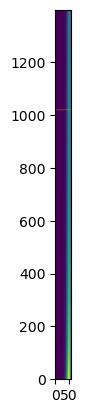

s2n_min:  0.01115303984833918
1400
checking idx_dc:  1019


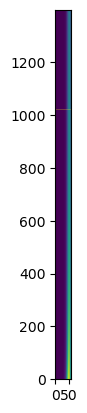

s2n_min:  0.01114760783991304
1400
checking idx_dc:  1020


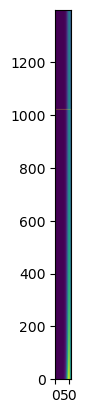

s2n_min:  0.01114218376062631
1400
checking idx_dc:  1021


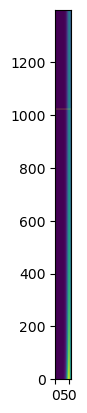

s2n_min:  0.01113676759120738
1400
checking idx_dc:  1022


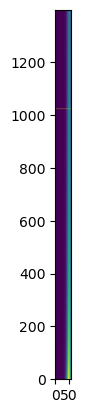

s2n_min:  0.01113135931245015
1400
checking idx_dc:  1023


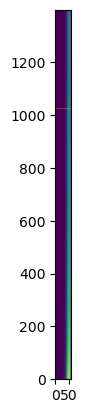

s2n_min:  0.011125958905213746
1400
checking idx_dc:  1024


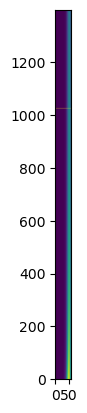

s2n_min:  0.011120566350422236
1400
checking idx_dc:  1025


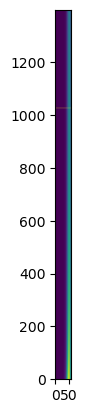

s2n_min:  0.01111518162906434
1400
checking idx_dc:  1026


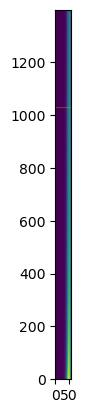

s2n_min:  0.011109804722193166
1400
checking idx_dc:  1027


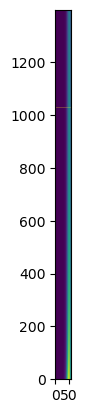

s2n_min:  0.011104435610925901
1400
checking idx_dc:  1028


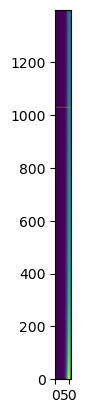

s2n_min:  0.011099074276443565
1400
checking idx_dc:  1029


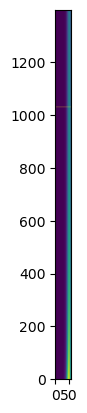

s2n_min:  0.011093720699990713
1400
checking idx_dc:  1030


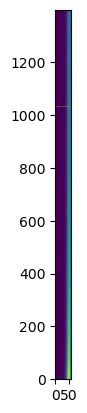

s2n_min:  0.011088374862875162
1400
checking idx_dc:  1031


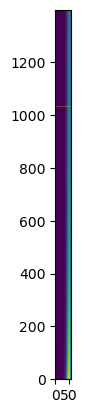

s2n_min:  0.011083036746467725
1400
checking idx_dc:  1032


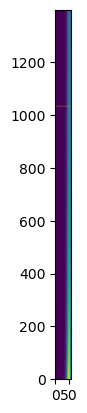

s2n_min:  0.01107770633220193
1400
checking idx_dc:  1033


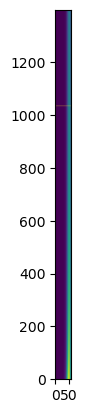

s2n_min:  0.01107238360157375
1400
checking idx_dc:  1034


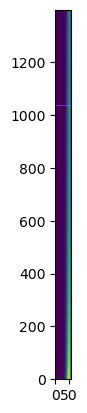

s2n_min:  0.011067068536141348
1400
checking idx_dc:  1035


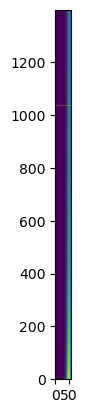

s2n_min:  0.011061761117524778
1400
checking idx_dc:  1036


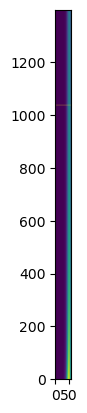

s2n_min:  0.011056461327405745
1400
checking idx_dc:  1037


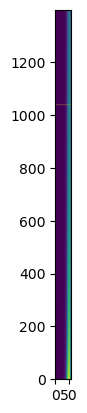

s2n_min:  0.011051169147527334
1400
checking idx_dc:  1038


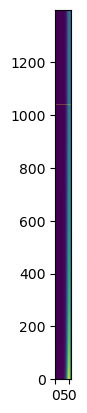

s2n_min:  0.011045884559693731
1400
checking idx_dc:  1039


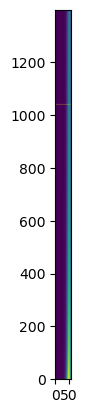

s2n_min:  0.011040607545769986
1400
checking idx_dc:  1040


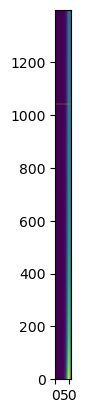

s2n_min:  0.011035338087681729
1400
checking idx_dc:  1041


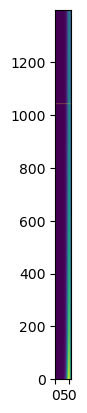

s2n_min:  0.011030076167414912
1400
checking idx_dc:  1042


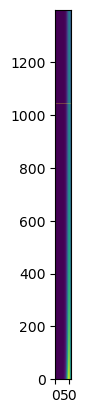

s2n_min:  0.011024821767015571
1400
checking idx_dc:  1043


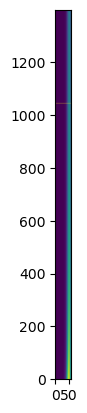

s2n_min:  0.011019574868589541
1400
checking idx_dc:  1044


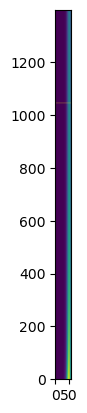

s2n_min:  0.011014335454302226
1400
checking idx_dc:  1045


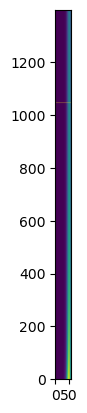

s2n_min:  0.011009103506378315
1400
checking idx_dc:  1046


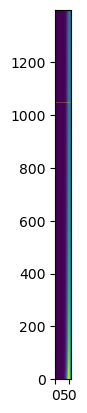

s2n_min:  0.011003879007101562
1400
checking idx_dc:  1047


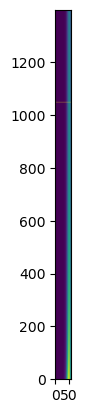

s2n_min:  0.010998661938814505
1400
checking idx_dc:  1048


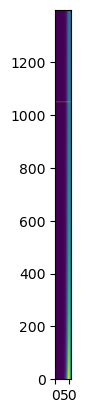

s2n_min:  0.010993452283918237
1400
checking idx_dc:  1049


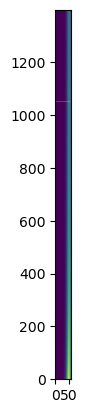

s2n_min:  0.010988250024872142
1400
checking idx_dc:  1050


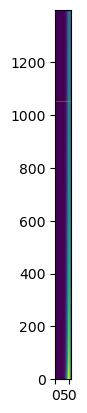

s2n_min:  0.010983055144193652
1400
checking idx_dc:  1051


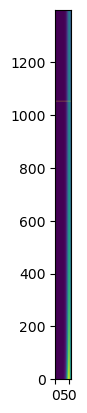

s2n_min:  0.010977867624458005
1400
checking idx_dc:  1052


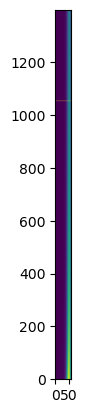

s2n_min:  0.01097268744829799
1400
checking idx_dc:  1053


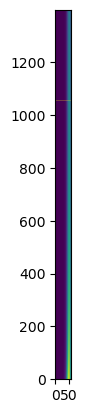

s2n_min:  0.010967514598403711
1400
checking idx_dc:  1054


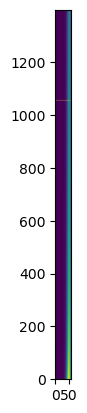

s2n_min:  0.010962349057522342
1400
checking idx_dc:  1055


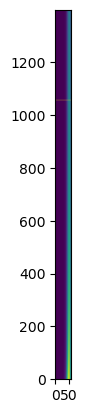

s2n_min:  0.010957190808457879
1400
checking idx_dc:  1056


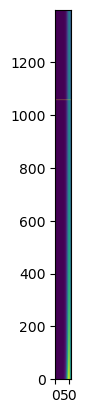

s2n_min:  0.010952039834070913
1400
checking idx_dc:  1057


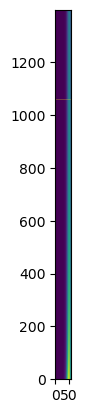

s2n_min:  0.010946896117278374
1400
checking idx_dc:  1058


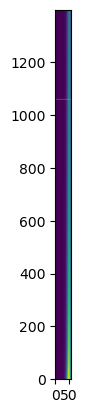

s2n_min:  0.010941759641053306
1400
checking idx_dc:  1059


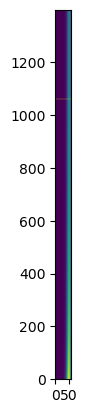

s2n_min:  0.01093663038842463
1400
checking idx_dc:  1060


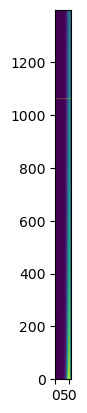

s2n_min:  0.010931508342476899
1400
checking idx_dc:  1061


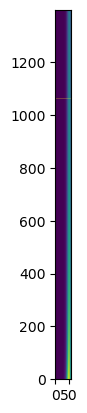

s2n_min:  0.010926393486350069
1400
checking idx_dc:  1062


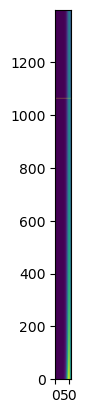

s2n_min:  0.010921285803239266
1400
checking idx_dc:  1063


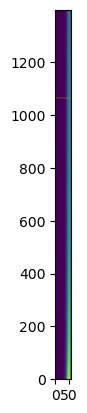

s2n_min:  0.010916185276394558
1400
checking idx_dc:  1064


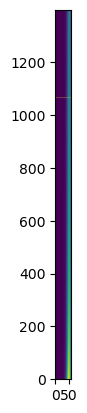

s2n_min:  0.01091109188912072
1400
checking idx_dc:  1065


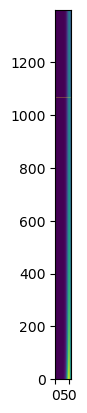

s2n_min:  0.010906005624777
1400
checking idx_dc:  1066


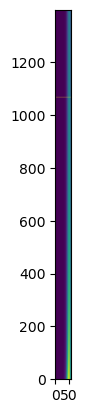

s2n_min:  0.010900926466776904
1400
checking idx_dc:  1067


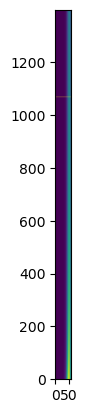

s2n_min:  0.01089585439858795
1400
checking idx_dc:  1068


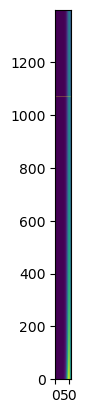

s2n_min:  0.01089078940373146
1400
checking idx_dc:  1069


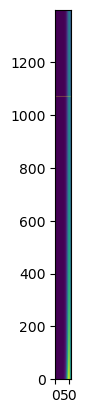

s2n_min:  0.010885731465782327
1400
checking idx_dc:  1070


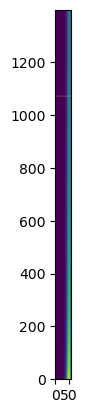

s2n_min:  0.010880680568368791
1400
checking idx_dc:  1071


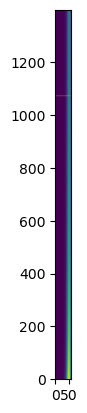

s2n_min:  0.010875636695172214
1400
checking idx_dc:  1072


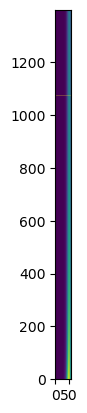

s2n_min:  0.010870599829926867
1400
checking idx_dc:  1073


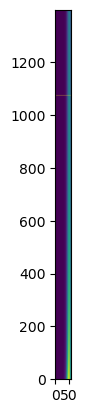

s2n_min:  0.0108655699564197
1400
checking idx_dc:  1074


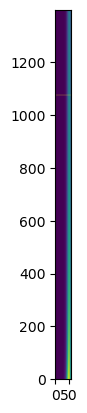

s2n_min:  0.010860547058490133
1400
checking idx_dc:  1075


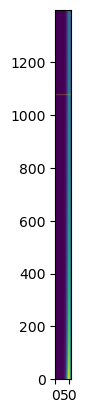

s2n_min:  0.010855531120029824
1400
checking idx_dc:  1076


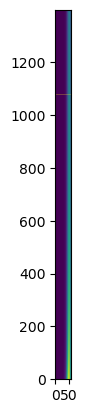

s2n_min:  0.010850522124982474
1400
checking idx_dc:  1077


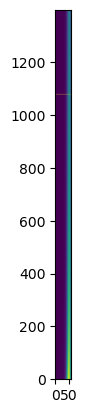

s2n_min:  0.010845520057343577
1400
checking idx_dc:  1078


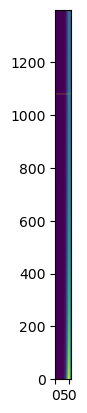

s2n_min:  0.010840524901160248
1400
checking idx_dc:  1079


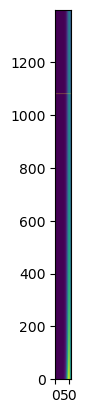

s2n_min:  0.010835536640530968
1400
checking idx_dc:  1080


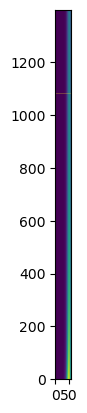

s2n_min:  0.010830555259605409
1400
checking idx_dc:  1081


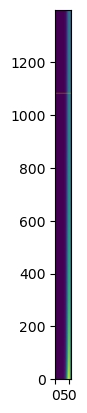

s2n_min:  0.010825580742584183
1400
checking idx_dc:  1082


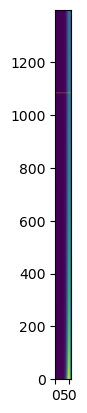

s2n_min:  0.01082061307371867
1400
checking idx_dc:  1083


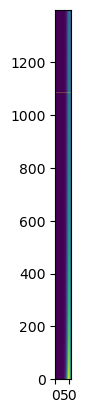

s2n_min:  0.01081565223731078
1400
checking idx_dc:  1084


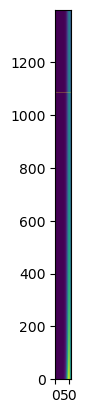

s2n_min:  0.010810698217712765
1400
checking idx_dc:  1085


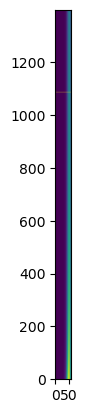

s2n_min:  0.010805750999326994
1400
checking idx_dc:  1086


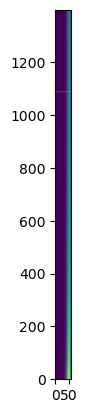

s2n_min:  0.010800810566605756
1400
checking idx_dc:  1087


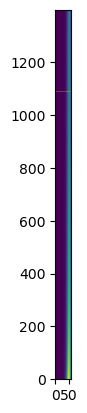

s2n_min:  0.01079587690405106
1400
checking idx_dc:  1088


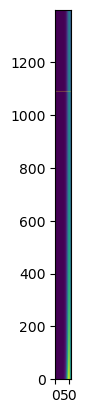

s2n_min:  0.010790949996214418
1400
checking idx_dc:  1089


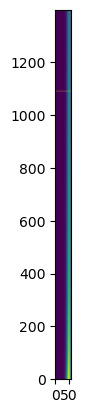

s2n_min:  0.010786029827696655
1400
checking idx_dc:  1090


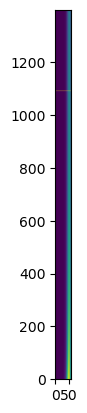

s2n_min:  0.010781116383147693
1400
checking idx_dc:  1091


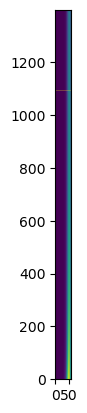

s2n_min:  0.010776209647266362
1400
checking idx_dc:  1092


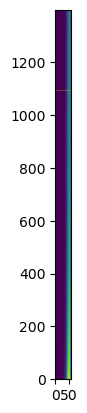

s2n_min:  0.010771309604800194
1400
checking idx_dc:  1093


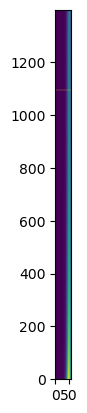

s2n_min:  0.010766416240545225
1400
checking idx_dc:  1094


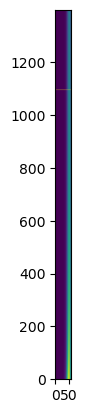

s2n_min:  0.0107615295393458
1400
checking idx_dc:  1095


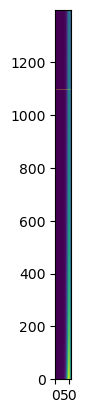

s2n_min:  0.010756649486094363
1400
checking idx_dc:  1096


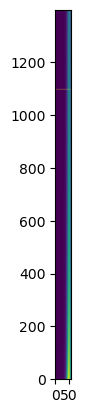

s2n_min:  0.010751776065731281
1400
checking idx_dc:  1097


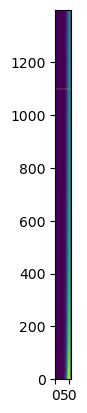

s2n_min:  0.010746909263244635
1400
checking idx_dc:  1098


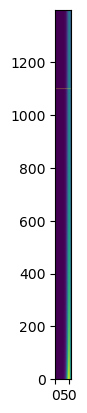

s2n_min:  0.010742049063670026
1400
checking idx_dc:  1099


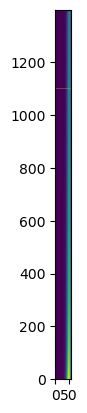

s2n_min:  0.010737195452090391
1400
checking idx_dc:  1100


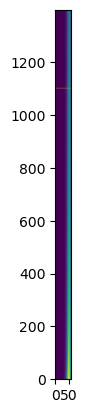

s2n_min:  0.010732348413635797
1400
checking idx_dc:  1101


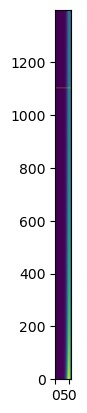

s2n_min:  0.010727507933483262
1400
checking idx_dc:  1102


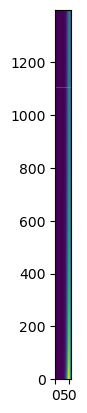

s2n_min:  0.01072267399685656
1400
checking idx_dc:  1103


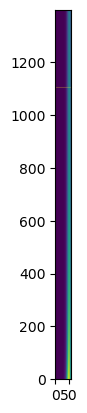

s2n_min:  0.010717846589026027
1400
checking idx_dc:  1104


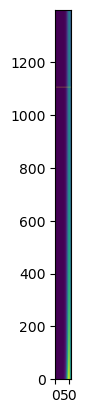

s2n_min:  0.010713025695308385
1400
checking idx_dc:  1105


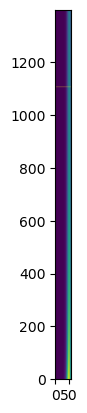

s2n_min:  0.010708211301066538
1400
checking idx_dc:  1106


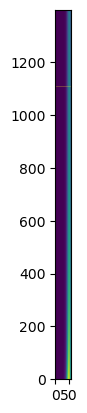

s2n_min:  0.010703403391709401
1400
checking idx_dc:  1107


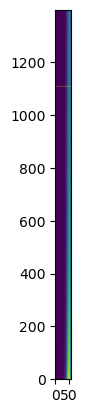

s2n_min:  0.0106986019526917
1400
checking idx_dc:  1108


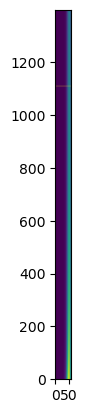

s2n_min:  0.010693806969513794
1400
checking idx_dc:  1109


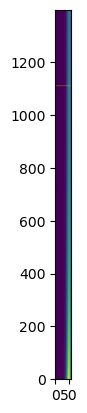

s2n_min:  0.010689018427721502
1400
checking idx_dc:  1110


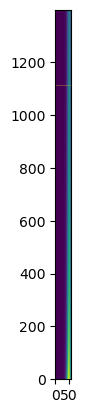

s2n_min:  0.010684236312905894
1400
checking idx_dc:  1111


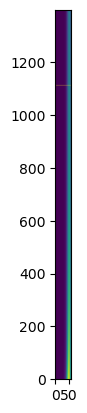

s2n_min:  0.010679460610703137
1400
checking idx_dc:  1112


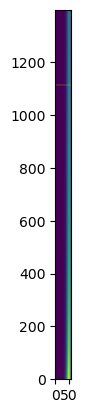

s2n_min:  0.010674691306794291
1400
checking idx_dc:  1113


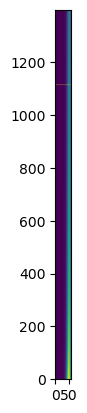

s2n_min:  0.010669928386905147
1400
checking idx_dc:  1114


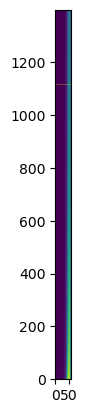

s2n_min:  0.010665171836806035
1400
checking idx_dc:  1115


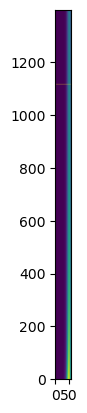

s2n_min:  0.010660421642311648
1400
checking idx_dc:  1116


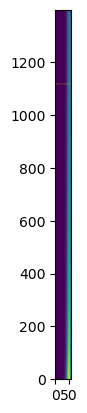

s2n_min:  0.010655677789280867
1400
checking idx_dc:  1117


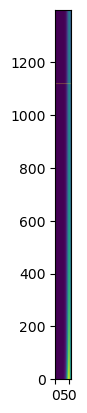

s2n_min:  0.010650940263616585
1400
checking idx_dc:  1118


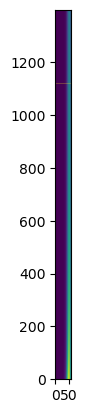

s2n_min:  0.010646209051265527
1400
checking idx_dc:  1119


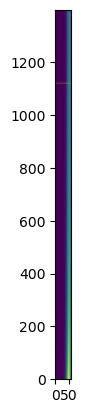

s2n_min:  0.01064148413821808
1400
checking idx_dc:  1120


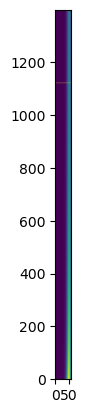

s2n_min:  0.010636765510508114
1400
checking idx_dc:  1121


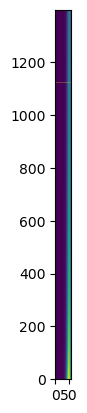

s2n_min:  0.010632053154212806
1400
checking idx_dc:  1122


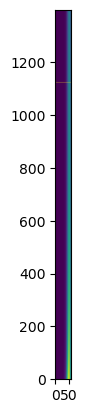

s2n_min:  0.010627347055452482
1400
checking idx_dc:  1123


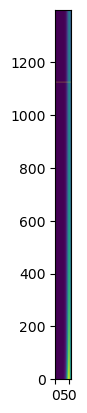

s2n_min:  0.010622647200390424
1400
checking idx_dc:  1124


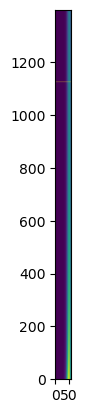

s2n_min:  0.010617953575232719
1400
checking idx_dc:  1125


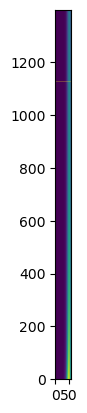

s2n_min:  0.010613266166228076
1400
checking idx_dc:  1126


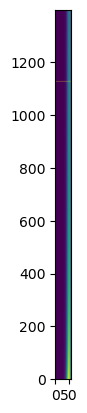

s2n_min:  0.010608584959667666
1400
checking idx_dc:  1127


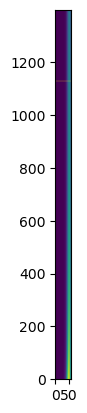

s2n_min:  0.010603909941884936
1400
checking idx_dc:  1128


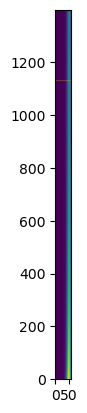

s2n_min:  0.01059924109925547
1400
checking idx_dc:  1129


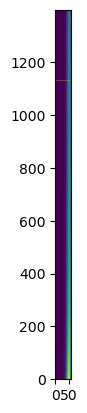

s2n_min:  0.0105945784181968
1400
checking idx_dc:  1130


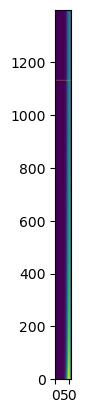

s2n_min:  0.010589921885168243
1400
checking idx_dc:  1131


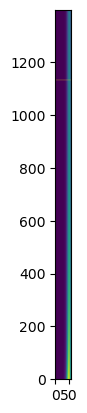

s2n_min:  0.01058527148667074
1400
checking idx_dc:  1132


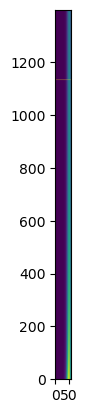

s2n_min:  0.010580627209246699
1400
checking idx_dc:  1133


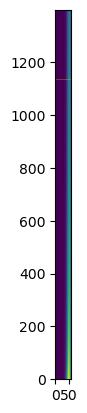

s2n_min:  0.01057598903947981
1400
checking idx_dc:  1134


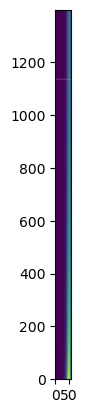

s2n_min:  0.010571356963994907
1400
checking idx_dc:  1135


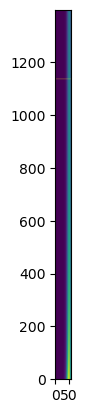

s2n_min:  0.010566730969457792
1400
checking idx_dc:  1136


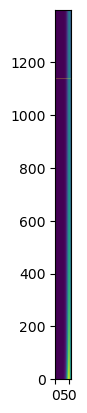

s2n_min:  0.01056211104257507
1400
checking idx_dc:  1137


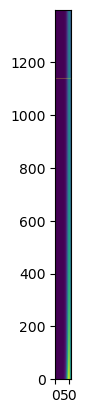

s2n_min:  0.010557497170094
1400
checking idx_dc:  1138


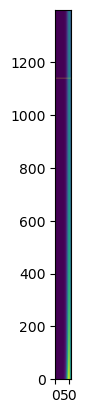

s2n_min:  0.010552889338802333
1400
checking idx_dc:  1139


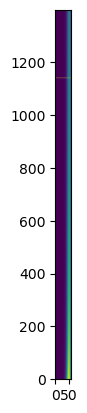

s2n_min:  0.010548287535528146
1400
checking idx_dc:  1140


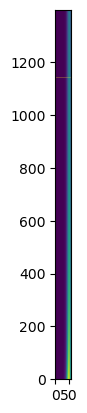

s2n_min:  0.010543691747139688
1400
checking idx_dc:  1141


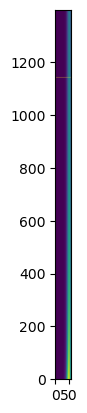

s2n_min:  0.010539101960545227
1400
checking idx_dc:  1142


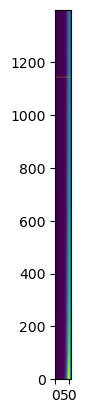

s2n_min:  0.010534518162692881
1400
checking idx_dc:  1143


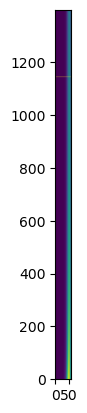

s2n_min:  0.010529940340570478
1400
checking idx_dc:  1144


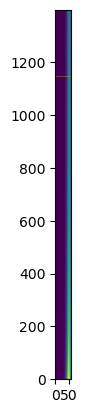

s2n_min:  0.010525368481205393
1400
checking idx_dc:  1145


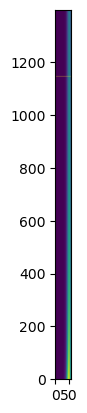

s2n_min:  0.010520802571664389
1400
checking idx_dc:  1146


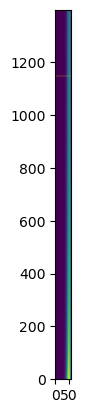

s2n_min:  0.01051624259905347
1400
checking idx_dc:  1147


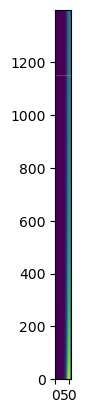

s2n_min:  0.010511688550517727
1400
checking idx_dc:  1148


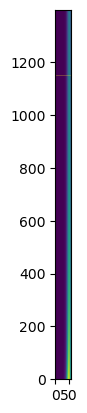

s2n_min:  0.010507140413241184
1400
checking idx_dc:  1149


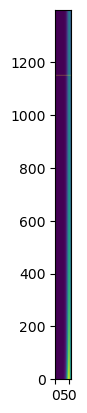

s2n_min:  0.010502598174446648
1400
checking idx_dc:  1150


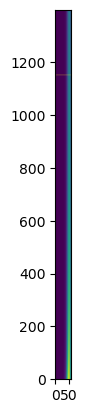

s2n_min:  0.010498061821395559
1400
checking idx_dc:  1151


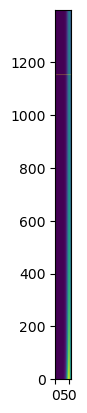

s2n_min:  0.010493531341387833
1400
checking idx_dc:  1152


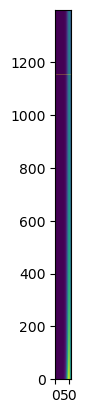

s2n_min:  0.010489006721761727
1400
checking idx_dc:  1153


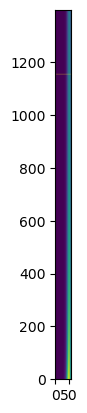

s2n_min:  0.010484487949893675
1400
checking idx_dc:  1154


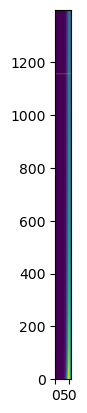

s2n_min:  0.01047997501319815
1400
checking idx_dc:  1155


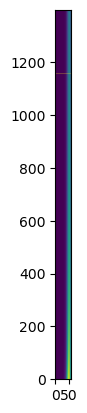

s2n_min:  0.01047546789912751
1400
checking idx_dc:  1156


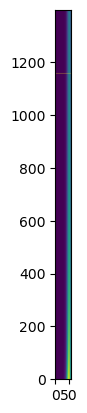

s2n_min:  0.010470966595171863
1400
checking idx_dc:  1157


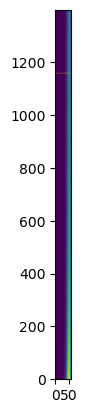

s2n_min:  0.010466471088858901
1400
checking idx_dc:  1158


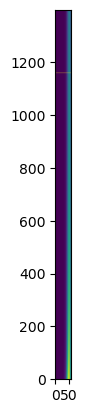

s2n_min:  0.010461981367753776
1400
checking idx_dc:  1159


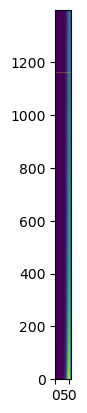

s2n_min:  0.010457497419458946
1400
checking idx_dc:  1160


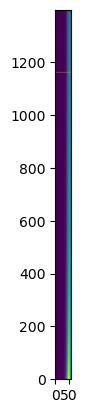

s2n_min:  0.01045301923161403
1400
checking idx_dc:  1161


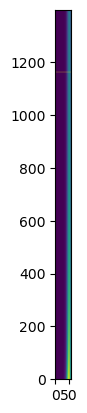

s2n_min:  0.010448546791895663
1400
checking idx_dc:  1162


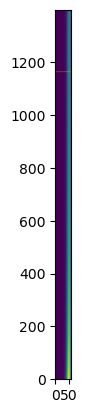

s2n_min:  0.010444080088017364
1400
checking idx_dc:  1163


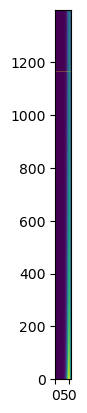

s2n_min:  0.010439619107729383
1400
checking idx_dc:  1164


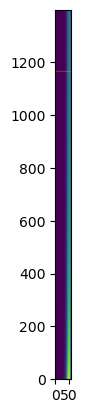

s2n_min:  0.010435163838818567
1400
checking idx_dc:  1165


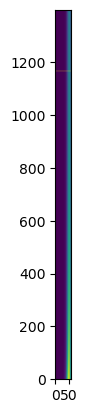

s2n_min:  0.010430714269108217
1400
checking idx_dc:  1166


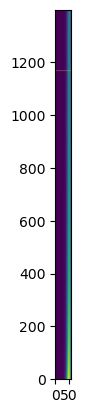

s2n_min:  0.010426270386457943
1400
checking idx_dc:  1167


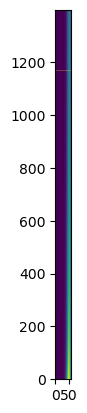

s2n_min:  0.010421832178763538
1400
checking idx_dc:  1168


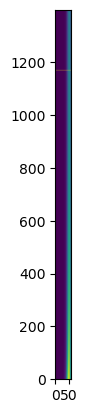

s2n_min:  0.010417399633956824
1400
checking idx_dc:  1169


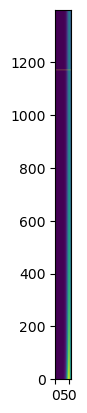

s2n_min:  0.01041297274000553
1400
checking idx_dc:  1170


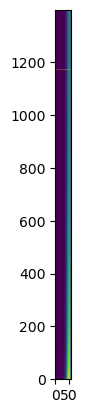

s2n_min:  0.010408551484913136
1400
checking idx_dc:  1171


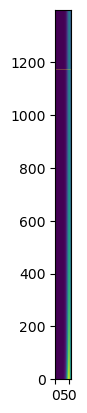

s2n_min:  0.010404135856718759
1400
checking idx_dc:  1172


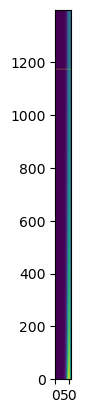

s2n_min:  0.010399725843496995
1400
checking idx_dc:  1173


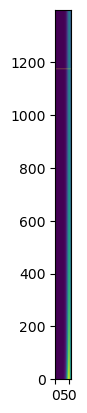

s2n_min:  0.010395321433357797
1400
checking idx_dc:  1174


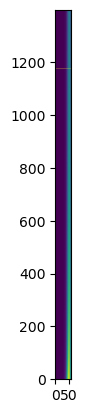

s2n_min:  0.010390922614446343
1400
checking idx_dc:  1175


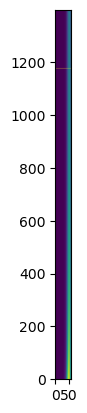

s2n_min:  0.01038652937494289
1400
checking idx_dc:  1176


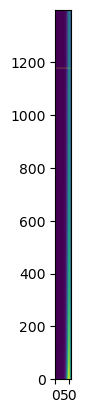

s2n_min:  0.010382141703062644
1400
checking idx_dc:  1177


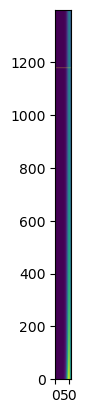

s2n_min:  0.010377759587055639
1400
checking idx_dc:  1178


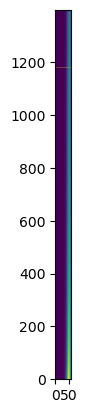

s2n_min:  0.01037338301520659
1400
checking idx_dc:  1179


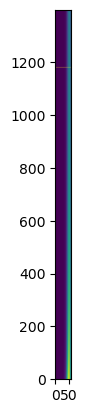

s2n_min:  0.010369011975834766
1400
checking idx_dc:  1180


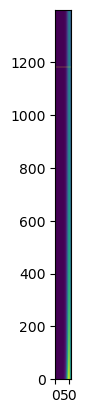

s2n_min:  0.010364646457293868
1400
checking idx_dc:  1181


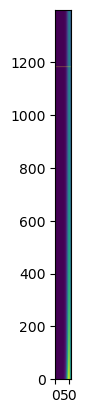

s2n_min:  0.010360286447971878
1400
checking idx_dc:  1182


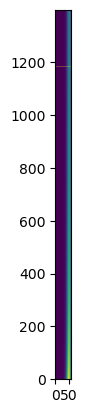

s2n_min:  0.010355931936290958
1400
checking idx_dc:  1183


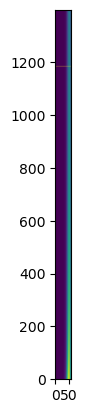

s2n_min:  0.010351582910707294
1400
checking idx_dc:  1184


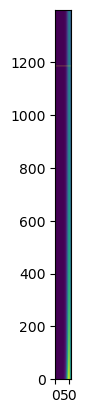

s2n_min:  0.010347239359710984
1400
checking idx_dc:  1185


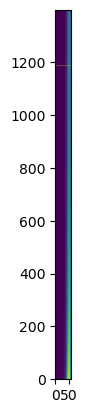

s2n_min:  0.010342901271825902
1400
checking idx_dc:  1186


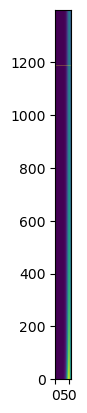

s2n_min:  0.010338568635609575
1400
checking idx_dc:  1187


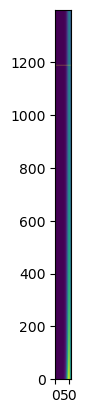

s2n_min:  0.010334241439653053
1400
checking idx_dc:  1188


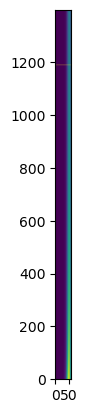

s2n_min:  0.010329919672580783
1400
checking idx_dc:  1189


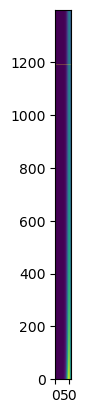

s2n_min:  0.010325603323050492
1400
checking idx_dc:  1190


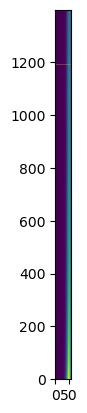

s2n_min:  0.01032129237975305
1400
checking idx_dc:  1191


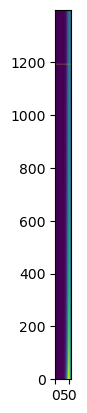

s2n_min:  0.010316986831412347
1400
checking idx_dc:  1192


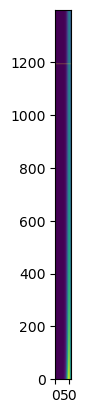

s2n_min:  0.010312686666785177
1400
checking idx_dc:  1193


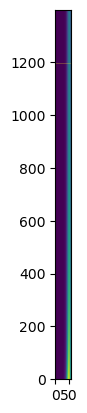

s2n_min:  0.010308391874661114
1400
checking idx_dc:  1194


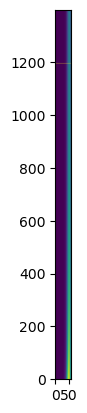

s2n_min:  0.010304102443862375
1400
checking idx_dc:  1195


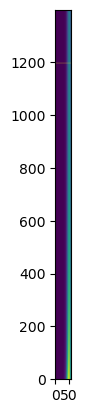

s2n_min:  0.010299818363243719
1400
checking idx_dc:  1196


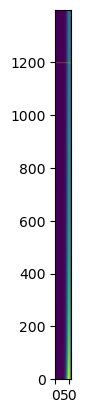

s2n_min:  0.010295539621692303
1400
checking idx_dc:  1197


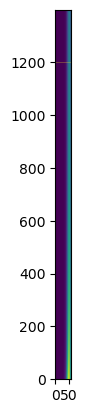

s2n_min:  0.010291266208127585
1400
checking idx_dc:  1198


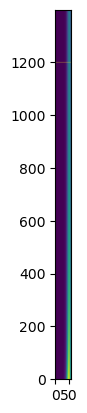

s2n_min:  0.010286998111501184
1400
checking idx_dc:  1199


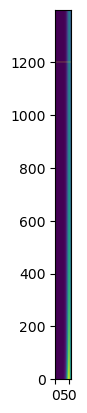

s2n_min:  0.010282735320796767
1400
checking idx_dc:  1200


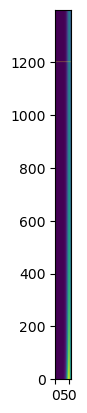

s2n_min:  0.010278477825029931
1400
checking idx_dc:  1201


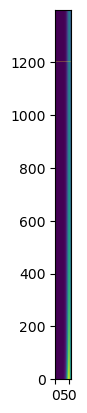

s2n_min:  0.010274225613248086
1400
checking idx_dc:  1202


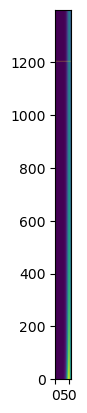

s2n_min:  0.010269978674530325
1400
checking idx_dc:  1203


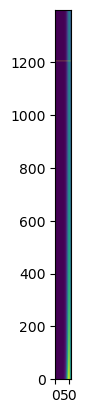

s2n_min:  0.010265736997987324
1400
checking idx_dc:  1204


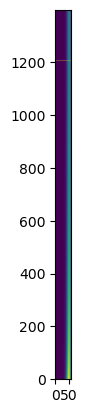

s2n_min:  0.010261500572761213
1400
checking idx_dc:  1205


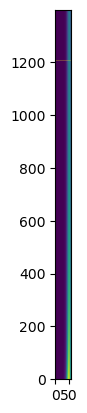

s2n_min:  0.010257269388025453
1400
checking idx_dc:  1206


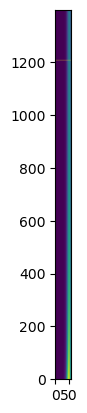

s2n_min:  0.01025304343298474
1400
checking idx_dc:  1207


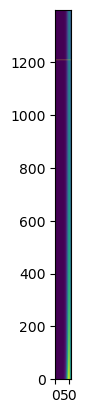

s2n_min:  0.010248822696874873
1400
checking idx_dc:  1208


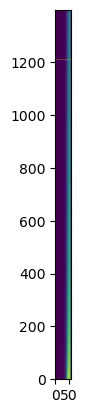

s2n_min:  0.010244607168962644
1400
checking idx_dc:  1209


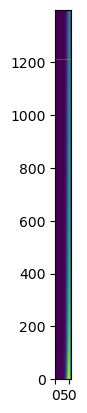

s2n_min:  0.01024039683854572
1400
checking idx_dc:  1210


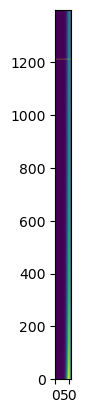

s2n_min:  0.010236191694952537
1400
checking idx_dc:  1211


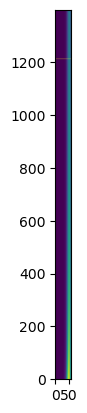

s2n_min:  0.010231991727542175
1400
checking idx_dc:  1212


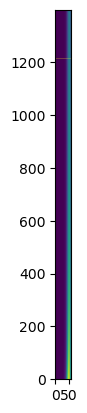

s2n_min:  0.01022779692570426
1400
checking idx_dc:  1213


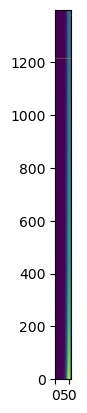

s2n_min:  0.010223607278858833
1400
checking idx_dc:  1214


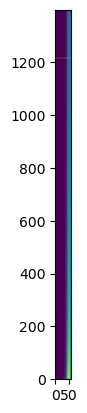

s2n_min:  0.010219422776456256
1400
checking idx_dc:  1215


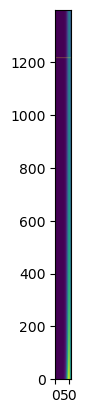

s2n_min:  0.010215243407977083
1400
checking idx_dc:  1216


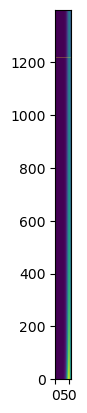

s2n_min:  0.010211069162931964
1400
checking idx_dc:  1217


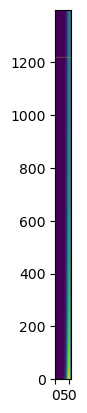

s2n_min:  0.01020690003086153
1400
checking idx_dc:  1218


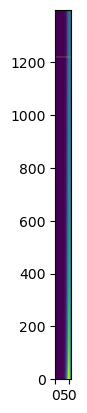

s2n_min:  0.010202736001336277
1400
checking idx_dc:  1219


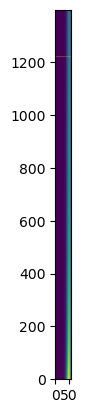

s2n_min:  0.01019857706395646
1400
checking idx_dc:  1220


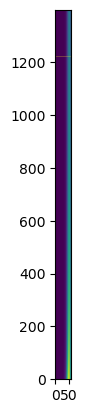

s2n_min:  0.010194423208351984
1400
checking idx_dc:  1221


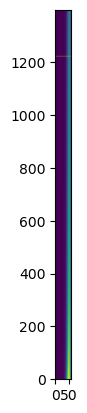

s2n_min:  0.010190274424182303
1400
checking idx_dc:  1222


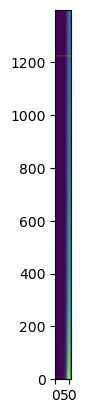

s2n_min:  0.010186130701136298
1400
checking idx_dc:  1223


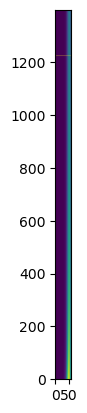

s2n_min:  0.010181992028932179
1400
checking idx_dc:  1224


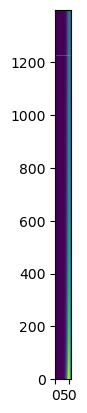

s2n_min:  0.010177858397317373
1400
checking idx_dc:  1225


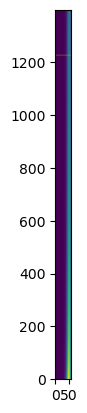

s2n_min:  0.01017372979606842
1400
checking idx_dc:  1226


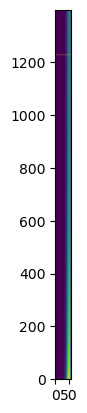

s2n_min:  0.010169606214990868
1400
checking idx_dc:  1227


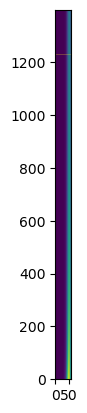

s2n_min:  0.010165487643919165
1400
checking idx_dc:  1228


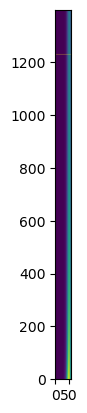

s2n_min:  0.010161374072716552
1400
checking idx_dc:  1229


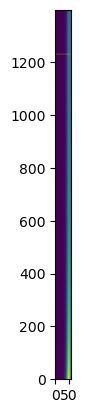

s2n_min:  0.01015726549127496
1400
checking idx_dc:  1230


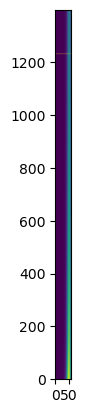

s2n_min:  0.010153161889514912
1400
checking idx_dc:  1231


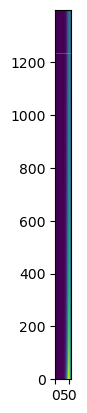

s2n_min:  0.010149063257385406
1400
checking idx_dc:  1232


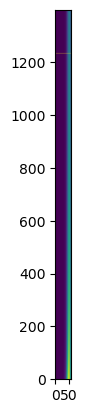

s2n_min:  0.010144969584863824
1400
checking idx_dc:  1233


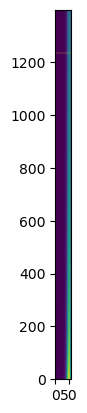

s2n_min:  0.010140880861955819
1400
checking idx_dc:  1234


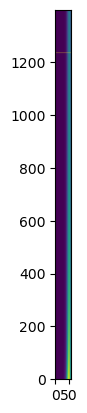

s2n_min:  0.010136797078695223
1400
checking idx_dc:  1235


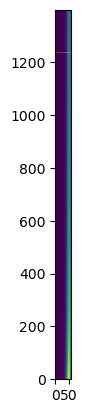

s2n_min:  0.010132718225143935
1400
checking idx_dc:  1236


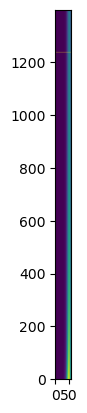

s2n_min:  0.010128644291391826
1400
checking idx_dc:  1237


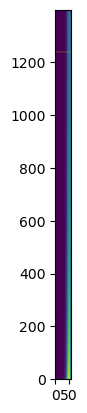

s2n_min:  0.010124575267556633
1400
checking idx_dc:  1238


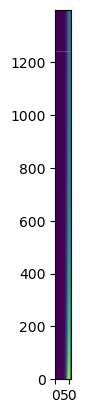

s2n_min:  0.010120511143783867
1400
checking idx_dc:  1239


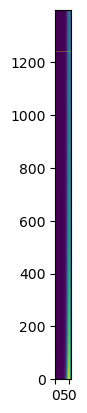

s2n_min:  0.0101164519102467
1400
checking idx_dc:  1240


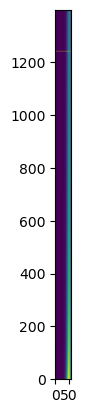

s2n_min:  0.010112397557145875
1400
checking idx_dc:  1241


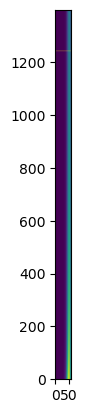

s2n_min:  0.010108348074709604
1400
checking idx_dc:  1242


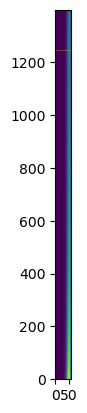

s2n_min:  0.010104303453193469
1400
checking idx_dc:  1243


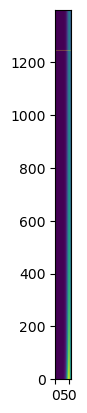

s2n_min:  0.010100263682880318
1400
checking idx_dc:  1244


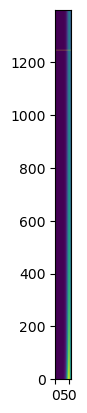

s2n_min:  0.01009622875408018
1400
checking idx_dc:  1245


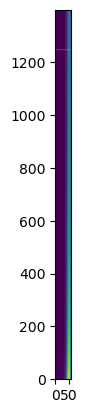

s2n_min:  0.010092198657130158
1400
checking idx_dc:  1246


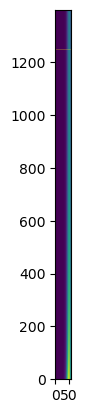

s2n_min:  0.010088173382394327
1400
checking idx_dc:  1247


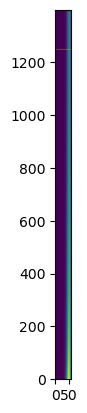

s2n_min:  0.010084152920263649
1400
checking idx_dc:  1248


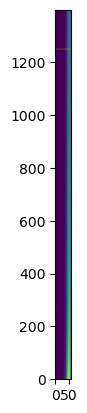

s2n_min:  0.01008013726115587
1400
checking idx_dc:  1249


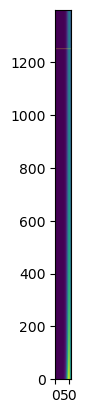

s2n_min:  0.010076126395515429
1400
checking idx_dc:  1250


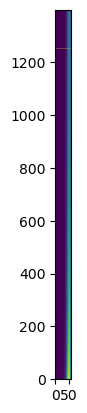

s2n_min:  0.01007212031381335
1400
checking idx_dc:  1251


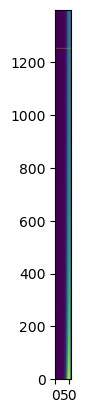

s2n_min:  0.010068119006547164
1400
checking idx_dc:  1252


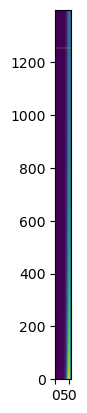

s2n_min:  0.010064122464240802
1400
checking idx_dc:  1253


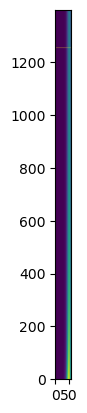

s2n_min:  0.010060130677444505
1400
checking idx_dc:  1254


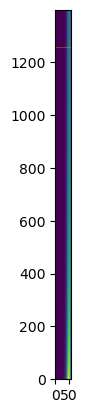

s2n_min:  0.010056143636734733
1400
checking idx_dc:  1255


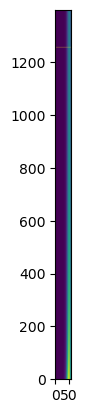

s2n_min:  0.010052161332714065
1400
checking idx_dc:  1256


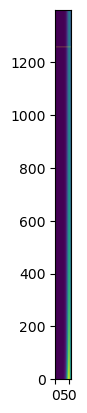

s2n_min:  0.01004818375601111
1400
checking idx_dc:  1257


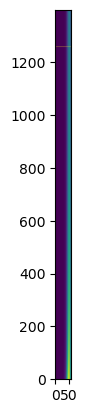

s2n_min:  0.010044210897280416
1400
checking idx_dc:  1258


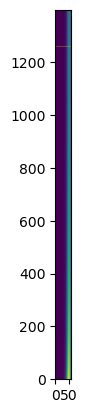

s2n_min:  0.010040242747202374
1400
checking idx_dc:  1259


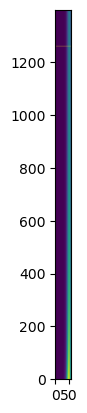

s2n_min:  0.01003627929648313
1400
checking idx_dc:  1260


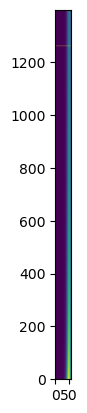

s2n_min:  0.010032320535854487
1400
checking idx_dc:  1261


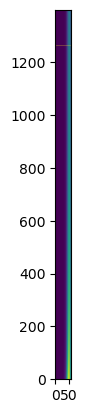

s2n_min:  0.01002836645607382
1400
checking idx_dc:  1262


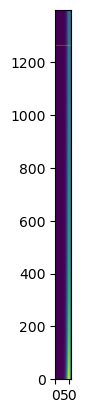

s2n_min:  0.010024417047923988
1400
checking idx_dc:  1263


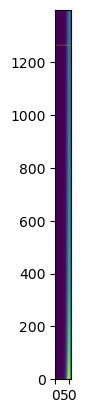

s2n_min:  0.010020472302213234
1400
checking idx_dc:  1264


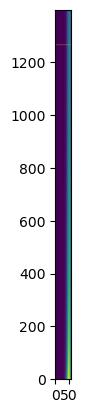

s2n_min:  0.010016532209775103
1400
checking idx_dc:  1265


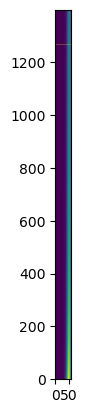

s2n_min:  0.010012596761468352
1400
checking idx_dc:  1266


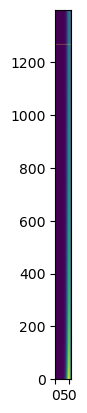

s2n_min:  0.010008665948176855
1400
checking idx_dc:  1267


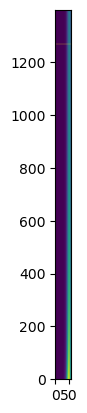

s2n_min:  0.010004739760809522
1400
checking idx_dc:  1268


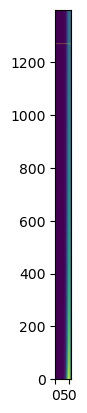

s2n_min:  0.010000818190300203
1400
checking idx_dc:  1269


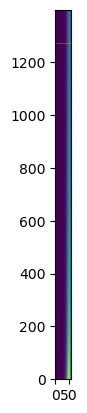

s2n_min:  0.009996901227607612
1400
checking idx_dc:  1270


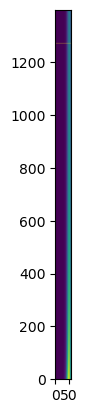

s2n_min:  0.009992988863715224
1400
checking idx_dc:  1271


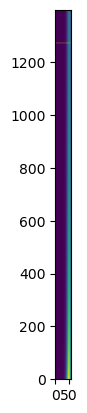

s2n_min:  0.009989081089631197
1400
checking idx_dc:  1272


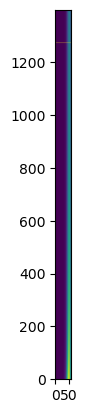

s2n_min:  0.009985177896388286
1400
checking idx_dc:  1273


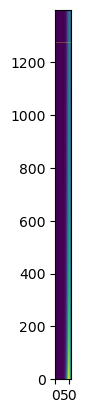

s2n_min:  0.00998127927504375
1400
checking idx_dc:  1274


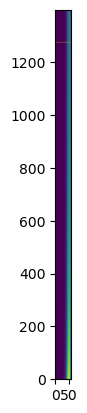

s2n_min:  0.00997738521667928
1400
checking idx_dc:  1275


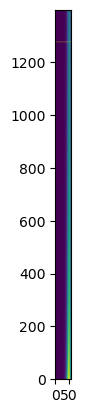

s2n_min:  0.009973495712400892
1400
checking idx_dc:  1276


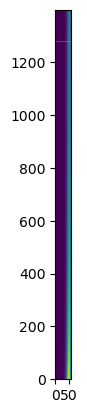

s2n_min:  0.00996961075333886
1400
checking idx_dc:  1277


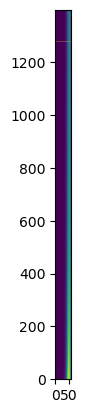

s2n_min:  0.00996573033064762
1400
checking idx_dc:  1278


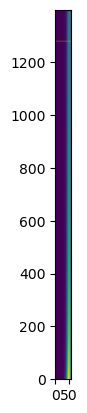

s2n_min:  0.00996185443550569
1400
checking idx_dc:  1279


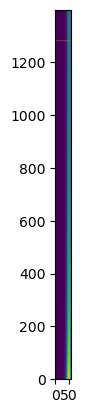

s2n_min:  0.009957983059115594
1400
checking idx_dc:  1280


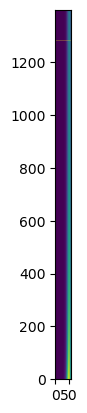

s2n_min:  0.009954116192703758
1400
checking idx_dc:  1281


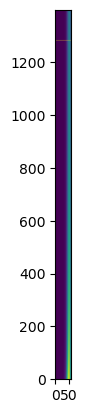

s2n_min:  0.009950253827520444
1400
checking idx_dc:  1282


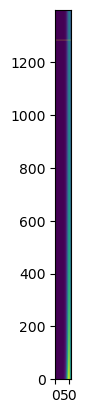

s2n_min:  0.00994639595483966
1400
checking idx_dc:  1283


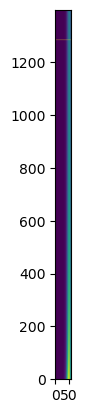

s2n_min:  0.009942542565959077
1400
checking idx_dc:  1284


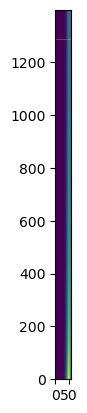

s2n_min:  0.00993869365219995
1400
checking idx_dc:  1285


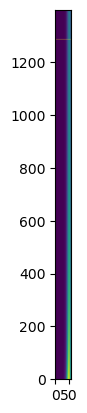

s2n_min:  0.009934849204907031
1400
checking idx_dc:  1286


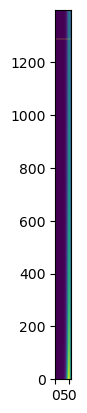

s2n_min:  0.009931009215448495
1400
checking idx_dc:  1287


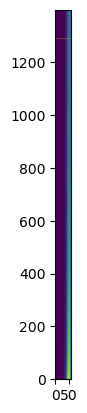

s2n_min:  0.00992717367521584
1400
checking idx_dc:  1288


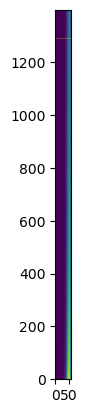

s2n_min:  0.009923342575623838
1400
checking idx_dc:  1289


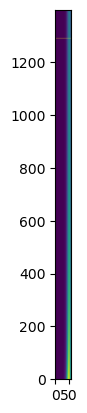

s2n_min:  0.009919515908110424
1400
checking idx_dc:  1290


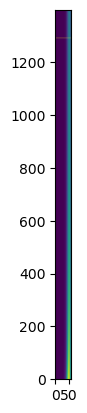

s2n_min:  0.009915693664136626
1400
checking idx_dc:  1291


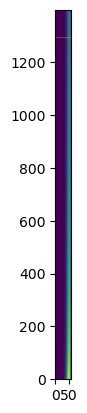

s2n_min:  0.009911875835186492
1400
checking idx_dc:  1292


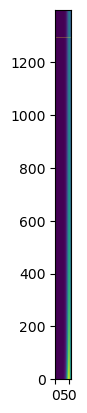

s2n_min:  0.009908062412767003
1400
checking idx_dc:  1293


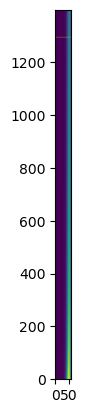

s2n_min:  0.009904253388407997
1400
checking idx_dc:  1294


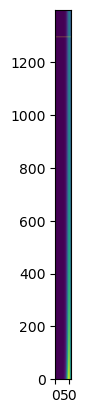

s2n_min:  0.009900448753662082
1400
checking idx_dc:  1295


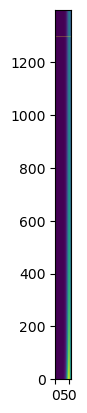

s2n_min:  0.009896648500104568
1400
checking idx_dc:  1296


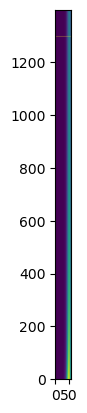

s2n_min:  0.009892852619333386
1400
checking idx_dc:  1297


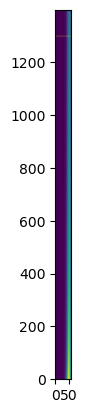

s2n_min:  0.009889061102969
1400
checking idx_dc:  1298


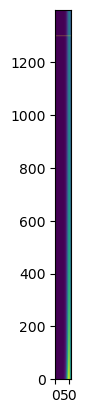

s2n_min:  0.009885273942654349
1400
checking idx_dc:  1299


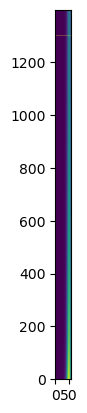

s2n_min:  0.009881491130054753
1400
checking idx_dc:  1300


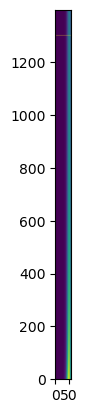

s2n_min:  0.009877712656857834
1400
checking idx_dc:  1301


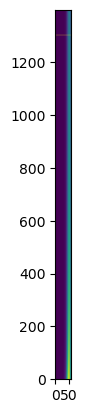

s2n_min:  0.009873938514773455
1400
checking idx_dc:  1302


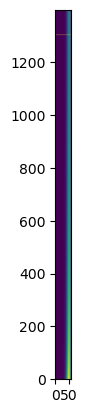

s2n_min:  0.009870168695533636
1400
checking idx_dc:  1303


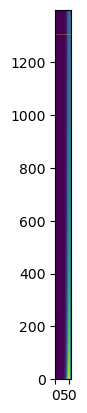

s2n_min:  0.009866403190892471
1400
checking idx_dc:  1304


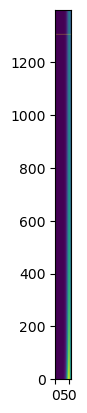

s2n_min:  0.009862641992626058
1400
checking idx_dc:  1305


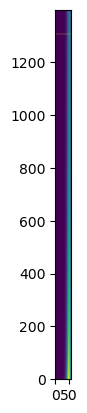

s2n_min:  0.009858885092532431
1400
checking idx_dc:  1306


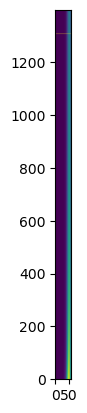

s2n_min:  0.009855132482431467
1400
checking idx_dc:  1307


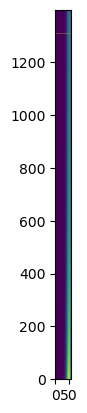

s2n_min:  0.00985138415416483
1400
checking idx_dc:  1308


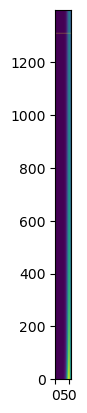

s2n_min:  0.009847640099595888
1400
checking idx_dc:  1309


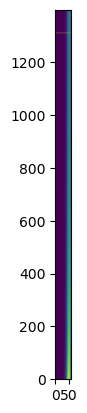

s2n_min:  0.009843900310609636
1400
checking idx_dc:  1310


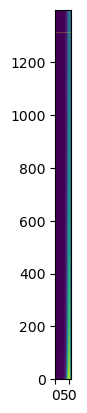

s2n_min:  0.009840164779112622
1400
checking idx_dc:  1311


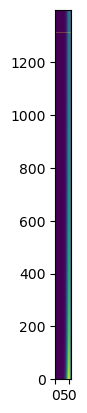

s2n_min:  0.009836433497032886
1400
checking idx_dc:  1312


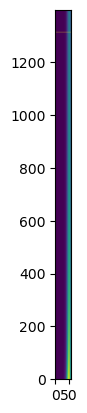

s2n_min:  0.009832706456319866
1400
checking idx_dc:  1313


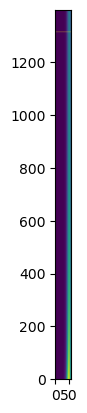

s2n_min:  0.009828983648944346
1400
checking idx_dc:  1314


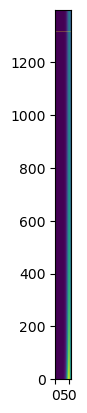

s2n_min:  0.00982526506689837
1400
checking idx_dc:  1315


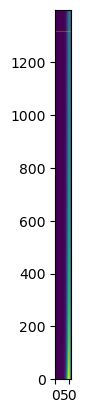

s2n_min:  0.009821550702195172
1400
checking idx_dc:  1316


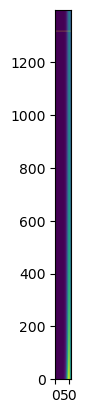

s2n_min:  0.00981784054686911
1400
checking idx_dc:  1317


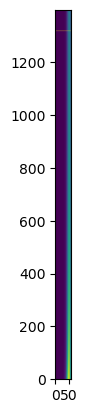

s2n_min:  0.009814134592975582
1400
checking idx_dc:  1318


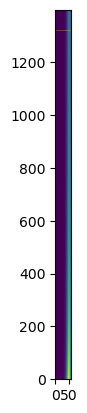

s2n_min:  0.00981043283259097
1400
checking idx_dc:  1319


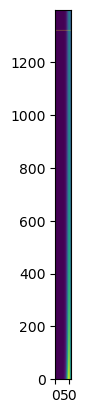

s2n_min:  0.009806735257812556
1400
checking idx_dc:  1320


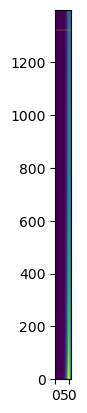

s2n_min:  0.00980304186075846
1400
checking idx_dc:  1321


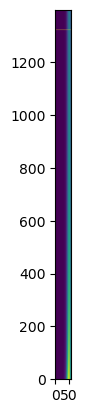

s2n_min:  0.00979935263356756
1400
checking idx_dc:  1322


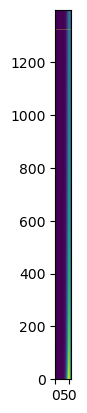

s2n_min:  0.009795667568399433
1400
checking idx_dc:  1323


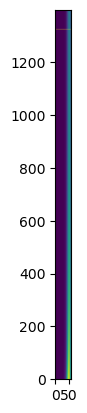

s2n_min:  0.009791986657434276
1400
checking idx_dc:  1324


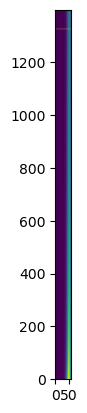

s2n_min:  0.009788309892872842
1400
checking idx_dc:  1325


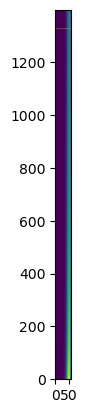

s2n_min:  0.009784637266936368
1400
checking idx_dc:  1326


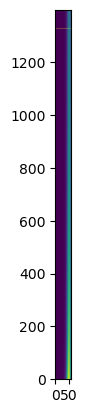

s2n_min:  0.009780968771866502
1400
checking idx_dc:  1327


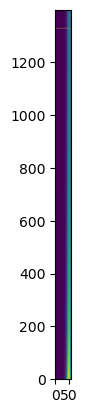

s2n_min:  0.009777304399925245
1400
checking idx_dc:  1328


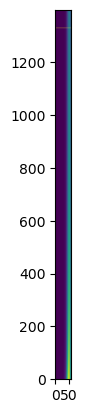

s2n_min:  0.009773644143394867
1400
checking idx_dc:  1329


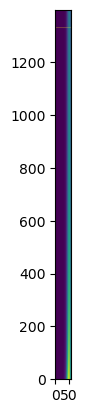

s2n_min:  0.009769987994577857
1400
checking idx_dc:  1330


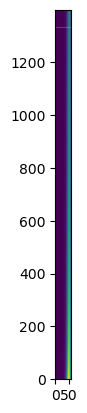

s2n_min:  0.00976633594579684
1400
checking idx_dc:  1331


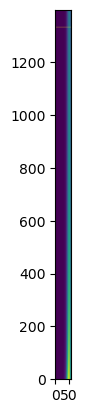

s2n_min:  0.009762687989394513
1400
checking idx_dc:  1332


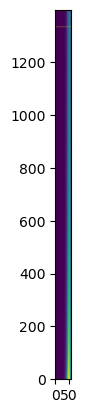

s2n_min:  0.009759044117733586
1400
checking idx_dc:  1333


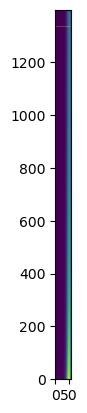

s2n_min:  0.009755404323196704
1400
checking idx_dc:  1334


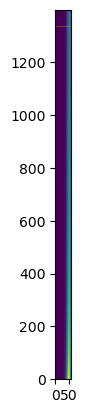

s2n_min:  0.009751768598186382
1400
checking idx_dc:  1335


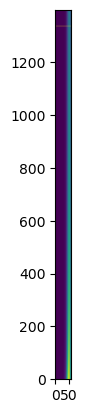

s2n_min:  0.009748136935124947
1400
checking idx_dc:  1336


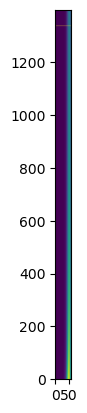

s2n_min:  0.009744509326454457
1400
checking idx_dc:  1337


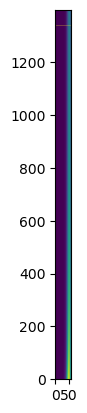

s2n_min:  0.00974088576463665
1400
checking idx_dc:  1338


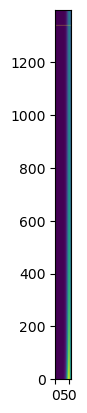

s2n_min:  0.009737266242152869
1400
checking idx_dc:  1339


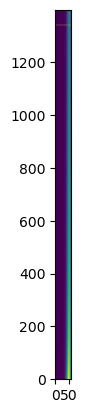

s2n_min:  0.009733650751504003
1400
checking idx_dc:  1340


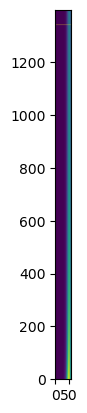

s2n_min:  0.00973003928521041
1400
checking idx_dc:  1341


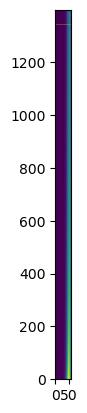

s2n_min:  0.009726431835811865
1400
checking idx_dc:  1342


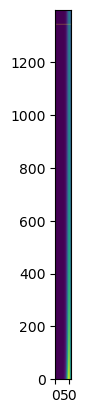

s2n_min:  0.00972282839586749
1400
checking idx_dc:  1343


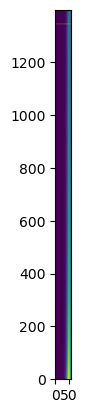

s2n_min:  0.009719228957955683
1400
checking idx_dc:  1344


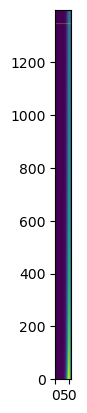

s2n_min:  0.009715633514674075
1400
checking idx_dc:  1345


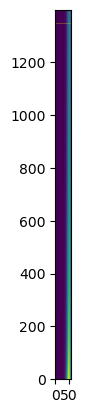

s2n_min:  0.009712042058639436
1400
checking idx_dc:  1346


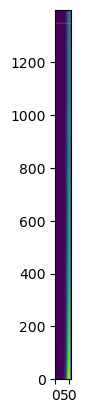

s2n_min:  0.009708454582487635
1400
checking idx_dc:  1347


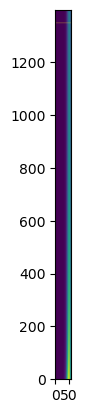

s2n_min:  0.009704871078873563
1400
checking idx_dc:  1348


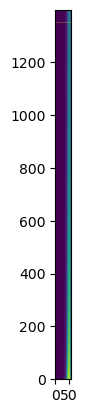

s2n_min:  0.009701291540471082
1400
checking idx_dc:  1349


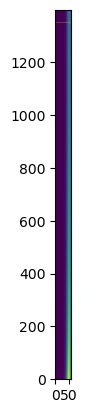

s2n_min:  0.009697715959972951
1400
checking idx_dc:  1350


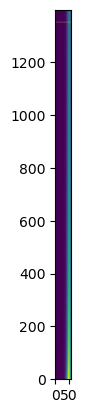

s2n_min:  0.009694144330090767
1400
checking idx_dc:  1351


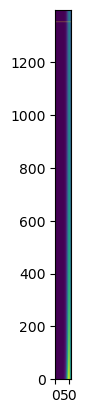

s2n_min:  0.009690576643554907
1400
checking idx_dc:  1352


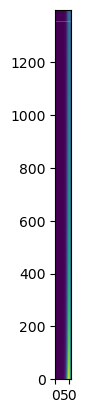

s2n_min:  0.009687012893114454
1400
checking idx_dc:  1353


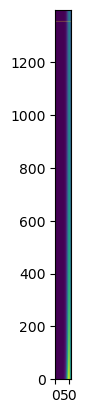

s2n_min:  0.009683453071537153
1400
checking idx_dc:  1354


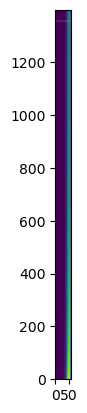

s2n_min:  0.009679897171609336
1400
checking idx_dc:  1355


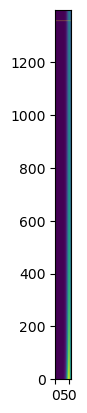

s2n_min:  0.009676345186135861
1400
checking idx_dc:  1356


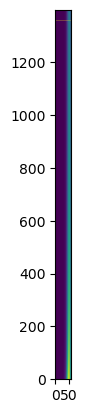

s2n_min:  0.009672797107940055
1400
checking idx_dc:  1357


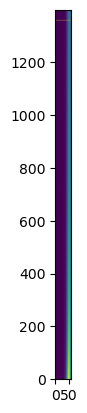

s2n_min:  0.009669252929863655
1400
checking idx_dc:  1358


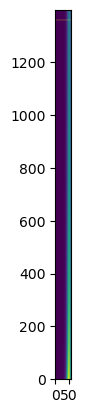

s2n_min:  0.009665712644766743
1400
checking idx_dc:  1359


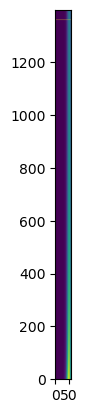

s2n_min:  0.009662176245527688
1400
checking idx_dc:  1360


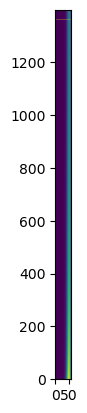

s2n_min:  0.009658643725043081
1400
checking idx_dc:  1361


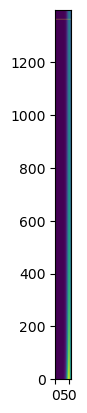

s2n_min:  0.009655115076227681
1400
checking idx_dc:  1362


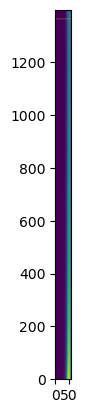

s2n_min:  0.009651590292014355
1400
checking idx_dc:  1363


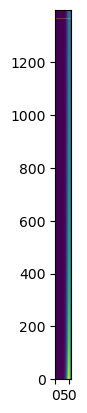

s2n_min:  0.009648069365354015
1400
checking idx_dc:  1364


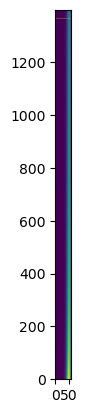

s2n_min:  0.009644552289215564
1400
checking idx_dc:  1365


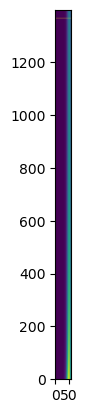

s2n_min:  0.009641039056585825
1400
checking idx_dc:  1366


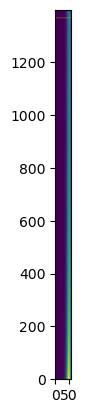

s2n_min:  0.009637529660469497
1400
checking idx_dc:  1367


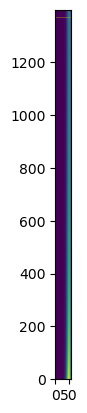

s2n_min:  0.009634024093889094
1400
checking idx_dc:  1368


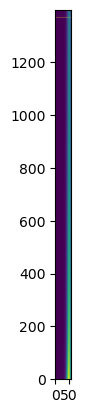

s2n_min:  0.00963052234988488
1400
checking idx_dc:  1369


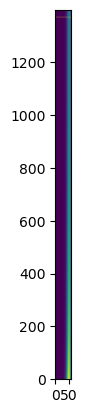

s2n_min:  0.009627024421514807
1400
checking idx_dc:  1370


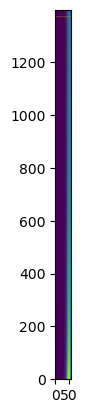

s2n_min:  0.009623530301854474
1400
checking idx_dc:  1371


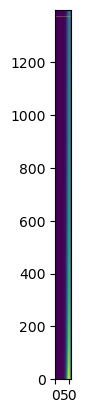

s2n_min:  0.009620039983997053
1400
checking idx_dc:  1372


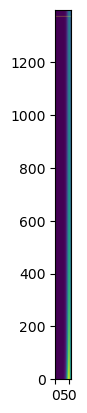

s2n_min:  0.009616553461053242
1400
checking idx_dc:  1373


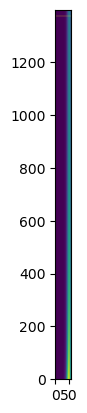

s2n_min:  0.009613070726151206
1400
checking idx_dc:  1374


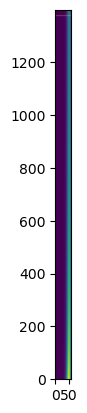

s2n_min:  0.009609591772436516
1400
checking idx_dc:  1375


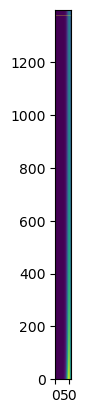

s2n_min:  0.00960611659307209
1400
checking idx_dc:  1376


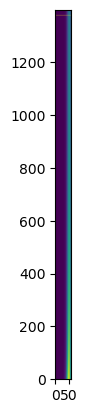

s2n_min:  0.009602645181238151
1400
checking idx_dc:  1377


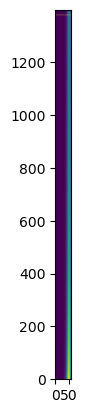

s2n_min:  0.009599177530132149
1400
checking idx_dc:  1378


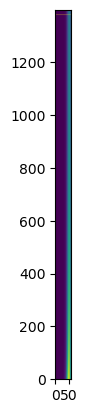

s2n_min:  0.00959571363296873
1400
checking idx_dc:  1379


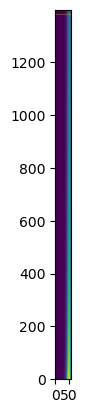

s2n_min:  0.00959225348297966
1400
checking idx_dc:  1380


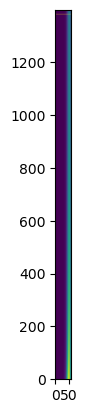

s2n_min:  0.009588797073413778
1400
checking idx_dc:  1381


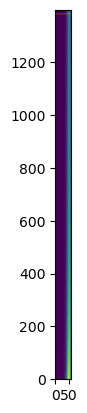

s2n_min:  0.009585344397536937
1400
checking idx_dc:  1382


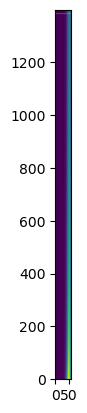

s2n_min:  0.009581895448631951
1400
checking idx_dc:  1383


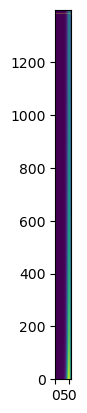

s2n_min:  0.009578450219998551
1400
checking idx_dc:  1384


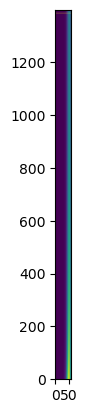

s2n_min:  0.009575008704953307
1400
checking idx_dc:  1385


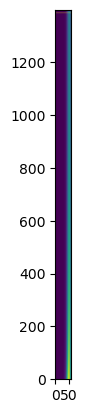

s2n_min:  0.009571570896829591
1400
checking idx_dc:  1386


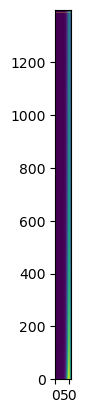

s2n_min:  0.009568136788977518
1400
checking idx_dc:  1387


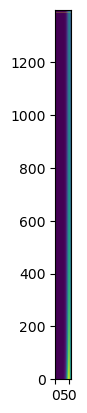

s2n_min:  0.009564706374763893
1400
checking idx_dc:  1388


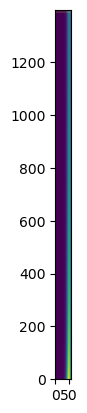

s2n_min:  0.009561279647572156
1400
checking idx_dc:  1389


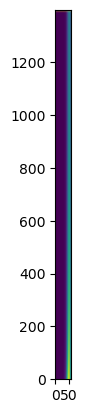

s2n_min:  0.009557856600802328
1400
checking idx_dc:  1390


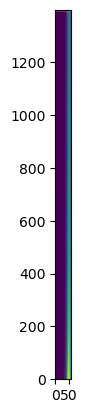

s2n_min:  0.009554437227870957
1400
checking idx_dc:  1391


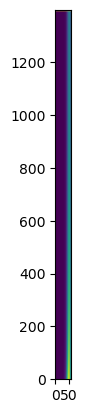

s2n_min:  0.009551021522211068
1400
checking idx_dc:  1392


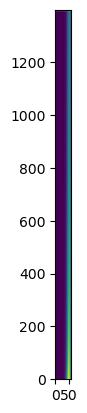

s2n_min:  0.009547609477272106
1400
checking idx_dc:  1393


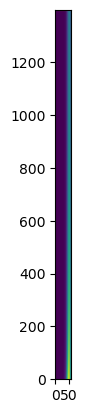

s2n_min:  0.00954420108651989
1400
checking idx_dc:  1394


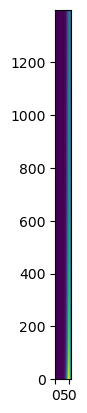

s2n_min:  0.00954079634343655
1400
checking idx_dc:  1395


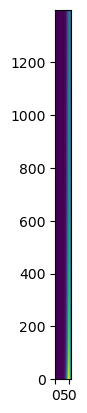

s2n_min:  0.009537395241520483
1400
checking idx_dc:  1396


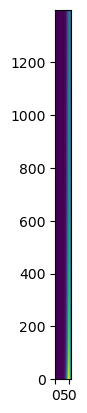

s2n_min:  0.0095339977742863
1400
checking idx_dc:  1397


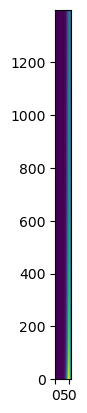

s2n_min:  0.009530603935264769
1400
checking idx_dc:  1398


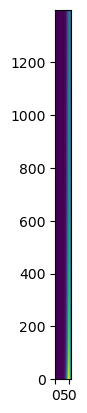

s2n_min:  0.009527213718002768
1400
checking idx_dc:  1399


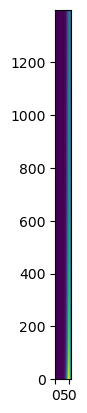

s2n_min:  0.009523827116063234


UnboundLocalError: local variable 'dc_max' referenced before assignment

In [14]:
test_dc_max, test_s2n_desired_int = dc_from_s2n_and_lambda(s2n_sample_slice=s2n_sample_slice, 
                            s2n_cube=s2n_cube, 
                            n_int_array=n_int_array, 
                            n_int_desired=396100, 
                            wavel_min=10.)

In [50]:
test_dc_max.shape

(1, 1400, 61)

In [45]:
test_s2n_desired_int.shape

(4, 1400, 61)

In [46]:

plt.imshow(test_s2n_desired_int[0,:,:])
plt.show()